In [20]:
## Loading libraries

import os
import geopandas as gpd
import pandas as pd
import rasterio as rio
import os

# 1. Building dataset 

## 1. Define sub-basins

### Subcuencas

In [21]:
shape_cop = r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\databases\03_BoundariesSouthAmerica"
path_water_shed = r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\OriginalDB\hybas_sa_lev08_v1c"

paises = gpd.read_file(os.path.join(shape_cop,'Paises_America_del_Sur_GEOGPSPERU_SuyoPomalia.shp'))
ws = gpd.read_file(os.path.join(path_water_shed, 'hybas_sa_lev08_v1c.shp'))

# Method 2: Or reproject Colombia to Geographic (simpler)
colombia_geo = paises[paises.NOMBRE == 'Colombia'].to_crs('EPSG:4326') 
# Use union_all() instead of unary_union
colombia_geom = colombia_geo.geometry.union_all()
ws_colombia = ws[ws.geometry.intersects(colombia_geom)]

# Verify results
print(f"Total South America watersheds: {len(ws)}")
print(f"Colombia watersheds: {len(ws_colombia)}")
print(f"Colombia CRS: {ws_colombia.crs}")

Total South America watersheds: 23783
Colombia watersheds: 1700
Colombia CRS: EPSG:4326


<Axes: >

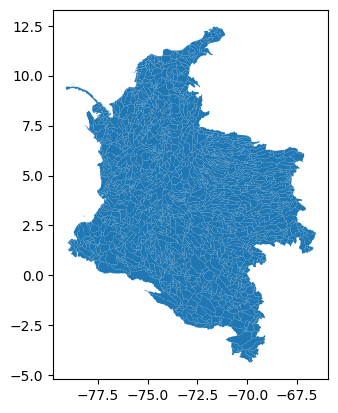

In [22]:
ws_colombia.geometry.plot()

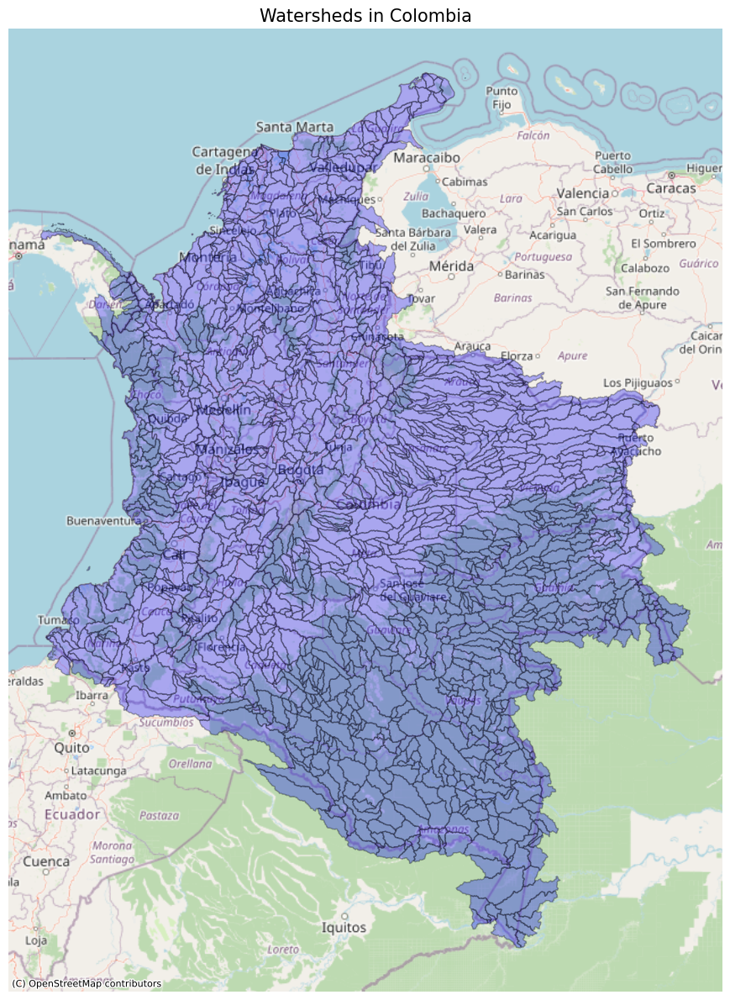

In [26]:
import matplotlib.pyplot as plt
import contextily as ctx

# Ensure CRS is EPSG:3857 (Web Mercator), which is required by contextily
if ws_colombia.crs.to_epsg() != 3857:
    ws_colombia = ws_colombia.to_crs(epsg=3857)

# Plot with context
fig, ax = plt.subplots(figsize=(12, 12))  # Bigger figure
ws_colombia.plot(ax=ax, alpha=0.3, edgecolor='k', color='blue')

# Add basemap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Optional: remove axes for cleaner map
ax.set_axis_off()

plt.title("Watersheds in Colombia", fontsize=15)
plt.tight_layout()

plt.savefig(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\Graficas\Entrega 2\Subbasins_raw.png")
plt.show()


In [5]:
ws_colombia.to_file(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\databases\Watershed\WaterShed_cop.shp")

In [5]:
os.listdir(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\databases\Watershed\hybas_sa_lev08")

['colombia_watersheds_elevation_slope_geojson.geojson',
 'colombia_watersheds_elevation_slope_shapefile.cpg',
 'colombia_watersheds_elevation_slope_shapefile.dbf',
 'colombia_watersheds_elevation_slope_shapefile.fix',
 'colombia_watersheds_elevation_slope_shapefile.prj',
 'colombia_watersheds_elevation_slope_shapefile.shp',
 'colombia_watersheds_elevation_slope_shapefile.shx',
 'colombia_watersheds_elevation_slope_stats.csv']

In [1]:
## import pandas as pd
import geopandas as gpd
from Codigo.areal_handling.EDA import main_slope_analysis

ws_stat = gpd.read_file(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\databases\Watershed\hybas_sa_lev08_v3\colombia_watersheds_elevation_slope_shapefile.shp")

In [2]:
ws_stat.head()

,elev_std,SUB_AREA,elev_max,COAST,slope_std,PFAF_ID,DIST_MAIN,DIST_SINK,HYBAS_ID,NEXT_DOWN,...,slope_min,MAIN_BAS,elev_min,slope_p90,SORT,NEXT_SINK,slope_mean,slope_max,UP_AREA,geometry
0,111.251029,346.9,634,0,5.450260,61100213,1.7,1.7,6080078040,6080000200,...,0.0,6080000200,-12,11.407114,11,6080000200,4.018225,44.060051,35518.1,"POLYGON ((-77.17981 7.93842, -77.17843 7.95758..."
1,314.648191,476.8,1555,0,9.522432,61100212,1.7,1.7,6080078010,6080000200,...,0.0,6080000200,-6,24.241631,12,6080000200,9.887934,69.184029,477.1,"POLYGON ((-77.23777 8.12803, -77.23333 8.12917..."
2,114.591218,442.1,578,0,5.878972,61100215,35.8,35.8,6080081280,6080078040,...,0.0,6080000200,-24,14.276069,13,6080000200,5.545883,73.337868,34722.9,"POLYGON ((-77.29231 7.76522, -77.28537 7.76731..."
3,10.872152,448.4,234,0,2.288169,61100214,35.8,35.8,6080081290,6080078040,...,0.0,6080000200,-11,3.722500,14,6080000200,2.044135,47.997501,448.4,"POLYGON ((-77.09223 7.72158, -77.08807 7.72696..."
4,147.406667,847.4,1107,0,6.540599,61100216,70.3,70.3,6080084300,6080081280,...,0.0,6080000200,-9,17.269498,15,6080000200,7.976072,67.307343,847.4,"POLYGON ((-77.4875 7.575, -77.48715 7.58576, -..."


🗺️ Choropleth Map Analysis for Slope Data
🚀 Starting Comprehensive Slope Analysis
📊 SLOPE DATA SUMMARY:
------------------------------
slope_min   : 0.0° to 0.9° (mean: 0.0°)
slope_mean  : 0.6° to 30.6° (mean: 8.1°)
slope_max   : 8.5° to 89.3° (mean: 48.2°)
slope_p90   : 2.6° to 45.8° (mean: 15.0°)
slope_p95   : 3.4° to 52.2° (mean: 17.7°)

Total watersheds: 1700
CRS: EPSG:4326
✅ No missing slope values

🗺️ Creating choropleth maps...
🏷️ Creating slope categories...
📊 Slope Category Distribution:
----------------------------------------
Flat (< 5°)         :  972 watersheds ( 57.2%)
Gentle (5-10°)      :  247 watersheds ( 14.5%)
Moderate (10-15°)   :  149 watersheds (  8.8%)
Steep (15-25°)      :  275 watersheds ( 16.2%)
Very Steep (> 25°)  :   57 watersheds (  3.4%)

✅ Analysis complete!
🎯 Ready to analyze your slope data!
👆 Load your GeoDataFrame and run: main_slope_analysis(gdf)


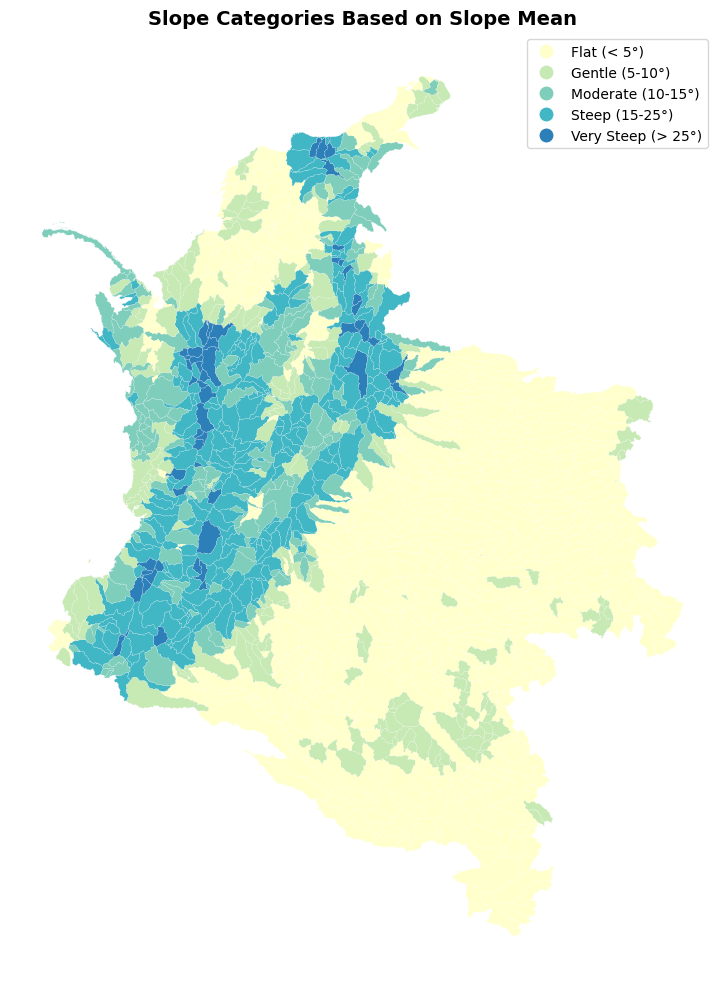

In [3]:
gdf = main_slope_analysis(ws_stat)

## 1. PGA

In [1]:
import os
import geopandas as gpd
import rasterio as rio

In [2]:
os.listdir(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\TerrainSlope")
main_db_str = r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\TerrainSlope\colombia_watersheds_elevation_slope_shapefile.shp"
main_db= gpd.read_file(main_db_str)

In [3]:
main_db.describe()

,elev_std,SUB_AREA,elev_max,COAST,slope_std,PFAF_ID,DIST_MAIN,DIST_SINK,HYBAS_ID,NEXT_DOWN,...,ENDO,slope_min,MAIN_BAS,elev_min,slope_p90,SORT,NEXT_SINK,slope_mean,slope_max,UP_AREA
count,1700.000000,1700.000000,1700.000000,1700.000000,1700.000000,1.700000e+03,1700.000000,1700.000000,1.700000e+03,1.700000e+03,...,1700.0,1700.000000,1.700000e+03,1700.000000,1700.000000,1700.000000,1.700000e+03,1700.000000,1700.000000,1700.000000
mean,175.491980,735.701765,1119.852941,0.028824,5.210162,6.202454e+07,1646.698176,1646.698176,6.080135e+09,5.726063e+09,...,0.0,0.000546,6.080006e+09,211.550588,15.002538,4379.337059,6.080006e+09,8.105398,48.167874,15476.461235
std,267.723616,729.193038,1381.567121,0.167360,3.684071,1.461554e+06,1214.514312,1214.514312,5.947627e+04,1.424314e+09,...,0.0,0.022493,7.951970e+03,359.148380,11.851420,5685.311868,7.951970e+03,7.021787,23.241834,56776.720909
min,1.279917,0.600000,11.000000,0.000000,1.110572,6.110010e+07,0.000000,0.000000,6.080000e+09,0.000000e+00,...,0.0,0.000000,6.080000e+09,-449.000000,2.637252,3.000000,6.080000e+09,0.612093,8.501081,3.800000
25%,14.367137,251.250000,205.750000,0.000000,2.267168,6.120955e+07,544.175000,544.175000,6.080095e+09,6.080092e+09,...,0.0,0.000000,6.080001e+09,56.750000,6.200485,427.750000,6.080001e+09,3.364447,26.683219,574.400000
50%,25.148977,511.150000,334.500000,0.000000,3.238546,6.157082e+07,1463.100000,1463.100000,6.080133e+09,6.080131e+09,...,0.0,0.000000,6.080004e+09,112.500000,8.414851,1867.500000,6.080004e+09,4.514672,42.142019,1562.350000
75%,252.377107,987.050000,1707.750000,0.000000,8.814738,6.229445e+07,2804.600000,2804.600000,6.080176e+09,6.080177e+09,...,0.0,0.000000,6.080007e+09,184.000000,25.250161,7680.250000,6.080007e+09,11.921223,72.036184,6557.150000
max,1511.409835,9059.300000,5696.000000,1.000000,14.845843,6.720968e+07,4317.800000,4317.800000,6.080314e+09,6.080314e+09,...,0.0,0.927410,6.080035e+09,2844.000000,45.757592,21938.000000,6.080035e+09,30.560927,89.347389,881501.900000


In [4]:
os.listdir(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\databases\PGA")

['colombia_slice.tif',
 'LICENSE.txt',
 'README.txt',
 'v2023_1_pga_475_rock_3min.tif']

In [5]:
rio.open(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\databases\PGA\v2023_1_pga_475_rock_3min.tif").meta

{'driver': 'GTiff',
 'dtype': 'float64',
 'nodata': 1.7976931348623157e+308,
 'width': 7200,
 'height': 3000,
 'count': 1,
 'crs': CRS.from_wkt('GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]'),
 'transform': Affine(0.05, 0.0, -180.0,
        0.0, -0.049996666666667, 89.99)}

### Scrypt clip PGA

In [6]:
import geopandas as gpd
import rasterio
from rasterio.mask import mask
from rasterio.windows import Window
from shapely.geometry import mapping
import numpy as np


def process_tiff_with_window(tiff_path,
                             geodataframe,
                             boundaries, 
                             method='mask',
                             column_name='PGA', save_slice=None):
    """
    Read TIFF once with window, then process all geometries against that slice
    
    Parameters:
    - tiff_path: path to single-band TIFF
    - geodataframe: GeoDataFrame with geometries  
    - boundaries: dict with 'lat_min', 'lat_max', 'lon_min', 'lon_max'
    - method: 'mask' for area average or 'centroid' for point sampling
    - column_name: name for the new column
    - save_slice: path to save the windowed TIFF slice (optional)
    """
    
    gdf_result = geodataframe.copy()
    gdf_result[column_name] = np.nan
    
    with rasterio.open(tiff_path) as src:
        # Calculate window from boundaries
        col_start = int((boundaries['lon_min'] - src.transform.c) / src.transform.a)
        col_end = int((boundaries['lon_max'] - src.transform.c) / src.transform.a)
        row_start = int((boundaries['lat_max'] - src.transform.f) / src.transform.e)
        row_end = int((boundaries['lat_min'] - src.transform.f) / src.transform.e)
        
        # Clamp to bounds
        col_start = max(0, min(col_start, src.width))
        col_end = max(0, min(col_end, src.width))
        row_start = max(0, min(row_start, src.height))
        row_end = max(0, min(row_end, src.height))
        
        window = Window(col_start, row_start, col_end - col_start, row_end - row_start)
        window_transform = rasterio.windows.transform(window, src.transform)
        
        print(f"Reading window: {window}")
        
        # READ THE TIFF ONCE with the window
        windowed_data = src.read(1, window=window)
        
        print(f"Windowed data shape: {windowed_data.shape}")
        
        # Save the slice if requested
        if save_slice:
            print(f"Saving windowed slice to: {save_slice}")
            
            # Create profile for the windowed data
            slice_profile = src.profile.copy()
            slice_profile.update({
                'height': windowed_data.shape[0],
                'width': windowed_data.shape[1],
                'transform': window_transform
            })
            
            # Save windowed data to file
            with rasterio.open(save_slice, 'w', **slice_profile) as slice_dst:
                slice_dst.write(windowed_data, 1)
            
            print(f"✓ Slice saved!")
        
        print(f"Processing {len(gdf_result)} geometries...")
        
        # Create a temporary rasterio-like object for the windowed data
        from rasterio.io import MemoryFile
        
        # Create profile for the windowed data
        profile = src.profile.copy()
        profile.update({
            'height': windowed_data.shape[0],
            'width': windowed_data.shape[1],
            'transform': window_transform
        })
        
        # Create in-memory dataset with windowed data
        with MemoryFile() as memfile:
            with memfile.open(**profile) as windowed_src:
                windowed_src.write(windowed_data, 1)
                
                # Now process geometries against the windowed dataset
                for idx, row in gdf_result.iterrows():
                    if (idx + 1) % max(1, len(gdf_result) // 10) == 0:
                        print(f"  Progress: {idx + 1}/{len(gdf_result)}")
                    
                    try:
                        if method == 'centroid':
                            centroid = row.geometry.centroid
                            row_idx, col_idx = windowed_src.index(centroid.x, centroid.y)
                            
                            if (0 <= row_idx < windowed_data.shape[0] and 
                                0 <= col_idx < windowed_data.shape[1]):
                                value = windowed_data[row_idx, col_idx]
                                if value != src.nodata and not np.isnan(value):
                                    gdf_result.at[idx, column_name] = value
                        
                        else:  # method == 'mask'
                            geom = [mapping(row.geometry)]
                            clipped_data, _ = mask(windowed_src, geom, crop=True, 
                                                 filled=False, all_touched=True)
                            
                            band_data = clipped_data[0]
                            if np.ma.count(band_data) > 0:
                                valid_data = band_data.data[~band_data.mask]
                                if src.nodata is not None:
                                    valid_data = valid_data[valid_data != src.nodata]
                                
                                if len(valid_data) > 0:
                                    avg_value = np.nanmean(valid_data)
                                    if not np.isnan(avg_value):
                                        gdf_result.at[idx, column_name] = avg_value
                    
                    except Exception as e:
                        continue
    
    print("✓ Done!")
    return gdf_result


# Usage
col_boundaries_v2 = {
                    'lat_max': 12.590276718139648,
                    'lon_min': -81.72014617919922,    
                    'lat_min': -4.236873626708984,
                    'lon_max': -66.87045288085938
                }



### Run code 

In [7]:
storage_cop = r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\databases\PGA\colombia_slice.tif"
## gdf = gpd.read_file(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\TerrainSlope\colombia_watersheds_elevation_slope_shapefile.shp")
result = process_tiff_with_window(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\databases\PGA\v2023_1_pga_475_rock_3min.tif",
                                  main_db,
                                  col_boundaries_v2,
                                  save_slice=storage_cop)

Reading window: Window(col_off=1965, row_off=1548, width=297, height=336)
Windowed data shape: (336, 297)
Saving windowed slice to: C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\databases\PGA\colombia_slice.tif
✓ Slice saved!
Processing 1700 geometries...
  Progress: 170/1700
  Progress: 340/1700
  Progress: 510/1700
  Progress: 680/1700
  Progress: 850/1700
  Progress: 1020/1700
  Progress: 1190/1700
  Progress: 1360/1700
  Progress: 1530/1700
  Progress: 1700/1700
✓ Done!


In [8]:
result

,elev_std,SUB_AREA,elev_max,COAST,slope_std,PFAF_ID,DIST_MAIN,DIST_SINK,HYBAS_ID,NEXT_DOWN,...,MAIN_BAS,elev_min,slope_p90,SORT,NEXT_SINK,slope_mean,slope_max,UP_AREA,geometry,PGA
0,111.251029,346.9,634,0,5.450260,61100213,1.7,1.7,6080078040,6080000200,...,6080000200,-12,11.407114,11,6080000200,4.018225,44.060051,35518.1,"POLYGON ((-77.17981 7.93842, -77.17843 7.95758...",0.296658
1,314.648191,476.8,1555,0,9.522432,61100212,1.7,1.7,6080078010,6080000200,...,6080000200,-6,24.241631,12,6080000200,9.887934,69.184029,477.1,"POLYGON ((-77.23777 8.12803, -77.23333 8.12917...",0.316517
2,114.591218,442.1,578,0,5.878972,61100215,35.8,35.8,6080081280,6080078040,...,6080000200,-24,14.276069,13,6080000200,5.545883,73.337868,34722.9,"POLYGON ((-77.29231 7.76522, -77.28537 7.76731...",0.391662
3,10.872152,448.4,234,0,2.288169,61100214,35.8,35.8,6080081290,6080078040,...,6080000200,-11,3.722500,14,6080000200,2.044135,47.997501,448.4,"POLYGON ((-77.09223 7.72158, -77.08807 7.72696...",0.365224
4,147.406667,847.4,1107,0,6.540599,61100216,70.3,70.3,6080084300,6080081280,...,6080000200,-9,17.269498,15,6080000200,7.976072,67.307343,847.4,"POLYGON ((-77.4875 7.575, -77.48715 7.58576, -...",0.453975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1695,41.370194,2547.3,340,1,6.193761,67209100,0.0,0.0,6080034070,0,...,6080034070,-74,16.211071,21899,6080034070,7.770820,75.902039,2547.3,"POLYGON ((-77.52083 4.19583, -77.5282 4.19654,...",0.672750
1696,46.827274,221.2,217,1,7.583453,67209301,0.0,0.0,6080034260,0,...,6080034260,-14,19.122843,21909,6080034260,8.244884,62.386665,221.2,"POLYGON ((-77.3875 5.15417, -77.38333 5.15417,...",0.734141
1697,193.849105,1527.5,1155,1,9.357068,67209303,0.0,0.0,6080034300,0,...,6080034300,-48,25.264144,21911,6080034300,12.727773,77.281273,1527.5,"POLYGON ((-77.54231 5.48782, -77.53814 5.4937,...",0.695645
1698,160.923738,1166.5,1080,1,9.100136,67209305,0.0,0.0,6080034400,0,...,6080034400,-15,26.235323,21913,6080034400,13.755105,71.020508,1166.5,"MULTIPOLYGON (((-77.69167 6.82917, -77.69383 6...",0.572242


In [9]:
result.isna().any()

elev_std      False
SUB_AREA      False
elev_max      False
COAST         False
slope_std     False
PFAF_ID       False
DIST_MAIN     False
DIST_SINK     False
HYBAS_ID      False
NEXT_DOWN     False
elev_mean     False
ORDER         False
slope_p95     False
ENDO          False
slope_min     False
MAIN_BAS      False
elev_min      False
slope_p90     False
SORT          False
NEXT_SINK     False
slope_mean    False
slope_max     False
UP_AREA       False
geometry      False
PGA           False
dtype: bool

In [10]:
result.head()

,elev_std,SUB_AREA,elev_max,COAST,slope_std,PFAF_ID,DIST_MAIN,DIST_SINK,HYBAS_ID,NEXT_DOWN,...,MAIN_BAS,elev_min,slope_p90,SORT,NEXT_SINK,slope_mean,slope_max,UP_AREA,geometry,PGA
0,111.251029,346.9,634,0,5.450260,61100213,1.7,1.7,6080078040,6080000200,...,6080000200,-12,11.407114,11,6080000200,4.018225,44.060051,35518.1,"POLYGON ((-77.17981 7.93842, -77.17843 7.95758...",0.296658
1,314.648191,476.8,1555,0,9.522432,61100212,1.7,1.7,6080078010,6080000200,...,6080000200,-6,24.241631,12,6080000200,9.887934,69.184029,477.1,"POLYGON ((-77.23777 8.12803, -77.23333 8.12917...",0.316517
2,114.591218,442.1,578,0,5.878972,61100215,35.8,35.8,6080081280,6080078040,...,6080000200,-24,14.276069,13,6080000200,5.545883,73.337868,34722.9,"POLYGON ((-77.29231 7.76522, -77.28537 7.76731...",0.391662
3,10.872152,448.4,234,0,2.288169,61100214,35.8,35.8,6080081290,6080078040,...,6080000200,-11,3.722500,14,6080000200,2.044135,47.997501,448.4,"POLYGON ((-77.09223 7.72158, -77.08807 7.72696...",0.365224
4,147.406667,847.4,1107,0,6.540599,61100216,70.3,70.3,6080084300,6080081280,...,6080000200,-9,17.269498,15,6080000200,7.976072,67.307343,847.4,"POLYGON ((-77.4875 7.575, -77.48715 7.58576, -...",0.453975


In [11]:
result.loc[: , ['HYBAS_ID' , 'PGA']].to_csv(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\chunks_features\PGA.csv",index = False)

### Plot

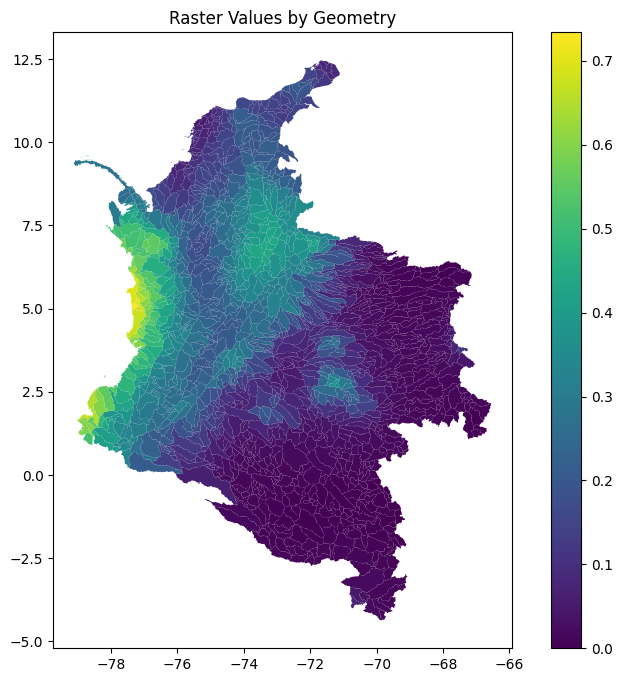

In [16]:
import rasterio as rio
import matplotlib.pyplot as plt

# Simple chloropleth map
fig, ax = plt.subplots(figsize=(10, 8))
result.plot(column='PGA', cmap='viridis', legend=True, ax=ax)
ax.set_title('Raster Values by Geometry')
plt.show()

In [4]:
slice_pga = rio.open(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\databases\PGA\colombia_slice.tif")

In [5]:
slice_pga.meta

{'driver': 'GTiff',
 'dtype': 'float64',
 'nodata': 1.7976931348623157e+308,
 'width': 297,
 'height': 336,
 'count': 1,
 'crs': CRS.from_wkt('GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]'),
 'transform': Affine(0.05, 0.0, -81.75,
        0.0, -0.049996666666667, 12.595159999999481)}

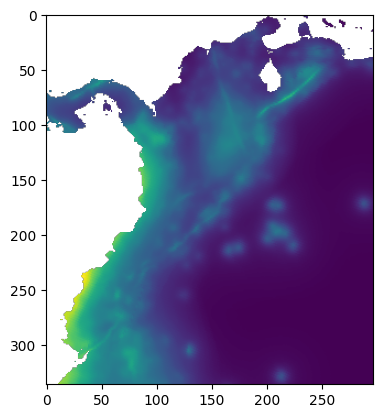

In [7]:
plt.imshow(slice_pga.read(1))

## 2. Rain

### 2 .1 NASA GPDX

#### 2.1.1 Tif cache creation.

In [1]:
from Codigo.land_slide.wranggling import load_inventario
## from Codigo.land_slide.rain_way import main
## from Codigo.utils.tools import map_to_0_to_360,extractUniqueLocation

from Codigo.land_slide.rain_way_stats import main
import rasterio as rio
from rasterio.transform import Affine
import numpy as np
import xarray as xr
import rioxarray as rxr

resultado = load_inventario( verbose=  False  )
inventario = resultado['incidentes_withdates']

out, dataset_assigment = main( url_nsa= r'C:\Users\Usuario\OneDrive - INTERCONEXION ELECTRICA S.A. E.S.P\01_CC_DOC\data\4_Rain\02_NasaGPDX_SouthAmericaV3',
                             assets = inventario, 
                             output_directory= r'C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\cache\Avances_2\index_rain\V2' )

2025-06-20 17:55:28,117 - Codigo.land_slide.rain_way_stats - INFO - Creating models and scenarios dataframe
2025-06-20 17:55:29,852 - Codigo.land_slide.rain_way_stats - INFO - Applying NASA susceptibility to assets


All share the same coords
Working on Historical
	Modelo : EC-Earth3-Veg-LR
	1 - C:\Users\Usuario\OneDrive - INTERCONEXION ELECTRICA S.A. E.S.P\01_CC_DOC\data\4_Rain\02_NasaGPDX_SouthAmericaV3\SAM_pr_EC-Earth3-Veg-LR_historical_1.nc
	2 - C:\Users\Usuario\OneDrive - INTERCONEXION ELECTRICA S.A. E.S.P\01_CC_DOC\data\4_Rain\02_NasaGPDX_SouthAmericaV3\SAM_pr_EC-Earth3-Veg-LR_historical_2.nc
	3 - C:\Users\Usuario\OneDrive - INTERCONEXION ELECTRICA S.A. E.S.P\01_CC_DOC\data\4_Rain\02_NasaGPDX_SouthAmericaV3\SAM_pr_EC-Earth3-Veg-LR_historical_3.nc
Dates complete
		1985-01-01 2004-12-31
Done Historical
Working on Historical
	Modelo : GFDL-ESM4
	1 - C:\Users\Usuario\OneDrive - INTERCONEXION ELECTRICA S.A. E.S.P\01_CC_DOC\data\4_Rain\02_NasaGPDX_SouthAmericaV3\SAM_pr_GFDL-ESM4_historical_1.nc
	2 - C:\Users\Usuario\OneDrive - INTERCONEXION ELECTRICA S.A. E.S.P\01_CC_DOC\data\4_Rain\02_NasaGPDX_SouthAmericaV3\SAM_pr_GFDL-ESM4_historical_2.nc
	3 - C:\Users\Usuario\OneDrive - INTERCONEXION ELECTRICA 

In [3]:
import os
import rasterio as rio

In [4]:
os.listdir(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\cache\Avances_2\index_rain\V2")

['climate_indices_all_scenarios_enhanced.tif',
 'climate_indices_metadata_enhanced.json']

In [5]:
chosen = rio.open(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\cache\Avances_2\index_rain\V2\climate_indices_all_scenarios_enhanced.tif")

In [6]:
chosen.meta

{'driver': 'GTiff',
 'dtype': 'float32',
 'nodata': -9999.0,
 'width': 68,
 'height': 75,
 'count': 40,
 'crs': CRS.from_wkt('GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]'),
 'transform': Affine(0.25, 0.0, 277.25,
        0.0, 0.25, -5.25)}

In [7]:
import matplotlib.pyplot as plt 

In [15]:
chosen.tags()

{'AREA_OR_POINT': 'Area'}

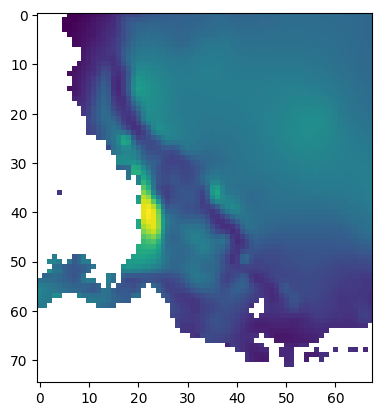

In [8]:
plt.imshow(chosen.read(1))

#### 2.1.2 Assigment to polygons.

In [4]:
import geopandas as gpd
import rasterio
from rasterio.mask import mask
from shapely.geometry import mapping
from shapely.ops import transform
import pyproj
import numpy as np
import pandas as pd


def map_to_0_to_360(regular_longitude):
    """
    Convert longitude from -180/180 range to 0-360 range
    A good reference for this function 
    https://gis.stackexchange.com/questions/201789/verifying-formula-that-will-convert-longitude-0-360-to-180-to-180
    Sample Usage:
    
    map_to_0_to_360(regular_longitude= -75.4976)
    >> 284.50239999999997
    """
    converted_longitude = (regular_longitude + 360) % 360
    return converted_longitude

def transform_geometry_coordinates(geom):
    """
    Transform a geometry's coordinates from -180/180 to 0-360 longitude range
    """
    def transform_coords(x, y, z=None):
        # Transform longitude (x) to 0-360 range, keep latitude (y) unchanged
        
        new_x = map_to_0_to_360(x)
        if z is not None:
            return new_x, y, z
        return new_x, y
    
    return transform(transform_coords, geom)


def calculate_average_per_geometry(tiff_path,
                                   geodataframe, 
                                   nodata_value=-9999.0, 
                                   method='mask',
                                   verbose=True):  # ← Added verbose parameter
    """
    Calculate the average of raster values for each geometry in the geodataframe
    
    Parameters:
    - verbose: If True, prints detailed progress. If False, prints minimal info.
    """
    import numpy as np
    
    # Make a copy of the geodataframe to avoid modifying the original
    gdf_result = geodataframe.copy()
    
    # Transform the geometry column to match TIFF coordinate system
    if verbose:
        print("Transforming geometries from -180/180 to 0-360 longitude range...")
    
    gdf_transformed = gdf_result.copy()
    gdf_transformed['geometry'] = gdf_transformed['geometry'].apply(transform_geometry_coordinates)
    
    # Open the TIFF file
    with rasterio.open(tiff_path) as src:
        if verbose:
            print(f"TIFF shape: {src.shape}")
            print(f"TIFF bounds: {src.bounds}")
            print(f"Number of bands: {src.count}")

        band_columns = src.descriptions
        
        # Initialize a dictionary to collect all results - THIS IS THE KEY CHANGE
        results_data = {col: [] for col in band_columns}
        
        # Progress indicator for large datasets
        total_rows = len(gdf_transformed)
        print(f"Processing {total_rows} geometries...")
        
        # Process each geometry
        for idx, row in gdf_transformed.iterrows():
            
            # Progress indicator every 10%
            if (idx + 1) % max(1, total_rows // 10) == 0:
                print(f"  Progress: {idx + 1}/{total_rows} ({((idx + 1)/total_rows)*100:.0f}%)")
            
            try:
                polygon_has_data = False  # Track if this polygon has ANY valid data
                
                # Initialize row results
                row_results = {col: np.nan for col in band_columns}
                
                if method == 'centroid':
                    # Use centroid method
                    centroid = row.geometry.centroid
                    row_idx, col_idx = src.index(centroid.x, centroid.y)
                    
                    # Check if indices are within bounds
                    if 0 <= row_idx < src.height and 0 <= col_idx < src.width:
                        # Read all bands at this location
                        for band_idx in range(src.count):
                            value = src.read(band_idx + 1, window=((row_idx, row_idx + 1), (col_idx, col_idx + 1)))[0, 0]
                            
                            if value != nodata_value and not np.isnan(value):
                                row_results[band_columns[band_idx]] = value
                                polygon_has_data = True
                        
                        # Early stop if no data found for this polygon
                        if not polygon_has_data:
                            if verbose:
                                print(f"Row {idx}: No valid data found - stopping processing")
                            break
                            
                else:  # method == 'mask'
                    # Get geometry for this row
                    geom = [mapping(row.geometry)]
                    
                    # Clip the raster for this geometry
                    clipped_data, clipped_transform = mask(
                        src, 
                        geom, 
                        crop=True, 
                        filled=False,
                        all_touched=True
                    )
                    
                    # Calculate average for each band
                    for band_idx in range(src.count):
                        band_data = clipped_data[band_idx]
                        
                        # Get only the valid (non-masked) data
                        valid_count = np.ma.count(band_data)
                        
                        if valid_count > 0:
                            # Use nanmean on the actual data, ignoring both masked values and NaNs
                            valid_data = band_data.data[~band_data.mask]
                            avg_value = np.nanmean(valid_data)
                            
                            # Check that we got a valid result
                            if not np.isnan(avg_value):
                                row_results[band_columns[band_idx]] = float(avg_value)
                                polygon_has_data = True
                            else:
                                row_results[band_columns[band_idx]] = np.nan
                        else:
                            row_results[band_columns[band_idx]] = np.nan
                    
                    # Early stop if no data found for this polygon
                    if not polygon_has_data:
                        if verbose:
                            print(f"Row {idx}: No valid data found - stopping processing")
                        break
                
                # Append results for this row
                for col in band_columns:
                    results_data[col].append(row_results[col])
                            
            except Exception as e:
                if verbose:
                    print(f"Error processing row {idx}: {e}")
                # Append NaN values for this row in case of error
                for col in band_columns:
                    results_data[col].append(np.nan)
                continue
        
        print("✓ Processing completed!")
    
    # Create DataFrame from results and concatenate with original - THIS AVOIDS FRAGMENTATION
    results_df = pd.DataFrame(results_data, index=gdf_result.index[:len(results_data[band_columns[0]])])
    gdf_result = pd.concat([gdf_result, results_df], axis=1)
    
    return gdf_result

# Your existing usage code remains the same
geotiff_path = r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\cache\Avances_2\index_rain\V2\climate_indices_all_scenarios_enhanced.tif"
main_db_str = r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\TerrainSlope\colombia_watersheds_elevation_slope_shapefile.shp"

gdf = gpd.read_file(main_db_str)
    
# Method 1: Use centroid sampling (more reliable for small geometries)
gdf_result = calculate_average_per_geometry(
                                    tiff_path = geotiff_path,
                                    geodataframe=gdf,
                                    method='mask'
            
                                )

Transforming geometries from -180/180 to 0-360 longitude range...
TIFF shape: (75, 68)
TIFF bounds: BoundingBox(left=277.25, bottom=13.5, right=294.25, top=-5.25)
Number of bands: 104
Processing 1700 geometries...
  Progress: 170/1700 (10%)
  Progress: 340/1700 (20%)
  Progress: 510/1700 (30%)
  Progress: 680/1700 (40%)
  Progress: 850/1700 (50%)
  Progress: 1020/1700 (60%)
  Progress: 1190/1700 (70%)
  Progress: 1360/1700 (80%)
  Progress: 1530/1700 (90%)
  Progress: 1700/1700 (100%)
✓ Processing completed!


In [11]:
band_descriptions = [
           "elev_std",
            "SUB_AREA",
            "elev_max",
            "COAST",
            "slope_std",
            "PFAF_ID",
            "DIST_MAIN",
            "DIST_SINK",
        ##     "HYBAS_ID",
            "NEXT_DOWN",
            "elev_mean",
            "ORDER",
            "slope_p95",
            "ENDO",
            "slope_min",
            "MAIN_BAS",
            "elev_min",
            "slope_p90",
            "SORT",
            "NEXT_SINK",
            "slope_mean",
            "slope_max",
            "UP_AREA",
            "geometry",
          ]

In [12]:
gdf_result.isna().any().any()

np.False_

In [16]:
filter_cols = [ col for col in gdf_result.columns if col not in band_descriptions]

filter_cmip6 = gdf_result.loc[: , filter_cols]

In [18]:
filter_cmip6.head()

,HYBAS_ID,Historical_TP_mean_1985-2005,Historical_TP_median_1985-2005,Historical_TP_max_1985-2005,Historical_TP_p95_1985-2005,Historical_TP_min_1985-2005,Historical_CWD_1985-2005,Historical_RX5day_1985-2005,Historical_R95p_1985-2005,SSP2 4.5_TP_mean_2020-2040,...,SSP5 8.5_CWD_2060-2080,SSP5 8.5_CWD_2080-2100,SSP5 8.5_RX5day_2020-2040,SSP5 8.5_RX5day_2040-2060,SSP5 8.5_RX5day_2060-2080,SSP5 8.5_RX5day_2080-2100,SSP5 8.5_R95p_2020-2040,SSP5 8.5_R95p_2040-2060,SSP5 8.5_R95p_2060-2080,SSP5 8.5_R95p_2080-2100
0,6080078040,2404.761230,2428.441895,2910.226807,2820.092285,1925.344238,49.764282,115.671371,494.706665,2549.164551,...,48.308929,49.669647,128.553024,131.463272,138.673874,149.780014,537.603149,554.961548,577.209412,615.566711
1,6080078010,2286.554443,2310.492188,2761.467773,2673.521973,1834.826172,50.269047,110.421791,468.908905,2420.258545,...,49.257145,51.328571,122.073303,124.621033,131.315063,141.727905,508.305176,523.932190,545.238464,580.546631
2,6080081280,3264.778320,3312.593018,3909.392578,3782.051758,2658.418945,65.964287,161.392166,674.201538,3452.654541,...,68.044640,71.551788,178.068771,183.728149,196.918411,211.962112,738.260132,763.765747,806.980835,859.036743
3,6080081290,3130.611816,3164.358887,3787.472412,3670.357178,2516.664795,56.733929,150.735046,646.739136,3320.705078,...,56.583931,58.674999,168.516876,173.637054,185.088379,199.375397,709.090942,735.118896,769.690979,820.508850
4,6080084300,3264.778320,3312.593018,3909.392578,3782.051758,2658.418945,65.964287,161.392166,674.201538,3452.654541,...,68.044640,71.551788,178.068771,183.728149,196.918411,211.962112,738.260132,763.765747,806.980835,859.036743


In [19]:
filter_cmip6.to_csv(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\chunks_features\CMIP6_Rain.csv",index = False)

In [4]:
import os
import pandas as pd

In [5]:
os.listdir(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\cache\Avances_2\index_rain\V2")

['climate_indices_all_scenarios_enhanced.tif',
 'climate_indices_metadata_enhanced.json']

In [20]:
gdf_result.filter(like = 'CWD').sample()

,Historical_CWD_1985-2005,SSP2 4.5_CWD_2020-2040,SSP2 4.5_CWD_2040-2060,SSP2 4.5_CWD_2060-2080,SSP2 4.5_CWD_2080-2100,SSP3 7.0_CWD_2020-2040,SSP3 7.0_CWD_2040-2060,SSP3 7.0_CWD_2060-2080,SSP3 7.0_CWD_2080-2100,SSP5 8.5_CWD_2020-2040,SSP5 8.5_CWD_2040-2060,SSP5 8.5_CWD_2060-2080,SSP5 8.5_CWD_2080-2100
559,45.150002,42.878571,45.701782,42.114285,41.412502,45.174995,41.25893,38.194641,36.203575,48.314285,41.564285,38.991074,35.294643


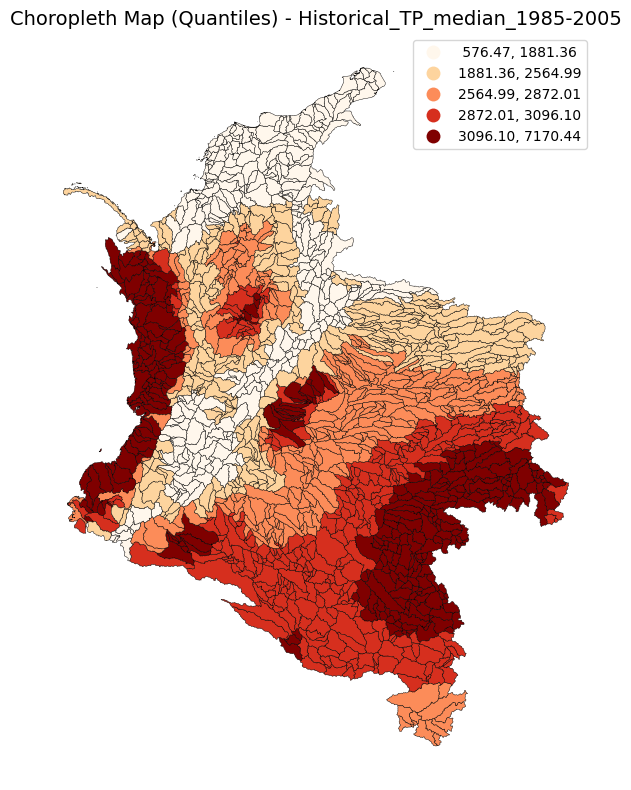

In [21]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load your GeoDataFrame (example: gdf)
# Make sure the column name is valid or assign an alias
column = 'Historical_TP_median_1985-2005'
gdf_result = gdf_result.dropna(subset=[column])  # Drop NaNs to avoid plotting issues

# Plot using quantiles
fig, ax = plt.subplots(figsize=(10, 8))

gdf_result.plot(
    column=column,
    cmap='OrRd',
    scheme='quantiles',      # <-- key step
    k=5,                     # number of quantile classes
    legend=True,
    edgecolor='black',
    linewidth=0.3,
    ax=ax
)

plt.title(f'Choropleth Map (Quantiles) - {column}', fontsize=14)
plt.axis('off')
plt.tight_layout()
plt.show()


#### 2.1.3 Make Cloroplets

In [5]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
import contextily as ctx
from matplotlib.patches import Rectangle
import seaborn as sns

def create_choropleth_map(gdf, column_name, title=None, figsize=(15, 12), 
                         cmap='viridis', save_path=None, add_basemap=True,
                         scheme='quantiles', k=5):
    """
    Create a beautiful choropleth map from geodataframe
    
    Parameters:
    - gdf: GeoDataFrame with geometries and data
    - column_name: Column to map (e.g., 'SSP5 8.5_R95p_2020-2040')
    - title: Map title (optional)
    - figsize: Figure size tuple
    - cmap: Colormap name
    - save_path: Path to save the figure (optional)
    - add_basemap: Whether to add satellite basemap
    - scheme: Classification scheme ('quantiles', 'equal_interval', 'natural_breaks')
    - k: Number of classes
    """
    
    # Remove any rows with NaN values in the target column
    gdf_clean = gdf.dropna(subset=[column_name]).copy()
    
    if len(gdf_clean) == 0:
        print(f"No valid data found in column: {column_name}")
        return None
    
    # Print distribution statistics
    print(f"\n=== Distribution Analysis for {column_name} ===")
    print(f"Count: {len(gdf_clean)}")
    print(f"Min: {gdf_clean[column_name].min():.3f}")
    print(f"Max: {gdf_clean[column_name].max():.3f}")
    print(f"Mean: {gdf_clean[column_name].mean():.3f}")
    print(f"Median: {gdf_clean[column_name].median():.3f}")
    print(f"Std: {gdf_clean[column_name].std():.3f}")
    
    # Calculate and print quantiles
    quantiles = np.linspace(0, 1, k+1)
    quantile_values = gdf_clean[column_name].quantile(quantiles)
    print(f"\nQuantile breaks ({k} classes):")
    for i, (q, val) in enumerate(zip(quantiles, quantile_values)):
        print(f"  {q*100:5.1f}%: {val:.3f}")
    
    # Convert to Web Mercator for basemap compatibility
    gdf_plot = gdf_clean.to_crs(epsg=3857)
    
    # Create the plot
    fig, ax = plt.subplots(1, 1, figsize=figsize)
    
    # Plot the choropleth with classification scheme
    gdf_plot.plot(
                    column=column_name,
                    ax=ax,
                    cmap=cmap,
                    scheme=scheme,
                    k=k,
                    legend=True,
                    edgecolor='white',
                    linewidth=0.5,
                    alpha=0.8
                )
    
    # Add basemap if requested
    if add_basemap:
        try:
            ctx.add_basemap(
                ax, 
                crs=gdf_plot.crs, 
                source=ctx.providers.Esri.WorldImagery,
                alpha=0.6,
                zoom='auto'
            )
        except Exception as e:
            print(f"Could not add basemap: {e}")
            print("Continuing without basemap...")
    
    # Styling
    ax.set_aspect('equal')
    ax.axis('off')
    
    # Title
    if title is None:
        title = f"Climate Index: {column_name.replace('_', ' ')}"
    
    plt.suptitle(title, fontsize=16, fontweight='bold', y=0.95)
    
    # Add statistics text box
    stats_text = f"""
    Classification: {scheme.title()} ({k} classes)
    Min: {gdf_clean[column_name].min():.2f}
    Max: {gdf_clean[column_name].max():.2f}
    Mean: {gdf_clean[column_name].mean():.2f}
    Median: {gdf_clean[column_name].median():.2f}
    Std: {gdf_clean[column_name].std():.2f}
    Count: {len(gdf_clean)} watersheds
    """
    
    ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, 
            fontsize=10, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    
    # Save if requested
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', 
                   facecolor='white', edgecolor='none')
        print(f"Map saved to: {save_path}")
    
    plt.show()
    
    # Create histogram to show distribution
    fig2, ax2 = plt.subplots(1, 1, figsize=(10, 6))
    
    # Plot histogram
    ax2.hist(gdf_clean[column_name], bins=20, alpha=0.7, color='skyblue', edgecolor='black')
    
    # Add quantile lines
    colors = plt.cm.get_cmap(cmap)(np.linspace(0, 1, k+1))
    for i, val in enumerate(quantile_values):
        ax2.axvline(val, color=colors[i], linestyle='--', linewidth=2, 
                   label=f'{quantiles[i]*100:.0f}% ({val:.2f})')
    
    ax2.set_xlabel(column_name.replace('_', ' '))
    ax2.set_ylabel('Number of Watersheds')
    ax2.set_title(f'Distribution of {column_name.replace("_", " ")}')
    ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    return fig, ax


    



=== Distribution Analysis for Historical_TP_median_1985-2005 ===
Count: 1700
Min: 576.466
Max: 7170.445
Mean: 2631.221
Median: 2734.920
Std: 862.876

Quantile breaks (3 classes):
    0.0%: 576.466
   33.3%: 2391.445
   66.7%: 2948.840
  100.0%: 7170.445


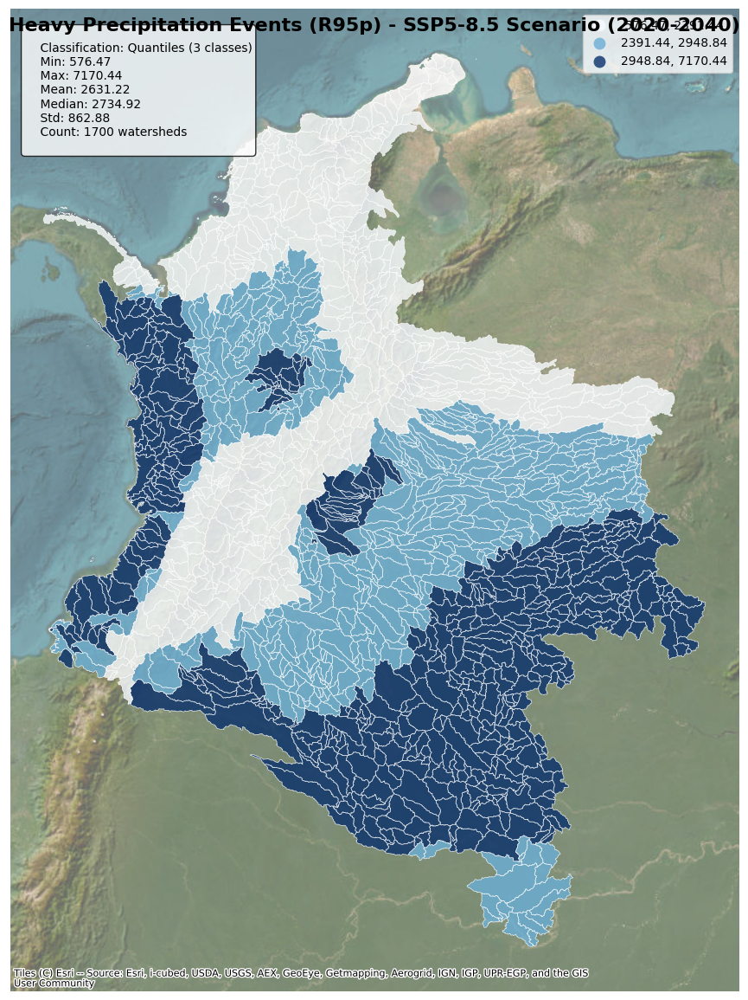

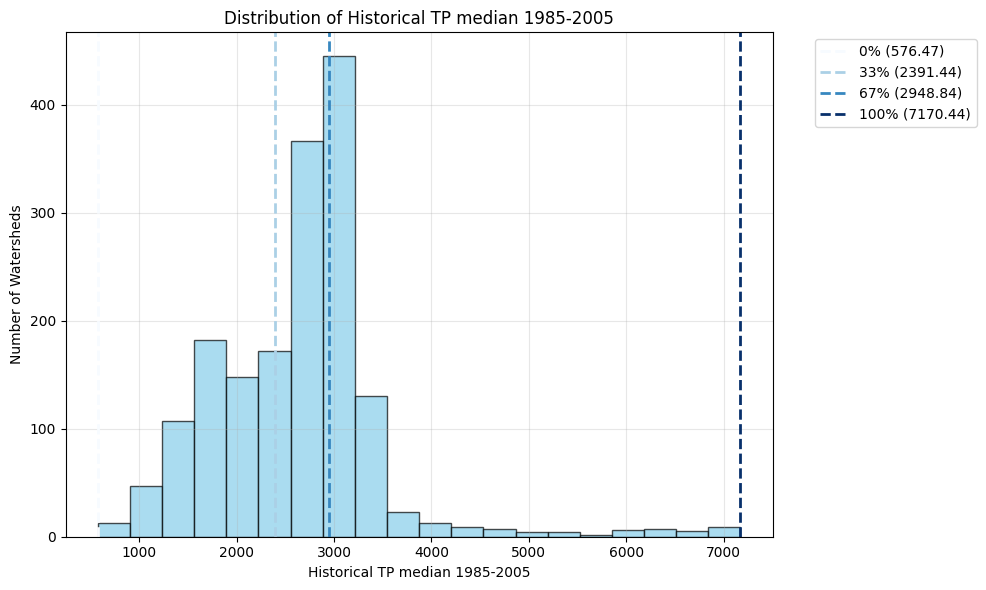

(<Figure size 1500x1200 with 1 Axes>, <Axes: >)

In [13]:
import geopandas as gpd
from pathlib import Path

def restore_original_columns(gdf, mapping_path):
    """
    Restore original column names using the mapping dictionary.
    """
    # Load mapping
    with open(mapping_path, 'r') as f:
        mapping = json.load(f)
    
    # Create reverse mapping (encoded_name -> original_name)
    gdf_restored = gdf.copy()
    
    # Rename columns back to original names
    for encoded_name, original_name in mapping.items():
        if encoded_name in gdf_restored.columns:
            gdf_restored = gdf_restored.rename(columns={encoded_name: original_name})
    
    return gdf_restored

def load_shapefile_with_original_names(shapefile_path, mapping_path=None):
    """
    Load shapefile and restore original column names.
    """
    # Load shapefile
    gdf = gpd.read_file(shapefile_path)
    
    # Determine mapping path if not provided
    if mapping_path is None:
        mapping_path = str(Path(shapefile_path).with_suffix('.json'))
    
    # Restore original column names
    gdf_restored = restore_original_columns(gdf, mapping_path)
    
    return gdf_restored

# Later, load back with original names

gdf = load_shapefile_with_original_names(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\main_training_set.shp")



# Single map with quantiles (default)
create_choropleth_map(
    gdf=gdf,
    column_name='Historical_TP_median_1985-2005',
    title='Heavy Precipitation Events (R95p) - SSP5-8.5 Scenario (2020-2040)',
    cmap='Blues',
    scheme='quantiles',
    k=5
)

# Try different classification schemes:

# Equal intervals
## create_choropleth_map(
##     gdf=gdf_result,
##     column_name='SSP2 4.5_CWD_2020-2040',
##     title='R95p - Equal Intervals Classification',
##     cmap='Blues',
##     scheme='natural_breaks',
##     k=5
## )

# # Natural breaks (Jenks)
# create_choropleth_map(
#     gdf=gdf_with_averages,
#     column_name='SSP5 8.5_R95p_2020-2040',
#     title='R95p - Natural Breaks Classification',
#     cmap='Blues',
#     scheme='natural_breaks',
#     k=5
# )

### Chirps

In [3]:
chirps_files[:5]

['C:\\Users\\Usuario\\OneDrive - INTERCONEXION ELECTRICA S.A. E.S.P\\01_CC_DOC\\data\\4_Rain\\03_ChirpsRainFall_SouthAmericaV2\\CHIRPS_daily_1981.nc',
 'C:\\Users\\Usuario\\OneDrive - INTERCONEXION ELECTRICA S.A. E.S.P\\01_CC_DOC\\data\\4_Rain\\03_ChirpsRainFall_SouthAmericaV2\\CHIRPS_daily_1982.nc',
 'C:\\Users\\Usuario\\OneDrive - INTERCONEXION ELECTRICA S.A. E.S.P\\01_CC_DOC\\data\\4_Rain\\03_ChirpsRainFall_SouthAmericaV2\\CHIRPS_daily_1983.nc',
 'C:\\Users\\Usuario\\OneDrive - INTERCONEXION ELECTRICA S.A. E.S.P\\01_CC_DOC\\data\\4_Rain\\03_ChirpsRainFall_SouthAmericaV2\\CHIRPS_daily_1984.nc',
 'C:\\Users\\Usuario\\OneDrive - INTERCONEXION ELECTRICA S.A. E.S.P\\01_CC_DOC\\data\\4_Rain\\03_ChirpsRainFall_SouthAmericaV2\\CHIRPS_daily_1985.nc']

#### 1. Create cache chirps stats.

In [1]:
#!/usr/bin/env python3
"""
CHIRPS Precipitation Data Preprocessing Script
==============================================

This script processes yearly CHIRPS precipitation data files for South America,
spatially clips them to Colombia boundaries, and creates a long-term mean annual
rainfall dataset using Dask for memory-efficient processing.

Author: Your Name
Date: 2025
"""

import xarray as xr
import dask
import numpy as np
import os
import glob
from pathlib import Path
import warnings
from dask.diagnostics import ProgressBar
import time
import pandas as pd
import rioxarray  # For proper raster operations
warnings.filterwarnings('ignore')

# Configure Dask for better performance
dask.config.set({'array.slicing.split_large_chunks': False})

def setup_dask_client():
    """
    Set up Dask client with optimized settings for geospatial data processing.
    """
    from dask.distributed import Client, LocalCluster
    
    # Create a local cluster with optimized settings
    cluster = LocalCluster(
        n_workers=4,
        threads_per_worker=2,
        memory_limit='2GB',
        dashboard_address=':8787'
    )
    client = Client(cluster)
    print(f"Dask dashboard available at: {client.dashboard_link}")
    return client

def save_as_geotiff_with_rioxarray(data_array, output_path_tif, variable_name='precip', title="", description=""):
    """
    Save an xarray DataArray as GeoTIFF using rioxarray (proper coordinates).
    
    Parameters:
    -----------
    data_array : xarray.DataArray
        The data to save
    output_path_tif : str
        Output GeoTIFF file path
    variable_name : str
        Name for the variable
    title : str
        Title for the dataset
    description : str
        Description for the dataset
    """
    # Create a new dataset with the data array
    ds = data_array.to_dataset(name=variable_name)
    
    # Add global attributes
    ds.attrs.update({
        'title': title,
        'description': description,
        'source': 'Climate Hazards Group InfraRed Precipitation with Station data (CHIRPS)',
        'processing_date': pd.Timestamp.now().strftime('%Y-%m-%d %H:%M:%S'),
        'crs': 'EPSG:4326',
        'spatial_extent': 'Colombia'
    })
    
    # Add variable attributes
    if variable_name == 'precip':
        ds[variable_name].attrs.update({
            'long_name': 'Precipitation',
            'standard_name': 'precipitation_flux',
            'units': 'mm year-1' if 'Annual' in title else 'days year-1',
            'description': description,
            '_FillValue': -9999.0
        })
    elif variable_name == 'rainy_days':
        ds[variable_name].attrs.update({
            'long_name': 'Rainy Days',
            'units': 'days year-1',
            'description': description,
            '_FillValue': -9999.0
        })
    
    # Add coordinate attributes
    if 'latitude' in ds.coords:
        ds['latitude'].attrs.update({
            'long_name': 'Latitude',
            'standard_name': 'latitude',
            'units': 'degrees_north'
        })
    if 'longitude' in ds.coords:
        ds['longitude'].attrs.update({
            'long_name': 'Longitude', 
            'standard_name': 'longitude',
            'units': 'degrees_east'
        })
    
    # Add CRS information for rioxarray
    ds.rio.write_crs("epsg:4326", inplace=True)
    
    # Save as GeoTIFF using rioxarray (the solution you found!)
    ds[variable_name].rio.to_raster(output_path_tif)
    print(f"✓ Saved GeoTIFF: {os.path.basename(output_path_tif)}")

def compute_with_progress(dask_array, method='dask', description="Computing"):
    """
    Compute a Dask array with progress tracking.
    
    Parameters:
    -----------
    dask_array : dask array or xarray with dask backend
        The array to compute
    method : str
        'dask' for built-in Dask progress bar, 'tqdm' for enhanced progress bar
    description : str
        Description for the progress bar
    
    Returns:
    --------
    Computed result
    """
    if method == 'tqdm':
        try:
            from tqdm.auto import tqdm
            import dask
            
            # Get the task graph size for better progress estimation
            task_count = len(dask_array.__dask_graph__())
            
            print(f"{description}... (Tasks: {task_count})")
            
            # Use tqdm with Dask callback
            with tqdm(total=100, desc=description, unit='%') as pbar:
                def update_progress(finished, total):
                    pbar.n = int((finished / total) * 100)
                    pbar.refresh()
                
                # Note: This is a simplified approach
                # For more detailed progress, you'd need dask.distributed
                with ProgressBar():
                    result = dask_array.compute()
                    
            return result
            
        except ImportError:
            print("tqdm not available, falling back to Dask progress bar")
            method = 'dask'
    
    if method == 'dask':
        print(f"{description}...")
        print("Progress bar shows task completion (may not be linear with time)")
        with ProgressBar():
            result = dask_array.compute()
        return result

def load_and_clip_chirps_file(filepath, colombia_bounds, chunks):
    """
    Load a single CHIRPS file with Dask and clip to Colombia boundaries.
    
    Parameters:
    -----------
    filepath : str
        Path to the CHIRPS NetCDF file
    colombia_bounds : dict
        Dictionary containing lat_min, lat_max, lon_min, lon_max
    chunks : dict
        Chunking strategy for Dask
    
    Returns:
    --------
    xarray.Dataset
        Spatially clipped dataset with Dask arrays
    """
    print(f"Processing: {os.path.basename(filepath)}")
    
    # Load with Dask chunks - don't load into memory yet
    ds = xr.open_dataset(filepath, chunks=chunks)
    
    # Check coordinate names and dimensions
    print(f"  Dimensions: {dict(ds.dims)}")
    print(f"  Coordinates: {list(ds.coords)}")
    
    # Handle potential coordinate naming variations
    lat_coord = 'latitude' if 'latitude' in ds.coords else 'lat'
    lon_coord = 'longitude' if 'longitude' in ds.coords else 'lon'
    
    # Check if coordinates are in ascending/descending order
    lat_values = ds[lat_coord].values
    lon_values = ds[lon_coord].values
    
    print(f"  Latitude range: {lat_values.min():.2f} to {lat_values.max():.2f}")
    print(f"  Longitude range: {lon_values.min():.2f} to {lon_values.max():.2f}")
    print(f"  Latitude ascending: {np.all(np.diff(lat_values) > 0)}")
    
    # Spatial subsetting to Colombia bounds
    # This operation stays lazy with Dask
    if np.all(np.diff(lat_values) > 0):  # Ascending latitude
        ds_clipped = ds.sel(
            **{
                lat_coord: slice(colombia_bounds['lat_min'], colombia_bounds['lat_max']),
                lon_coord: slice(colombia_bounds['lon_min'], colombia_bounds['lon_max'])
            }
        )
    else:  # Descending latitude
        ds_clipped = ds.sel(
            **{
                lat_coord: slice(colombia_bounds['lat_max'], colombia_bounds['lat_min']),
                lon_coord: slice(colombia_bounds['lon_min'], colombia_bounds['lon_max'])
            }
        )
    
    print(f"  Clipped dimensions: {dict(ds_clipped.dims)}")
    
    # Close the original dataset to free resources
    ds.close()
    
    return ds_clipped

def process_chirps_data(data_dir, output_dir, years_range=(1981, 2023), rainy_day_threshold=1.0):
    """
    Main processing function for CHIRPS data with rainfall statistics.
    
    Parameters:
    -----------
    data_dir : str
        Directory containing CHIRPS files
    output_dir : str
        Output directory for GeoTIFF files
    years_range : tuple
        Start and end years (inclusive)
    rainy_day_threshold : float
        Minimum precipitation (mm) to count as a rainy day (default: 1.0mm)
    """
    
    # Colombia boundaries
    colombia_bounds = {
        'lat_max': 12.590276718139648,
        'lon_min': -81.72014617919922,
        'lat_min': -4.236873626708984,
        'lon_max': -66.87045288085938
    }
    
    # Dask chunking strategy
    chunks = {
        'time': 'auto',
        'latitude': 100,
        'longitude': 100
    }
    
    print("="*60)
    print("CHIRPS Precipitation Data Preprocessing")
    print("="*60)
    print(f"Data directory: {data_dir}")
    print(f"Output directory: {output_dir}")
    print(f"Years: {years_range[0]}-{years_range[1]}")
    print(f"Colombia bounds: {colombia_bounds}")
    print(f"Chunk strategy: {chunks}")
    print("="*60)
    
    # Find all CHIRPS files
    file_pattern = os.path.join(data_dir, f"CHIRPS_daily_*.nc")
    all_files = sorted(glob.glob(file_pattern))
    
    # Filter files for the specified year range
    chirps_files = []
    for filepath in all_files:
        filename = os.path.basename(filepath)
        # Extract year from filename (assuming format: CHIRPS_daily_YYYY.nc)
        try:
            year = int(filename.split('_')[-1].replace('.nc', ''))
            if years_range[0] <= year <= years_range[1]:
                chirps_files.append(filepath)
        except ValueError:
            print(f"Warning: Could not extract year from {filename}")
    
    if not chirps_files:
        raise FileNotFoundError(f"No CHIRPS files found in {data_dir} for years {years_range}")
    
    print(f"Found {len(chirps_files)} CHIRPS files")
    print(f"First file: {os.path.basename(chirps_files[0])}")
    print(f"Last file: {os.path.basename(chirps_files[-1])}")
    print()
    
    # Process each file and collect datasets
    print("Step 1: Loading and clipping files spatially...")
    clipped_datasets = []
    
    for i, filepath in enumerate(chirps_files):
        print(f"[{i+1}/{len(chirps_files)}] ", end="")
        ds_clipped = load_and_clip_chirps_file(filepath, colombia_bounds, chunks)
        clipped_datasets.append(ds_clipped)
        print()
    
    print("\nStep 2: Concatenating datasets along time dimension...")
    # Concatenate all datasets along time dimension
    # This remains lazy with Dask
    combined_ds = xr.concat(clipped_datasets, dim='time')
    print(f"Combined dataset shape: {dict(combined_ds.dims)}")
    print(f"Time range: {combined_ds.time.values[0]} to {combined_ds.time.values[-1]}")
    
    # Create output directory
    os.makedirs(output_dir, exist_ok=True)
    
    print(f"\nStep 3: Computing rainfall statistics...")
    print("This will compute 3 statistics with progress tracking:")
    print("1. Annual mean precipitation (mm/year)")
    print("2. Mean rainy days per year") 
    print("3. Median rainy days per year")
    print("Each will be saved as .tif files using rioxarray!")
    print("="*50)
    
    # 1. ANNUAL MEAN PRECIPITATION
    print("\n1️⃣ Computing annual precipitation totals...")
    annual_totals = combined_ds.resample(time='YE').sum()
    
    annual_mean = compute_with_progress(
        annual_totals.mean(dim='time')['precip'],
        description="Computing mean annual precipitation"
    )
    
    output_tif = os.path.join(output_dir, f"rainfallAnnual_mean_{years_range[0]}_{years_range[1]}.tif")
    save_as_geotiff_with_rioxarray(
        annual_mean, 
        output_tif,
        variable_name='precip',
        title=f'CHIRPS Mean Annual Precipitation ({years_range[0]}-{years_range[1]})',
        description=f'Long-term mean annual precipitation for Colombia derived from CHIRPS daily data'
    )
    
    # 2. RAINY DAYS MEAN
    print(f"\n2️⃣ Computing rainy days statistics...")
    
    rainy_days_mask = combined_ds['precip'] >= rainy_day_threshold
    annual_rainy_days = rainy_days_mask.resample(time='YE').sum()
    
    rainy_days_mean = compute_with_progress(
        annual_rainy_days.mean(dim='time'),
        description="Computing mean rainy days per year"
    )
    
    output_tif = os.path.join(output_dir, f"RainfallDaysmean_{years_range[0]}_{years_range[1]}.tif")
    save_as_geotiff_with_rioxarray(
        rainy_days_mean,
        output_tif,
        variable_name='rainy_days',
        title=f'CHIRPS Mean Rainy Days per Year ({years_range[0]}-{years_range[1]})',
        description=f'Long-term mean number of rainy days per year (threshold: {rainy_day_threshold}mm)'
    )
    
    # 3. RAINY DAYS MEDIAN
    print("\n3️⃣ Computing median rainy days per year...")
    
    rainy_days_median = compute_with_progress(
        annual_rainy_days.median(dim='time'),
        description="Computing median rainy days per year"
    )
    
    output_tif = os.path.join(output_dir, f"RainfallDaysmedian_{years_range[0]}_{years_range[1]}.tif")
    save_as_geotiff_with_rioxarray(
        rainy_days_median,
        output_tif,
        variable_name='rainy_days',
        title=f'CHIRPS Median Rainy Days per Year ({years_range[0]}-{years_range[1]})',
        description=f'Long-term median number of rainy days per year (threshold: {rainy_day_threshold}mm)'
    )
    
    # Clean up
    for ds in clipped_datasets:
        ds.close()
    combined_ds.close()
    
    print("\n" + "="*60)
    print("Processing completed successfully!")
    print(f"Output directory: {output_dir}")
    print("Generated GeoTIFF files:")
    print(f"  1. rainfallAnnual_mean_{years_range[0]}_{years_range[1]}.tif")
    print(f"  2. RainfallDaysmean_{years_range[0]}_{years_range[1]}.tif") 
    print(f"  3. RainfallDaysmedian_{years_range[0]}_{years_range[1]}.tif")
    print("  Total: 3 GeoTIFF files with proper coordinates!")
    print("="*60)
    
    return {
        'annual_mean': annual_mean,
        'rainy_days_mean': rainy_days_mean, 
        'rainy_days_median': rainy_days_median
    }

def main():
    """
    Main execution function.
    """
    
    # Configuration
    DATA_DIR = r"C:\Users\Usuario\OneDrive - INTERCONEXION ELECTRICA S.A. E.S.P\01_CC_DOC\data\4_Rain\03_ChirpsRainFall_SouthAmericaV2"  # Update this path
    OUTPUT_DIR = r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\cache\Avances_2\chirps"  # Output directory for GeoTIFF files
    YEARS = (1981, 2023)
    RAINY_DAY_THRESHOLD = 1.0  # mm (adjust as needed for your analysis)
    
    # Setup Dask client (optional but recommended)
    # client = setup_dask_client()
    
    try:
        # Process the data
        results = process_chirps_data(
            data_dir=DATA_DIR,
            output_dir=OUTPUT_DIR,
            years_range=YEARS,
            rainy_day_threshold=RAINY_DAY_THRESHOLD
        )
        
        print("\nProcessing Summary:")
        print(f"✓ Processed {YEARS[1] - YEARS[0] + 1} years of CHIRPS data")
        print(f"✓ Spatially clipped to Colombia boundaries")
        print(f"✓ Generated 3 rainfall statistics as GeoTIFF files")
        print(f"✓ Saved to directory: {OUTPUT_DIR}")
        print(f"✓ Files ready for rasterio/geopandas analysis")
        
        print("\nGenerated statistics:")
        print("1. rainfallAnnual_mean - Mean annual precipitation (mm/year)")
        print("2. RainfallDaysmean - Mean rainy days per year") 
        print("3. RainfallDaysmedian - Median rainy days per year")
        
        print("\nFile format:")
        print("• .tif files: Perfect coordinates using rioxarray - ready for geopandas!")
        
    except Exception as e:
        print(f"\nError during processing: {str(e)}")
        raise
    
    finally:
        # Clean up Dask client if created
        # client.close()
        pass

if __name__ == "__main__":
    # Example usage
    print("CHIRPS Preprocessing Script - Enhanced for Landslide Analysis")
    print("="*60)
    print("Features:")
    print("✓ Outputs BOTH NetCDF and GeoTIFF files using rioxarray")
    print("✓ 3 rainfall statistics for landslide analysis:")
    print("  • rainfallAnnual_mean - Mean annual precipitation (mm/year)")
    print("  • RainfallDaysmean - Mean rainy days per year")  
    print("  • RainfallDaysmedian - Median rainy days per year")
    print("✓ Progress bars for all computations")
    print("✓ Memory-efficient Dask processing")
    print("✓ Proper coordinate handling with rioxarray (no upside-down issues!)")
    print()
    print("Setup Instructions:")
    print("1. Update DATA_DIR in main() function")
    print("2. Install: pip install xarray dask netcdf4 pandas rioxarray")
    print("3. Optional: pip install tqdm (enhanced progress bars)")
    print("4. Optional: Uncomment Dask client for dashboard monitoring")
    print()
    print("Output: 6 files total (3 .nc + 3 .tif) with perfect coordinates!")
    print("Use .nc for xarray operations, .tif for rasterio/geopandas!")
    
    # Uncomment the line below to run the processing
    main()

CHIRPS Preprocessing Script - Enhanced for Landslide Analysis
Features:
✓ Outputs BOTH NetCDF and GeoTIFF files using rioxarray
✓ 3 rainfall statistics for landslide analysis:
  • rainfallAnnual_mean - Mean annual precipitation (mm/year)
  • RainfallDaysmean - Mean rainy days per year
  • RainfallDaysmedian - Median rainy days per year
✓ Progress bars for all computations
✓ Memory-efficient Dask processing
✓ Proper coordinate handling with rioxarray (no upside-down issues!)

Setup Instructions:
1. Update DATA_DIR in main() function
2. Install: pip install xarray dask netcdf4 pandas rioxarray
3. Optional: pip install tqdm (enhanced progress bars)
4. Optional: Uncomment Dask client for dashboard monitoring

Output: 6 files total (3 .nc + 3 .tif) with perfect coordinates!
Use .nc for xarray operations, .tif for rasterio/geopandas!
CHIRPS Precipitation Data Preprocessing
Data directory: C:\Users\Usuario\OneDrive - INTERCONEXION ELECTRICA S.A. E.S.P\01_CC_DOC\data\4_Rain\03_ChirpsRainFall_S

#### 1.2 Make a plot

In [16]:
import os
import xarray as xr
import rasterio as rio
import matplotlib.pyplot as plt
import numpy as np

In [17]:
os.listdir(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\cache\Avances_2\chirps")

['rainfallAnnual_mean_1981_2023.nc',
 'rainfallAnnual_mean_1981_2023.tif',
 'RainfallDaysmean_1981_2023.tif',
 'RainfallDaysmedian_1981_2023.tif']

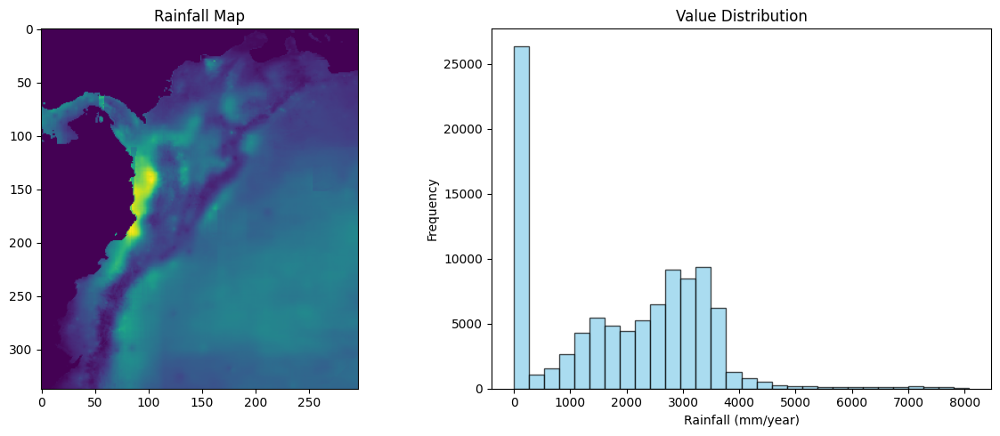

Min: 0.0
Max: 8072.4
Mean: 1907.2


In [19]:
# Read your raster file
with rio.open(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\cache\Avances_2\chirps\rainfallAnnual_mean_1981_2023.tif") as new_code:
    data = new_code.read(1)

# Flip the array for correct orientation
data_flipped = np.flipud(data)

# Create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Plot the flipped raster
ax1.imshow(data_flipped, cmap='viridis')
ax1.set_title('Rainfall Map')

# Create histogram/bar plot of value ranges
valid_data = data_flipped[data_flipped != -9999]  # Remove nodata values
ax2.hist(valid_data, bins=30, alpha=0.7, color='skyblue', edgecolor='black')
ax2.set_title('Value Distribution')
ax2.set_xlabel('Rainfall (mm/year)')
ax2.set_ylabel('Frequency')

plt.tight_layout()
plt.show()

# Print basic stats
print(f"Min: {valid_data.min():.1f}")
print(f"Max: {valid_data.max():.1f}")
print(f"Mean: {valid_data.mean():.1f}")

#### 2. Clip geometries

## 3. NASA SUCEPTIBILITY

### 3.1 Scrypt Code

In [2]:
import geopandas as gpd
import rasterio
from rasterio.mask import mask
from rasterio.windows import Window
from shapely.geometry import mapping
import numpy as np


def process_tiff_with_window(tiff_path,
                             geodataframe,
                             boundaries, 
                             method='mask',
                             column_name='suceptibility', save_slice=None):
    """
    Read TIFF once with window, then process all geometries against that slice
    
    Parameters:
    - tiff_path: path to single-band TIFF
    - geodataframe: GeoDataFrame with geometries  
    - boundaries: dict with 'lat_min', 'lat_max', 'lon_min', 'lon_max'
    - method: 'mask' for area average or 'centroid' for point sampling
    - column_name: name for the new column
    - save_slice: path to save the windowed TIFF slice (optional)
    """
    
    gdf_result = geodataframe.copy()
    gdf_result[column_name] = np.nan
    
    with rasterio.open(tiff_path) as src:
        # Calculate window from boundaries
        col_start = int((boundaries['lon_min'] - src.transform.c) / src.transform.a)
        col_end = int((boundaries['lon_max'] - src.transform.c) / src.transform.a)
        row_start = int((boundaries['lat_max'] - src.transform.f) / src.transform.e)
        row_end = int((boundaries['lat_min'] - src.transform.f) / src.transform.e)
        
        # Clamp to bounds
        col_start = max(0, min(col_start, src.width))
        col_end = max(0, min(col_end, src.width))
        row_start = max(0, min(row_start, src.height))
        row_end = max(0, min(row_end, src.height))
        
        window = Window(col_start, row_start, col_end - col_start, row_end - row_start)
        window_transform = rasterio.windows.transform(window, src.transform)
        
        print(f"Reading window: {window}")
        
        # READ THE TIFF ONCE with the window
        windowed_data = src.read(1, window=window)
        
        print(f"Windowed data shape: {windowed_data.shape}")
        
        # Save the slice if requested
        if save_slice:
            print(f"Saving windowed slice to: {save_slice}")
            
            # Create profile for the windowed data
            slice_profile = src.profile.copy()
            slice_profile.update({
                'height': windowed_data.shape[0],
                'width': windowed_data.shape[1],
                'transform': window_transform
            })
            
            # Save windowed data to file
            with rasterio.open(save_slice, 'w', **slice_profile) as slice_dst:
                slice_dst.write(windowed_data, 1)
            
            print(f"✓ Slice saved!")
        
        print(f"Processing {len(gdf_result)} geometries...")
        
        # Create a temporary rasterio-like object for the windowed data
        from rasterio.io import MemoryFile
        
        # Create profile for the windowed data
        profile = src.profile.copy()
        profile.update({
            'height': windowed_data.shape[0],
            'width': windowed_data.shape[1],
            'transform': window_transform
        })
        
        # Create in-memory dataset with windowed data
        with MemoryFile() as memfile:
            with memfile.open(**profile) as windowed_src:
                windowed_src.write(windowed_data, 1)
                
                # Now process geometries against the windowed dataset
                for idx, row in gdf_result.iterrows():
                    if (idx + 1) % max(1, len(gdf_result) // 10) == 0:
                        print(f"  Progress: {idx + 1}/{len(gdf_result)}")
                    
                    try:
                        if method == 'centroid':
                            centroid = row.geometry.centroid
                            row_idx, col_idx = windowed_src.index(centroid.x, centroid.y)
                            
                            if (0 <= row_idx < windowed_data.shape[0] and 
                                0 <= col_idx < windowed_data.shape[1]):
                                value = windowed_data[row_idx, col_idx]
                                if value != src.nodata and not np.isnan(value):
                                    gdf_result.at[idx, column_name] = value
                        
                        else:  # method == 'mask'
                            geom = [mapping(row.geometry)]
                            clipped_data, _ = mask(windowed_src, geom, crop=True, 
                                                 filled=False, all_touched=True)
                            
                            band_data = clipped_data[0]
                            if np.ma.count(band_data) > 0:
                                valid_data = band_data.data[~band_data.mask]
                                if src.nodata is not None:
                                    valid_data = valid_data[valid_data != src.nodata]
                                
                                if len(valid_data) > 0:
                                    avg_value = np.nanmean(valid_data)
                                    if not np.isnan(avg_value):
                                        gdf_result.at[idx, column_name] = avg_value
                    
                    except Exception as e:
                        continue
    
    print("✓ Done!")
    return gdf_result


### 3.2 Run model

In [3]:
import os

# Usage
col_boundaries_v2 = {
                    'lat_max': 12.590276718139648,
                    'lon_min': -81.72014617919922,    
                    'lat_min': -4.236873626708984,
                    'lon_max': -66.87045288085938
                }
tif_suceptibility = r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\databases\GlobalLandSlideSuseptibility\global-landslide-susceptibility-map-2-27-23.tif"
storage_cop = r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\NasaSuceptibility\nsa_suceptibility.tif"
gdf = gpd.read_file(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\TerrainSlope\colombia_watersheds_elevation_slope_shapefile.shp")

result_nasa = process_tiff_with_window(tif_suceptibility,
                                         gdf,
                                         col_boundaries_v2, 
                                         method='mask',
                                         column_name='suceptibility',
                                       save_slice=storage_cop)

Reading window: Window(col_off=11793, row_off=7129, width=1782, height=2019)
Windowed data shape: (2019, 1782)
Saving windowed slice to: C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\NasaSuceptibility\nsa_suceptibility.tif
✓ Slice saved!
Processing 1700 geometries...
  Progress: 170/1700
  Progress: 340/1700
  Progress: 510/1700
  Progress: 680/1700
  Progress: 850/1700
  Progress: 1020/1700
  Progress: 1190/1700
  Progress: 1360/1700
  Progress: 1530/1700
  Progress: 1700/1700
✓ Done!


In [5]:
result_nasa.columns

Index(['elev_std', 'SUB_AREA', 'elev_max', 'COAST', 'slope_std', 'PFAF_ID',
       'DIST_MAIN', 'DIST_SINK', 'HYBAS_ID', 'NEXT_DOWN', 'elev_mean', 'ORDER',
       'slope_p95', 'ENDO', 'slope_min', 'MAIN_BAS', 'elev_min', 'slope_p90',
       'SORT', 'NEXT_SINK', 'slope_mean', 'slope_max', 'UP_AREA', 'geometry',
       'suceptibility'],
      dtype='object')

In [9]:
slice_suceptibility = result_nasa.loc[: ,['HYBAS_ID' , 'suceptibility']]

In [12]:
slice_suceptibility.head()

,HYBAS_ID,suceptibility
0,6080078040,1.487805
1,6080078010,2.656646
2,6080081280,1.899497
3,6080081290,1.136513
4,6080084300,2.301162


In [13]:
slice_suceptibility.shape

(1700, 2)

In [11]:
slice_suceptibility.to_csv(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\chunks_features\suceptibility.csv",index = False)

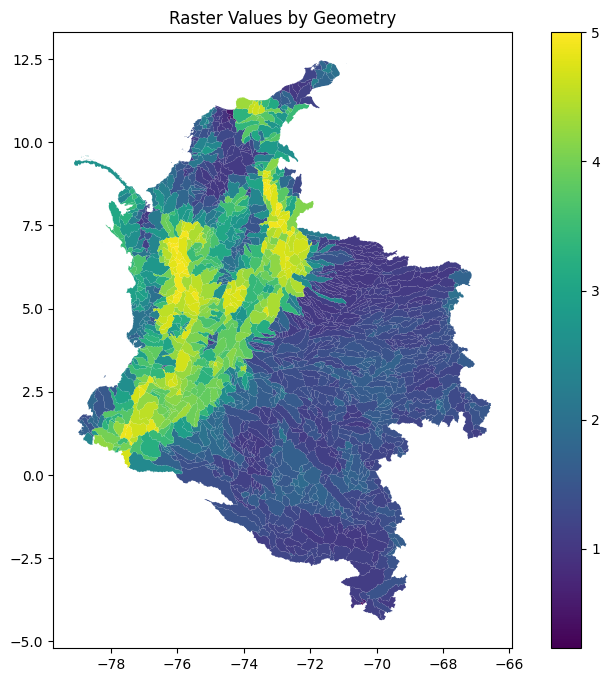

In [9]:
import rasterio as rio
import matplotlib.pyplot as plt

# Simple chloropleth map
fig, ax = plt.subplots(figsize=(10, 8))
result_nasa.plot(column='suceptibility', cmap='viridis', legend=True, ax=ax)
ax.set_title('Raster Values by Geometry')
plt.show()

## 4.Hypsometrium 

In [1]:
import os 
import geopandas as gpd 
raw_hyp = r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\Hypsometric"

hyp_gpd = gpd.read_file(raw_hyp)

In [2]:
hyp_gpd.columns

Index(['hypsometri', 'elev_mean', 'elev_max', 'elev_min', 'HYBAS_ID',
       'geometry'],
      dtype='object')

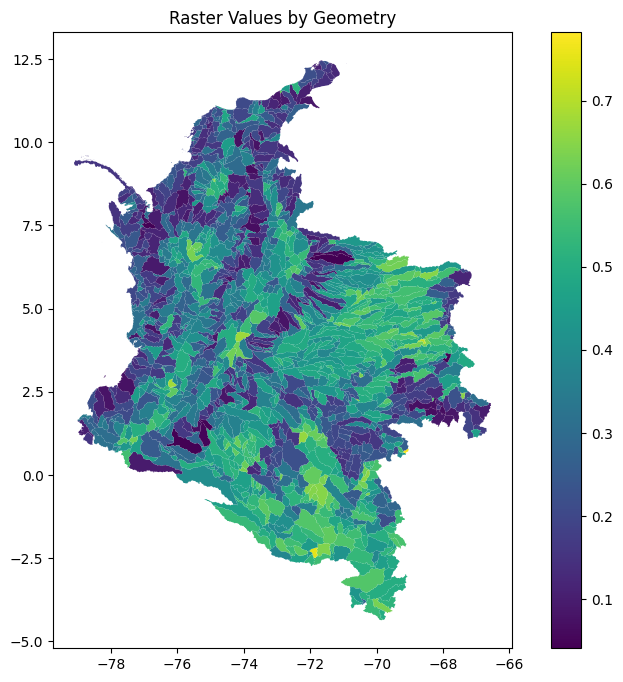

In [3]:
import rasterio as rio
import matplotlib.pyplot as plt

# Simple chloropleth map
fig, ax = plt.subplots(figsize=(10, 8))
hyp_gpd.plot(column='hypsometri', cmap='viridis', legend=True, ax=ax)
ax.set_title('Raster Values by Geometry')
plt.show()

In [4]:
hyp_gpd.loc[: , ['hypsometri', 'HYBAS_ID']].to_csv(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\chunks_features\Hypsometric.csv",index = False)

## 5 . Create Dataframe

In [3]:
from Codigo.land_slide.wranggling import load_inventario
import rasterio as rio
from rasterio.transform import Affine
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import json
import string
import random
from pathlib import Path
import os

path_main_db = r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\TerrainSlope"
cache_chunks = r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\chunks_features"
variables = ['CMIP6_Rain.csv', 'PGA.csv', 'suceptibility.csv','Hypsometric.csv']

def calculate_landslide_density(polygons_gdf, landslides_df, lon_col='longitude', lat_col='latitude'):
    """
    Calculate landslide density using spatial join - simple approach
    """
    
    # Convert landslides to GeoDataFrame
    from shapely.geometry import Point
    landslides_gdf = gpd.GeoDataFrame(
        landslides_df, 
        geometry=[Point(xy) for xy in zip(landslides_df[lon_col], landslides_df[lat_col])],
        crs='EPSG:4326'
    )
    
    # Ensure same CRS
    if polygons_gdf.crs != landslides_gdf.crs:
        landslides_gdf = landslides_gdf.to_crs(polygons_gdf.crs)
    
    # Spatial join - count landslides per polygon
    join_result = gpd.sjoin(landslides_gdf, polygons_gdf[['HYBAS_ID', 'geometry']], 
                           how="left", predicate='intersects')
    
    # Count landslides per basin
    counts = join_result.groupby('HYBAS_ID').size().reset_index(name='landslide_count')
    
    # Merge back to polygons
    result = polygons_gdf.merge(counts, on='HYBAS_ID', how='left')
    
    # Fill NaN with 0 (basins with no landslides)
    result['landslide_count'] = result['landslide_count'].fillna(0)
    
    # Calculate density
    result['landslide_density_km2'] = result['landslide_count'] / result['SUB_AREA']
    
    return result




def encode_long_columns(gdf, max_length=10):
    """
    Encode column names longer than max_length with random short names.
    Returns the modified GeoDataFrame and the mapping dictionary.
    """
    mapping = {}
    new_columns = []
    
    for col in gdf.columns:
        if len(col) > max_length:
            # Generate random short name
            short_name = ''.join(random.choices(string.ascii_lowercase + string.digits, k=max_length))
            # Ensure uniqueness
            while short_name in new_columns or short_name in gdf.columns:
                short_name = ''.join(random.choices(string.ascii_lowercase + string.digits, k=max_length))
            
            mapping[short_name] = col
            new_columns.append(short_name)
        else:
            new_columns.append(col)
    
    # Create new GDF with renamed columns
    gdf_encoded = gdf.copy()
    gdf_encoded.columns = new_columns
    
    return gdf_encoded, mapping

def save_to_shapefile_with_mapping(gdf, shapefile_path, mapping_path=None):
    """
    Save GeoDataFrame to shapefile with encoded column names and save mapping.
    """
    # Encode long columns
    gdf_encoded, mapping = encode_long_columns(gdf)
    
    # Save shapefile
    gdf_encoded.to_file(shapefile_path)
    
    # Save mapping to JSON
    if mapping_path is None:
        mapping_path = str(Path(shapefile_path).with_suffix('.json'))
    
    with open(mapping_path, 'w') as f:
        json.dump(mapping, f, indent=2)
    
    print(f"Shapefile saved to: {shapefile_path}")
    print(f"Column mapping saved to: {mapping_path}")
    print(f"Encoded {len(mapping)} long column names")
    
    return mapping



In [4]:
resultado = load_inventario( verbose=  False  )
inventario = resultado['incidentes_withdates']

In [5]:
inventario.columns

Index(['ID', 'Year', 'Month', 'Day', 'Country', 'Region', 'Department',
       'Municipality', 'Place', 'Site', 'Latitud', 'Longitud', 'Type',
       'uncertainty', 'Cause', 'Fatalities', 'losses', 'Source 1', 'Source 2',
       'Source 3', 'Source 4', 'add', 'triggering_description',
       'EFFECT OBSERVATIONS', 'Magnitud', 'subregion', 'Fecha'],
      dtype='object')

In [6]:
inventario.head()

,ID,Year,Month,Day,Country,Region,Department,Municipality,Place,Site,...,Source 1,Source 2,Source 3,Source 4,add,triggering_description,EFFECT OBSERVATIONS,Magnitud,subregion,Fecha
0,1,1930.0,10.0,19.0,Colombia,NaN,Risaralda,Santa Rosa de Cabal,Km 55 del ferrocarril de Caldas (El infierno),Km 55 del ferrocarril de Caldas (El infierno),...,colombianfatal,NaN,El Diario (1930-10-20 pp 1),NaN,Una cuadrilla de obreros se encontraba despeja...,NaN,NaN,NaN,NaN,1930-10-19
1,2,1936.0,11.0,13.0,Colombia,NaN,Boyacá,Mongua,Unknown,Unknown,...,colombianfatal,NaN,ING.,NaN,NaN,NaN,NaN,NaN,NaN,1936-11-13
2,3,1933.0,12.0,26.0,Colombia,NaN,Risaralda,Santa Rosa de Cabal,Muelas,Muelas,...,colombianfatal,NaN,El Diario (1934-01-04 pp 6),NaN,Fuerte invierno en todo el pa�s.Otros: comerci...,NaN,NaN,NaN,NaN,1933-12-26
3,4,1938.0,5.0,8.0,Colombia,NaN,Antioquia,Sonsón,Unknown,Unknown,...,colombianfatal,NaN,Fuente externa al Servicio Geológico Colombiano,TG/Calvete_López,NaN,NaN,NaN,NaN,NaN,1938-05-08
4,5,1937.0,10.0,8.0,Colombia,NaN,Antioquia,Nechí,Mina El Pato,Unknown,...,colombianfatal,NaN,EL COLOMBIANO,NaN,NO SE DEFINE.(DI6Author : C.P. DI6Date : ),NaN,NaN,NaN,NaN,1937-10-08


In [7]:
os.listdir(cache_chunks)

['CMIP6_Rain.csv',
 'Hypsometric.csv',
 'NDVI_Composite',
 'PGA.csv',
 'suceptibility.csv']

In [8]:
fileter_col_basin = [
                    #'elev_std',
                    'SUB_AREA',
                    #'elev_max',
                    #'COAST',
                    #'slope_std',
                    ## 'PFAF_ID',
                    # 'DIST_MAIN',
                    # 'DIST_SINK',
                    'HYBAS_ID',
                    #'NEXT_DOWN',
                    'elev_mean',
                    #'ORDER',
                    'slope_p95',
                    #'ENDO',
                    #'slope_min',
                    #'MAIN_BAS',
                    #'elev_min',
                    #'slope_p90',
                    #'SORT',
                    #'NEXT_SINK',
                    'slope_mean',
                    #'slope_max',
                    ##   'UP_AREA',
                    'geometry']


base_gpd = gpd.read_file( os.path.join(path_main_db,'colombia_watersheds_elevation_slope_shapefile.shp'),columns = fileter_col_basin)

for var in variables:
    
    df = pd.read_csv(os.path.join(cache_chunks , var))
    base_gpd = base_gpd.merge(right = df , how = 'inner' , on = 'HYBAS_ID')


base_gpd = calculate_landslide_density(base_gpd, inventario, lon_col='Longitud', lat_col='Latitud')

In [9]:
base_gpd.columns

Index(['HYBAS_ID', 'SUB_AREA', 'elev_mean', 'slope_mean', 'slope_p95',
       'geometry', 'Historical_TP_mean_1985-2005',
       'Historical_TP_median_1985-2005', 'Historical_TP_max_1985-2005',
       'Historical_TP_p95_1985-2005',
       ...
       'SSP5 8.5_RX5day_2080-2100', 'SSP5 8.5_R95p_2020-2040',
       'SSP5 8.5_R95p_2040-2060', 'SSP5 8.5_R95p_2060-2080',
       'SSP5 8.5_R95p_2080-2100', 'PGA', 'suceptibility', 'hypsometri',
       'landslide_count', 'landslide_density_km2'],
      dtype='object', length=115)

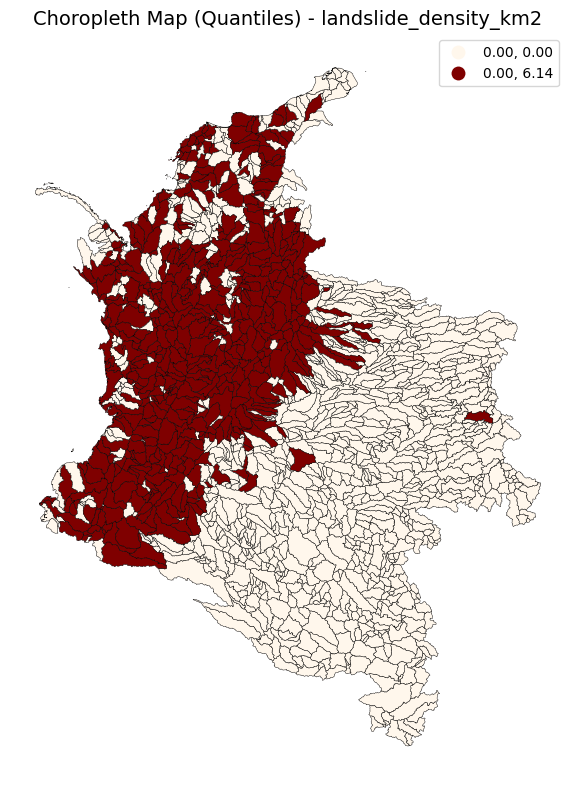

In [10]:
import matplotlib.pyplot as plt

# Load your GeoDataFrame (example: gdf)
# Make sure the column name is valid or assign an alias
column = 'landslide_density_km2'
## gdf_result = gdf_result.dropna(subset=[column])  # Drop NaNs to avoid plotting issues

# Plot using quantiles
fig, ax = plt.subplots(figsize=(10, 8))

base_gpd.plot(
    column=column,
    cmap='OrRd',
    scheme='quantiles',      # <-- key step
    k=2,                     # number of quantile classes
    legend=True,
    edgecolor='black',
    linewidth=0.3,
    ax=ax
)

plt.title(f'Choropleth Map (Quantiles) - {column}', fontsize=14)
plt.axis('off')
plt.tight_layout()
plt.show()


In [11]:
base_gpd['landslide_density_km2'].describe()

count    1700.000000
mean        0.017294
std         0.155498
min         0.000000
25%         0.000000
50%         0.000000
75%         0.003373
max         6.144224
Name: landslide_density_km2, dtype: float64

In [13]:
base_gpd.head()

,HYBAS_ID,SUB_AREA,elev_mean,slope_mean,slope_p95,geometry,Historical_TP_mean_1985-2005,Historical_TP_median_1985-2005,Historical_TP_max_1985-2005,Historical_TP_p95_1985-2005,...,SSP5 8.5_RX5day_2080-2100,SSP5 8.5_R95p_2020-2040,SSP5 8.5_R95p_2040-2060,SSP5 8.5_R95p_2060-2080,SSP5 8.5_R95p_2080-2100,PGA,suceptibility,hypsometri,landslide_count,landslide_density_km2
0,6080078040,346.9,42.340542,4.018225,17.889779,"POLYGON ((-77.17981 7.93842, -77.17843 7.95758...",2404.761230,2428.441895,2910.226807,2820.092285,...,149.780014,537.603149,554.961548,577.209412,615.566711,0.296658,1.487805,0.084118,2.0,0.005765
1,6080078010,476.8,217.260793,9.887934,28.253847,"POLYGON ((-77.23777 8.12803, -77.23333 8.12917...",2286.554443,2310.492188,2761.467773,2673.521973,...,141.727905,508.305176,523.932190,545.238464,580.546631,0.316517,2.656646,0.143024,2.0,0.004195
2,6080081280,442.1,71.756217,5.545883,17.810074,"POLYGON ((-77.29231 7.76522, -77.28537 7.76731...",3264.778320,3312.593018,3909.392578,3782.051758,...,211.962112,738.260132,763.765747,806.980835,859.036743,0.391662,1.899497,0.159063,0.0,0.000000
3,6080081290,448.4,5.688645,2.044135,4.663393,"POLYGON ((-77.09223 7.72158, -77.08807 7.72696...",3130.611816,3164.358887,3787.472412,3670.357178,...,199.375397,709.090942,735.118896,769.690979,820.508850,0.365224,1.136513,0.068117,1.0,0.002230
4,6080084300,847.4,131.561166,7.976072,20.737652,"POLYGON ((-77.4875 7.575, -77.48715 7.58576, -...",3264.778320,3312.593018,3909.392578,3782.051758,...,211.962112,738.260132,763.765747,806.980835,859.036743,0.453975,2.301162,0.125951,1.0,0.001180


In [12]:
# Save to shapefile with encoded names
mapping = save_to_shapefile_with_mapping(base_gpd, r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\main_training_set.shp")

Shapefile saved to: C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\main_training_set.shp
Column mapping saved to: C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\main_training_set.json
Encoded 107 long column names


## 6. EDA ANALYS

### 6.1 Scrypt

In [14]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import pearsonr, spearmanr
import warnings
warnings.filterwarnings('ignore')

# Set plotting style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

class LandslideSusceptibilityEDA:
    """
    Comprehensive EDA framework for landslide susceptibility analysis with climate change projections.
    
    This class provides a complete suite of exploratory data analysis tools for understanding 
    relationships between climate variables, topography, and landslide susceptibility across 
    different SSP scenarios. Focuses purely on statistical analysis and visualization.
    """
    
    def __init__(self, geodataframe=None):
        """
        Initialize the EDA framework.
        
        Parameters:
        -----------
        geodataframe : gpd.GeoDataFrame, optional
            The spatial dataset to analyze
        """
        self.gdf = geodataframe
        self.ssp_scenarios = ['SSP2 4.5', 'SSP3 7.0', 'SSP5 8.5']
        self.time_periods = ['2020-2040', '2040-2060', '2060-2080', '2080-2100']
        self.climate_vars = ['TP_mean', 'TP_median', 'TP_max', 'TP_min', 'TP_p95', 'CWD', 'RX5day', 'R95p']
        self.geographic_vars = ['HYBAS_ID', 'SUB_AREA', 'elev_mean', 'slope_mean', 'slope_p95']
        self.non_climate_features = ['SUB_AREA', 'elev_mean', 'slope_mean', 'slope_p95', 'PGA', 'suceptibility', 'hypsometri']
        self.target_vars = ['landslide_count', 'landslide_density_km2']  # Actual model targets (may not be in dataset)
        
        if self.gdf is not None:
            self._validate_data()
            self._identify_columns()
    
    def load_data(self, geodataframe):
        """
        Load a GeoDataFrame for analysis.
        
        Parameters:
        -----------
        geodataframe : gpd.GeoDataFrame
            The spatial dataset to analyze
        """
        self.gdf = geodataframe
        self._validate_data()
        self._identify_columns()
        print(f"✅ Data loaded successfully: {len(self.gdf)} features with {len(self.gdf.columns)} columns")
    
    def _validate_data(self):
        """Validate the input GeoDataFrame."""
        if not isinstance(self.gdf, gpd.GeoDataFrame):
            raise ValueError("Input must be a GeoDataFrame")
        
        if 'geometry' not in self.gdf.columns:
            raise ValueError("GeoDataFrame must contain 'geometry' column")
        
        print(f"📊 Dataset shape: {self.gdf.shape}")
        print(f"🗺️  CRS: {self.gdf.crs}")
    
    def _identify_columns(self):
        """Identify and categorize columns in the dataset."""
        self.historical_cols = [col for col in self.gdf.columns if 'Historical' in col]
        self.future_cols = [col for col in self.gdf.columns if any(ssp in col for ssp in self.ssp_scenarios)]
        
        # Organize future columns by scenario and time period
        self.scenario_cols = {}
        for scenario in self.ssp_scenarios:
            self.scenario_cols[scenario] = {}
            for period in self.time_periods:
                self.scenario_cols[scenario][period] = [
                    col for col in self.gdf.columns 
                    if scenario in col and period in col
                ]
        
        print(f"📈 Historical columns: {len(self.historical_cols)}")
        print(f"🔮 Future projection columns: {len(self.future_cols)}")
    
    def basic_statistics(self):
        """Generate comprehensive basic statistics and data quality assessment."""
        print("=" * 80)
        print("📊 BASIC STATISTICS AND DATA QUALITY ASSESSMENT")
        print("=" * 80)
        
        # Basic info
        print(f"\n🔢 Dataset Overview:")
        print(f"   • Total features: {len(self.gdf)}")
        print(f"   • Total columns: {len(self.gdf.columns)}")
        print(f"   • Geographic variables: {len(self.geographic_vars)}")
        print(f"   • Historical climate variables: {len(self.historical_cols)}")
        print(f"   • Future projection variables: {len(self.future_cols)}")
        print(f"   • Target variables: {len(self.target_vars)}")
        
        # Missing data analysis
        print(f"\n🔍 Missing Data Analysis:")
        missing_data = self.gdf.isnull().sum()
        missing_pct = (missing_data / len(self.gdf)) * 100
        
        missing_summary = pd.DataFrame({
            'Missing_Count': missing_data,
            'Missing_Percentage': missing_pct
        }).sort_values('Missing_Percentage', ascending=False)
        
        critical_missing = missing_summary[missing_summary['Missing_Percentage'] > 10]
        if len(critical_missing) > 0:
            print(f"   ⚠️  Variables with >10% missing data:")
            for var, row in critical_missing.head(10).iterrows():
                print(f"      • {var}: {row['Missing_Percentage']:.1f}%")
        else:
            print(f"   ✅ No variables with >10% missing data")
        
        # Basic statistics for key variables
        print(f"\n📈 Descriptive Statistics for Key Variables:")
        
        # Geographic/Topographic variables
        available_geo_vars = [var for var in self.geographic_vars[1:] if var in self.gdf.columns]  # Exclude HYBAS_ID
        if available_geo_vars:
            geo_stats = self.gdf[available_geo_vars].describe()
            print(f"\n🗺️  Geographic/Topographic Variables:")
            print(geo_stats)
        
        # Non-climate features (including susceptibility measures)
        available_features = [var for var in self.non_climate_features if var in self.gdf.columns]
        if available_features:
            feature_stats = self.gdf[available_features].describe()
            print(f"\n🏔️  All Non-Climate Features:")
            print(feature_stats)
        
        # Historical climate summary
        if self.historical_cols:
            hist_stats = self.gdf[self.historical_cols].describe()
            print(f"\n🌤️  Historical Climate Variables (1985-2005):")
            print(hist_stats)
        
        return {
            'missing_summary': missing_summary,
            'geographic_stats': geo_stats if 'geo_stats' in locals() else None,
            'target_stats': target_stats if 'target_stats' in locals() else None,
            'historical_stats': hist_stats if 'hist_stats' in locals() else None
        }
    
    def climate_scenario_comparison(self):
        """Compare climate projections across SSP scenarios and time periods."""
        print("\n" + "=" * 80)
        print("🌡️  CLIMATE SCENARIO COMPARISON")
        print("=" * 80)
        
        # Create comparison plots
        fig, axes = plt.subplots(2, 4, figsize=(20, 12))
        fig.suptitle('Climate Projections Across SSP Scenarios and Time Periods', fontsize=16, fontweight='bold', y=0.96)
        
        # Focus on key climate variables
        key_vars = ['TP_mean', 'TP_max', 'CWD', 'RX5day']
        
        for i, var in enumerate(key_vars):
            ax = axes[i//4, i%4]
            
            # Collect data for this variable across scenarios and periods
            scenario_data = []
            labels = []
            
            for scenario in self.ssp_scenarios:
                for period in self.time_periods:
                    col_name = f"{scenario}_{var}_{period}"
                    if col_name in self.gdf.columns:
                        data = self.gdf[col_name].dropna()
                        if len(data) > 0:
                            scenario_data.append(data)
                            labels.append(f"{scenario}\n{period}")
            
            if scenario_data:
                bp = ax.boxplot(scenario_data, labels=labels, patch_artist=True)
                
                # Color by scenario
                colors = ['lightblue', 'lightgreen', 'lightcoral']
                for patch, label in zip(bp['boxes'], labels):
                    scenario = label.split('\n')[0]
                    if scenario == 'SSP2 4.5':
                        patch.set_facecolor(colors[0])
                    elif scenario == 'SSP3 7.0':
                        patch.set_facecolor(colors[1])
                    else:
                        patch.set_facecolor(colors[2])
                
                ax.set_title(f'{var} Projections', fontweight='bold', fontsize=12)
                ax.tick_params(axis='x', rotation=45)
                ax.grid(True, alpha=0.3)
        
        # Remove empty subplots
        for i in range(len(key_vars), 8):
            fig.delaxes(axes[i//4, i%4])
        
        plt.tight_layout(rect=[0, 0, 1, 0.92])  # Leave space for suptitle
        plt.show()
        
        # Calculate percentage changes from historical baseline
        print(f"\n📊 Percentage Changes from Historical Baseline (1985-2005):")
        
        changes_summary = {}
        
        for var in ['TP_mean', 'CWD', 'RX5day']:
            hist_col = f"Historical_{var}_1985-2005"
            if hist_col in self.gdf.columns:
                hist_baseline = self.gdf[hist_col].mean()
                
                print(f"\n{var} Changes:")
                changes_summary[var] = {}
                
                for scenario in self.ssp_scenarios:
                    print(f"  {scenario}:")
                    changes_summary[var][scenario] = {}
                    
                    for period in self.time_periods:
                        future_col = f"{scenario}_{var}_{period}"
                        if future_col in self.gdf.columns:
                            future_mean = self.gdf[future_col].mean()
                            pct_change = ((future_mean - hist_baseline) / hist_baseline) * 100
                            changes_summary[var][scenario][period] = pct_change
                            print(f"    {period}: {pct_change:+.1f}%")
        
        return changes_summary
    
    def correlation_analysis(self):
        """Analyze correlations between climate, topography, and susceptibility variables."""
        print("\n" + "=" * 80)
        print("🔗 CORRELATION ANALYSIS")
        print("=" * 80)
        
        # Prepare data for correlation analysis
        analysis_cols = []
        
        # Add geographic variables (excluding ID and geometry)
        analysis_cols.extend([col for col in self.geographic_vars if col != 'HYBAS_ID'])
        
        # Add historical climate variables
        analysis_cols.extend(self.historical_cols)
        
        # Add available non-climate features
        available_features = [col for col in self.non_climate_features if col in self.gdf.columns]
        analysis_cols.extend(available_features)
        
        # Add target variables if available
        available_targets = [col for col in self.target_vars if col in self.gdf.columns]
        analysis_cols.extend(available_targets)
        
        # Add representative future projections (mid-century, moderate scenario)
        future_sample = [col for col in self.gdf.columns if 'SSP2 4.5' in col and '2040-2060' in col]
        analysis_cols.extend(future_sample[:8])  # Limit to avoid overcrowding
        
        # Create correlation matrix
        corr_data = self.gdf[analysis_cols].select_dtypes(include=[np.number])
        correlation_matrix = corr_data.corr()
        
        # Plot correlation heatmap
        plt.figure(figsize=(16, 12))
        mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
        
        sns.heatmap(correlation_matrix, 
                   mask=mask,
                   annot=True, 
                   cmap='RdBu_r', 
                   center=0,
                   square=True,
                   fmt='.2f',
                   cbar_kws={"shrink": .8})
        
        plt.title('Correlation Matrix: Climate, Topography, and Susceptibility Variables', 
                 fontsize=14, fontweight='bold', pad=25)
        plt.xticks(rotation=45, ha='right')
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()
        
        # Identify strong correlations with target variables (if available)
        available_targets = [var for var in self.target_vars if var in correlation_matrix.columns]
        
        if available_targets:
            print(f"\n🎯 Strong Correlations with Target Variables (|r| > 0.5):")
            
            strong_correlations = {}
            for target in available_targets:
                target_corrs = correlation_matrix[target].abs().sort_values(ascending=False)
                strong_corrs = target_corrs[target_corrs > 0.5]
                strong_corrs = strong_corrs.drop(target)  # Remove self-correlation
                
                if len(strong_corrs) > 0:
                    print(f"\n  {target}:")
                    strong_correlations[target] = strong_corrs
                    for var, corr in strong_corrs.head(10).items():
                        direction = "📈" if correlation_matrix.loc[var, target] > 0 else "📉"
                        print(f"    {direction} {var}: {correlation_matrix.loc[var, target]:.3f}")
        else:
            print(f"\n📝 Note: Target variables ({', '.join(self.target_vars)}) not found in dataset")
            strong_correlations = {}
            
            # Show strong correlations among available features instead
            print(f"\n🔗 Strong Correlations Among Features (|r| > 0.7):")
            for i, var1 in enumerate(available_features[:5]):  # Limit to first 5 features
                if var1 in correlation_matrix.columns:
                    var_corrs = correlation_matrix[var1].abs().sort_values(ascending=False)
                    strong_corrs = var_corrs[(var_corrs > 0.7) & (var_corrs < 1.0)]  # Exclude self-correlation
                    
                    if len(strong_corrs) > 0:
                        print(f"\n  {var1}:")
                        for var2, corr in strong_corrs.head(3).items():
                            direction = "📈" if correlation_matrix.loc[var2, var1] > 0 else "📉"
                            print(f"    {direction} {var2}: {correlation_matrix.loc[var2, var1]:.3f}")
        
        return correlation_matrix, strong_correlations
    
    def geospatial_mapping(self, variables=None):
        """Create beautiful choropleth maps of non-climate features."""
        print("\n" + "=" * 80)
        print("🗺️  GEOSPATIAL MAPPING - NON-CLIMATE FEATURES")
        print("=" * 80)
        
        if variables is None:
            # Default to all available non-climate features
            variables = [var for var in self.non_climate_features if var in self.gdf.columns]
        
        # Filter variables that exist in the dataset
        available_vars = [var for var in variables if var in self.gdf.columns]
        
        if not available_vars:
            print("❌ No specified non-climate variables found in dataset")
            return
        
        print(f"📊 Creating choropleth maps for: {', '.join(available_vars)}")
        
        # Create maps
        n_vars = len(available_vars)
        cols = 3
        rows = (n_vars + cols - 1) // cols
        
        fig, axes = plt.subplots(rows, cols, figsize=(18, 6*rows))
        if rows == 1:
            axes = axes.reshape(1, -1)
        elif cols == 1:
            axes = axes.reshape(-1, 1)
        
        fig.suptitle('Spatial Distribution of Non-Climate Features', fontsize=16, fontweight='bold', y=0.98)
        
        # Define a beautiful color palette for different variable types
        color_schemes = {
            'topographic': 'terrain',      # For elevation, slope
            'area': 'Blues',              # For SUB_AREA
            'susceptibility': 'Reds',     # For suceptibility  
            'seismic': 'plasma',          # For PGA
            'morphological': 'viridis'    # For hypsometri
        }
        
        for i, var in enumerate(available_vars):
            row, col = i // cols, i % cols
            ax = axes[row, col] if rows > 1 else axes[col]
            
            # Choose appropriate colormap based on variable type
            if 'elev' in var.lower() or 'slope' in var.lower():
                cmap = color_schemes['topographic']
            elif 'area' in var.lower():
                cmap = color_schemes['area']
            elif 'suceptibility' in var.lower():
                cmap = color_schemes['susceptibility']
            elif 'pga' in var.lower():
                cmap = color_schemes['seismic']
            elif 'hypsometri' in var.lower():
                cmap = color_schemes['morphological']
            else:
                cmap = 'viridis'
            
            # Create the choropleth map
            self.gdf.plot(column=var, ax=ax, cmap=cmap, legend=True,
                         legend_kwds={'shrink': 0.6, 'aspect': 15, 'pad': 0.05},
                         edgecolor='white', linewidth=0.1)
            
            # Beautify the plot
            ax.set_title(f'{var.replace("_", " ").title()}', fontweight='bold', fontsize=12, pad=10)
            ax.axis('off')
            
            # Add subtle background
            ax.set_facecolor('#f8f9fa')
        
        # Remove empty subplots
        for i in range(n_vars, rows * cols):
            row, col = i // cols, i % cols
            if rows > 1:
                fig.delaxes(axes[row, col])
            else:
                fig.delaxes(axes[col])
        
        plt.tight_layout(rect=[0, 0, 1, 0.94])  # Leave space for suptitle
        
        plt.savefig(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\Graficas\Entrega 2\FixedVariables\all_terrain.png", dpi=300, bbox_inches='tight',  facecolor='white', edgecolor='none')
        plt.show()
        
        # Print spatial statistics
        print(f"\n📊 Spatial Statistics Summary:")
        for var in available_vars:
            if self.gdf[var].dtype in ['float64', 'int64']:
                data = self.gdf[var].dropna()
                print(f"\n{var.replace('_', ' ').title()}:")
                print(f"  Range: {data.min():.3f} - {data.max():.3f}")
                print(f"  Mean: {data.mean():.3f} ± {data.std():.3f}")
                print(f"  Spatial extent: {len(data)} features")
                
                # Add percentile information
                p25, p50, p75 = data.quantile([0.25, 0.5, 0.75])
                print(f"  Quartiles: Q1={p25:.3f}, Median={p50:.3f}, Q3={p75:.3f}")
    
    def climate_change_visualization(self):
        """Calculate and report statistical summaries of relative changes in climate variables by SSP scenario."""
        print("\n" + "=" * 80)
        print("🌡️  CLIMATE CHANGE STATISTICAL SUMMARY - RELATIVE CHANGES BY SCENARIO")
        print("=" * 80)
        
        # End-of-century period for analysis
        end_period = "2080-2100"
        
        # Process each climate variable
        for climate_var in self.climate_vars:
            print(f"\n📊 Statistical Summary for {climate_var}:")
            
            # Get historical baseline column
            hist_col = f"Historical_{climate_var}_1985-2005"
            if hist_col not in self.gdf.columns:
                print(f"   ⚠️  No historical data available")
                continue
            
            # Calculate and print historical mean
            hist_baseline = self.gdf[hist_col].mean()
            print(f"      Historical mean: {hist_baseline:.2f}")
            
            # Calculate relative changes for each scenario
            for scenario in self.ssp_scenarios:
                future_col = f"{scenario}_{climate_var}_{end_period}"
                if future_col in self.gdf.columns:
                    # Calculate percentage change from historical baseline
                    future_data = self.gdf[future_col].dropna()
                    hist_data = self.gdf[hist_col].dropna()
                    
                    # Align the data (only polygons that have both historical and future data)
                    common_indices = future_data.index.intersection(hist_data.index)
                    future_aligned = future_data.loc[common_indices]
                    hist_aligned = hist_data.loc[common_indices]
                    
                    if len(common_indices) > 0:
                        # Calculate percentage change for each polygon
                        pct_changes = ((future_aligned - hist_aligned) / hist_aligned) * 100
                        
                        # Calculate statistics
                        mean_change = pct_changes.mean()
                        std_change = pct_changes.std()
                        n_polygons = len(pct_changes)
                        
                        # Format output
                        sign = "+" if mean_change >= 0 else ""
                        print(f"      {scenario}: {sign}{mean_change:.1f}% ± {std_change:.1f}% (n={n_polygons})")
                    else:
                        print(f"      {scenario}: No data available")
                else:
                    print(f"      {scenario}: No future projection available")
            
            print("-" * 60)
    
    def generate_research_insights(self):
        """Generate comprehensive research insights and recommendations."""
        print("\n" + "=" * 80)
        print("🔬 RESEARCH INSIGHTS AND RECOMMENDATIONS")
        print("=" * 80)
        
        insights = []
        
        # Data quality insights
        missing_data = self.gdf.isnull().sum().sum()
        total_cells = len(self.gdf) * len(self.gdf.columns)
        completeness = (1 - missing_data / total_cells) * 100
        
        insights.append(f"📊 Data Quality: {completeness:.1f}% complete dataset with {len(self.gdf)} spatial features")
        
        # Climate change insights
        if self.historical_cols and self.future_cols:
            # Calculate average changes across scenarios
            avg_changes = {}
            for var in ['TP_mean', 'CWD']:
                hist_col = f"Historical_{var}_1985-2005"
                if hist_col in self.gdf.columns:
                    hist_mean = self.gdf[hist_col].mean()
                    
                    future_changes = []
                    for scenario in self.ssp_scenarios:
                        future_col = f"{scenario}_{var}_2080-2100"
                        if future_col in self.gdf.columns:
                            future_mean = self.gdf[future_col].mean()
                            change = ((future_mean - hist_mean) / hist_mean) * 100
                            future_changes.append(change)
                    
                    if future_changes:
                        avg_changes[var] = np.mean(future_changes)
            
            if avg_changes:
                insights.append(f"🌡️  Climate Projections: Average changes by 2080-2100 show significant climate shifts")
                for var, change in avg_changes.items():
                    direction = "increase" if change > 0 else "decrease"
                    insights.append(f"   • {var}: {abs(change):.1f}% {direction} on average across SSP scenarios")
        
        # Susceptibility insights (if available)
        susceptibility_features = [var for var in ['suceptibility', 'PGA', 'hypsometri'] if var in self.gdf.columns]
        if susceptibility_features:
            for feature in susceptibility_features:
                feature_stats = self.gdf[feature].describe()
                high_risk = (self.gdf[feature] > feature_stats['75%']).sum()
                insights.append(f"⚠️  {feature.title()}: {high_risk} features ({high_risk/len(self.gdf)*100:.1f}%) show high values (>75th percentile)")
        
        # Topographic insights
        if 'slope_mean' in self.gdf.columns and 'elev_mean' in self.gdf.columns:
            slope_stats = self.gdf['slope_mean'].describe()
            elev_stats = self.gdf['elev_mean'].describe()
            insights.append(f"🏔️  Topography: Elevation range {elev_stats['min']:.0f}-{elev_stats['max']:.0f}m, slope range {slope_stats['min']:.1f}-{slope_stats['max']:.1f}°")
        
        # Print insights
        print("\n📋 Key Findings:")
        for i, insight in enumerate(insights, 1):
            print(f"{i}. {insight}")
        
        # Recommendations
        recommendations = [
            "🔄 Integrate multiple climate scenarios in risk assessment analyses",
            "📈 Focus on high-slope, high-elevation areas for detailed susceptibility studies",
            "🌧️  Consider precipitation intensity changes in addition to total precipitation",
            "🗂️  Develop temporal risk maps showing evolution of susceptibility over time",
            "🔗 Investigate interactions between climate variables and topographic factors",
            "📊 Conduct detailed statistical modeling of climate-susceptibility relationships",
            "🌍 Consider local adaptation strategies for high-risk areas",
            "📈 Perform additional correlation analysis between extreme weather events and landslides"
        ]
        
        print(f"\n💡 Recommendations for Further Research:")
        for i, rec in enumerate(recommendations, 1):
            print(f"{i}. {rec}")
        
        return {
            'insights': insights,
            'recommendations': recommendations,
            'data_completeness': completeness
        }
    
    def run_complete_analysis(self):
        """Run the complete EDA workflow."""
        if self.gdf is None:
            print("❌ No data loaded. Please use load_data() first.")
            return
        
        print("🚀 Starting Comprehensive Landslide Susceptibility EDA")
        print("="*80)
        
        # Run all analyses
        basic_stats = self.basic_statistics()
        correlation_results = self.correlation_analysis()
        self.geospatial_mapping()
        self.climate_change_visualization()
        research_insights = self.generate_research_insights()
        
        print("\n" + "="*80)
        print("✅ ANALYSIS COMPLETE")
        print("="*80)
        print("\nAll analyses have been completed successfully!")
        print("Review the outputs above for comprehensive insights into your landslide susceptibility dataset.")
        
        return {
            'basic_statistics': basic_stats,
            'correlations': correlation_results,
            'insights': research_insights
        }



#### Run

In [15]:
import geopandas as gpd
from pathlib import Path

def restore_original_columns(gdf, mapping_path):
    """
    Restore original column names using the mapping dictionary.
    """
    # Load mapping
    with open(mapping_path, 'r') as f:
        mapping = json.load(f)
    
    # Create reverse mapping (encoded_name -> original_name)
    gdf_restored = gdf.copy()
    
    # Rename columns back to original names
    for encoded_name, original_name in mapping.items():
        if encoded_name in gdf_restored.columns:
            gdf_restored = gdf_restored.rename(columns={encoded_name: original_name})
    
    return gdf_restored

def load_shapefile_with_original_names(shapefile_path, mapping_path=None):
    """
    Load shapefile and restore original column names.
    """
    # Load shapefile
    gdf = gpd.read_file(shapefile_path)
    
    # Determine mapping path if not provided
    if mapping_path is None:
        mapping_path = str(Path(shapefile_path).with_suffix('.json'))
    
    # Restore original column names
    gdf_restored = restore_original_columns(gdf, mapping_path)
    
    return gdf_restored

# Later, load back with original names
gdf_restored = load_shapefile_with_original_names(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\main_training_set.shp")

In [16]:
gdf_restored.head()

,HYBAS_ID,SUB_AREA,elev_mean,slope_mean,slope_p95,Historical_TP_mean_1985-2005,Historical_TP_median_1985-2005,Historical_TP_max_1985-2005,Historical_TP_p95_1985-2005,Historical_TP_min_1985-2005,...,SSP5 8.5_R95p_2020-2040,SSP5 8.5_R95p_2040-2060,SSP5 8.5_R95p_2060-2080,SSP5 8.5_R95p_2080-2100,PGA,suceptibility,hypsometri,landslide_count,landslide_density_km2,geometry
0,6080078040,346.9,42.340542,4.018225,17.889779,2404.761230,2428.441895,2910.226807,2820.092285,1925.344238,...,537.603149,554.961548,577.209412,615.566711,0.296658,1.487805,0.084118,2.0,0.005765,"POLYGON ((-77.17981 7.93842, -77.17843 7.95758..."
1,6080078010,476.8,217.260793,9.887934,28.253847,2286.554443,2310.492188,2761.467773,2673.521973,1834.826172,...,508.305176,523.932190,545.238464,580.546631,0.316517,2.656646,0.143024,2.0,0.004195,"POLYGON ((-77.23777 8.12803, -77.23333 8.12917..."
2,6080081280,442.1,71.756217,5.545883,17.810074,3264.778320,3312.593018,3909.392578,3782.051758,2658.418945,...,738.260132,763.765747,806.980835,859.036743,0.391662,1.899497,0.159063,0.0,0.000000,"POLYGON ((-77.29231 7.76522, -77.28537 7.76731..."
3,6080081290,448.4,5.688645,2.044135,4.663393,3130.611816,3164.358887,3787.472412,3670.357178,2516.664795,...,709.090942,735.118896,769.690979,820.508850,0.365224,1.136513,0.068117,1.0,0.002230,"POLYGON ((-77.09223 7.72158, -77.08807 7.72696..."
4,6080084300,847.4,131.561166,7.976072,20.737652,3264.778320,3312.593018,3909.392578,3782.051758,2658.418945,...,738.260132,763.765747,806.980835,859.036743,0.453975,2.301162,0.125951,1.0,0.001180,"POLYGON ((-77.4875 7.575, -77.48715 7.58576, -..."


📊 Dataset shape: (1700, 115)
🗺️  CRS: EPSG:4326
📈 Historical columns: 8
🔮 Future projection columns: 96
✅ Data loaded successfully: 1700 features with 115 columns
🚀 Starting Comprehensive Landslide Susceptibility EDA
📊 BASIC STATISTICS AND DATA QUALITY ASSESSMENT

🔢 Dataset Overview:
   • Total features: 1700
   • Total columns: 115
   • Geographic variables: 5
   • Historical climate variables: 8
   • Future projection variables: 96
   • Target variables: 2

🔍 Missing Data Analysis:
   ✅ No variables with >10% missing data

📈 Descriptive Statistics for Key Variables:

🗺️  Geographic/Topographic Variables:
          SUB_AREA    elev_mean   slope_mean    slope_p95
count  1700.000000  1700.000000  1700.000000  1700.000000
mean    735.701765   499.732657     8.105398    17.718561
std     729.193038   697.482451     7.021787    13.166440
min       0.600000     1.067482     0.612093     3.354902
25%     251.250000   123.013921     3.364447     7.438532
50%     511.150000   194.027228     4.

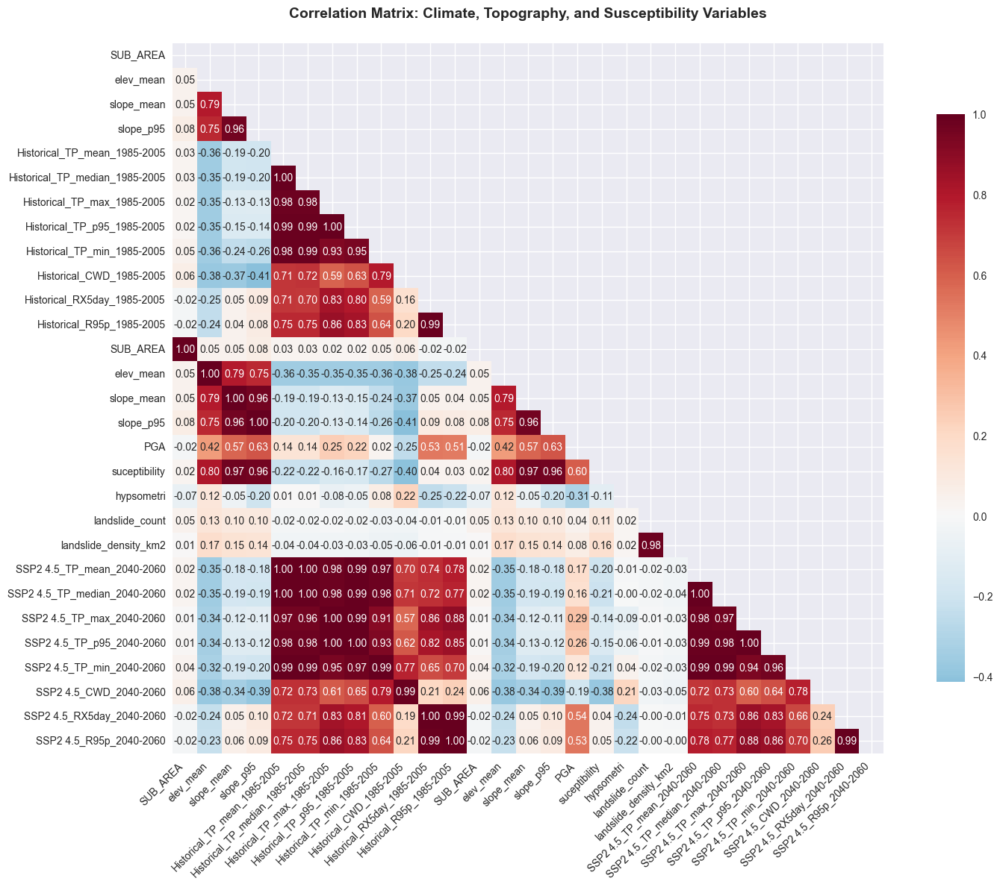


🎯 Strong Correlations with Target Variables (|r| > 0.5):

  landslide_count:
    📈 landslide_density_km2: 0.977

  landslide_density_km2:
    📈 landslide_count: 0.977

🗺️  GEOSPATIAL MAPPING - NON-CLIMATE FEATURES
📊 Creating choropleth maps for: SUB_AREA, elev_mean, slope_mean, slope_p95, PGA, suceptibility, hypsometri


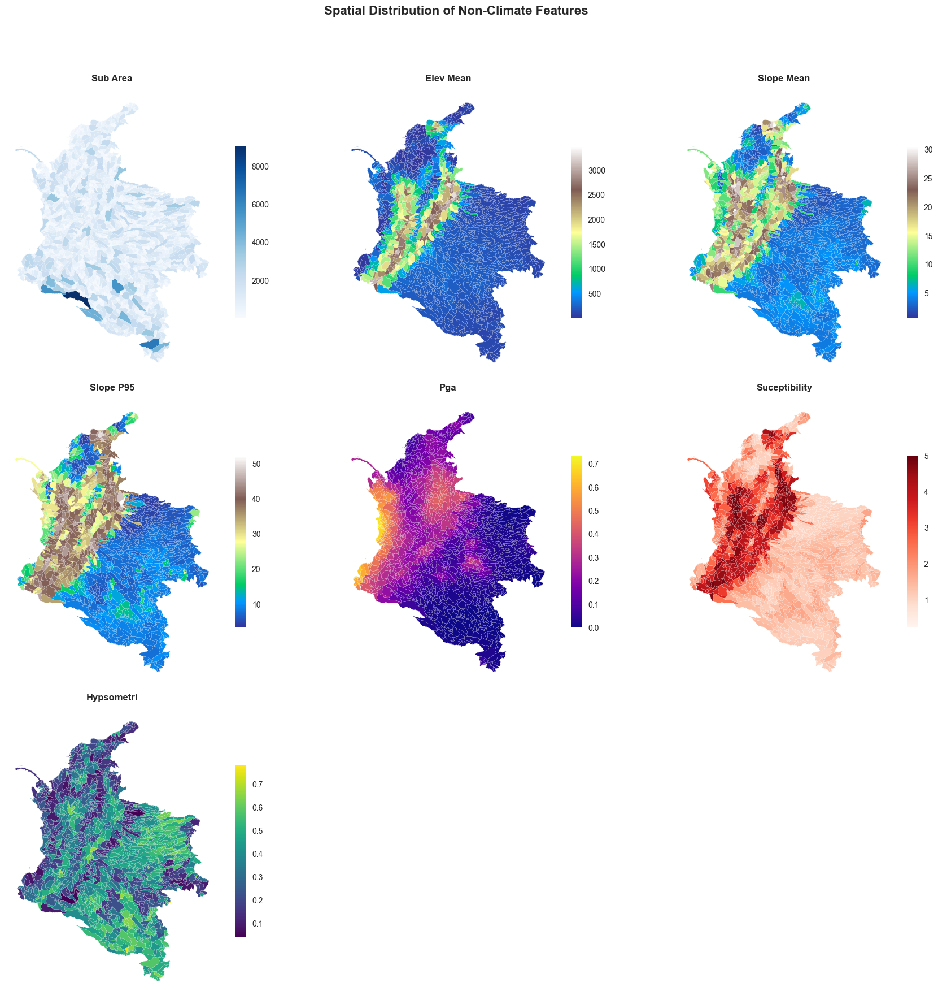


📊 Spatial Statistics Summary:

Sub Area:
  Range: 0.600 - 9059.300
  Mean: 735.702 ± 729.193
  Spatial extent: 1700 features
  Quartiles: Q1=251.250, Median=511.150, Q3=987.050

Elev Mean:
  Range: 1.067 - 3478.903
  Mean: 499.733 ± 697.482
  Spatial extent: 1700 features
  Quartiles: Q1=123.014, Median=194.027, Q3=451.617

Slope Mean:
  Range: 0.612 - 30.561
  Mean: 8.105 ± 7.022
  Spatial extent: 1700 features
  Quartiles: Q1=3.364, Median=4.515, Q3=11.921

Slope P95:
  Range: 3.355 - 52.246
  Mean: 17.719 ± 13.166
  Spatial extent: 1700 features
  Quartiles: Q1=7.439, Median=10.362, Q3=29.749

Pga:
  Range: 0.000 - 0.734
  Mean: 0.163 ± 0.152
  Spatial extent: 1700 features
  Quartiles: Q1=0.023, Median=0.127, Q3=0.265

Suceptibility:
  Range: 0.229 - 5.000
  Mean: 2.136 ± 1.206
  Spatial extent: 1700 features
  Quartiles: Q1=1.227, Median=1.565, Q3=2.962

Hypsometri:
  Range: 0.041 - 0.783
  Mean: 0.357 ± 0.150
  Spatial extent: 1700 features
  Quartiles: Q1=0.226, Median=0.371, Q

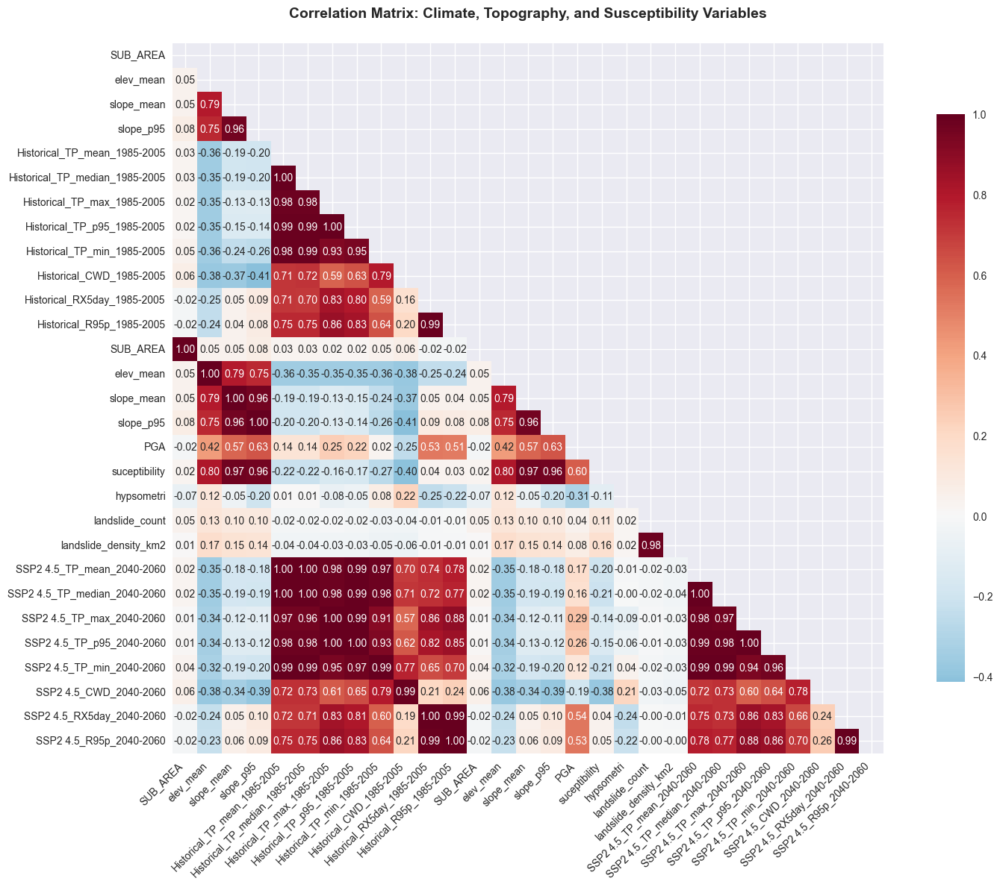


🎯 Strong Correlations with Target Variables (|r| > 0.5):

  landslide_count:
    📈 landslide_density_km2: 0.977

  landslide_density_km2:
    📈 landslide_count: 0.977

🗺️  GEOSPATIAL MAPPING - NON-CLIMATE FEATURES
📊 Creating choropleth maps for: SUB_AREA, elev_mean, slope_mean, slope_p95, PGA, suceptibility, hypsometri


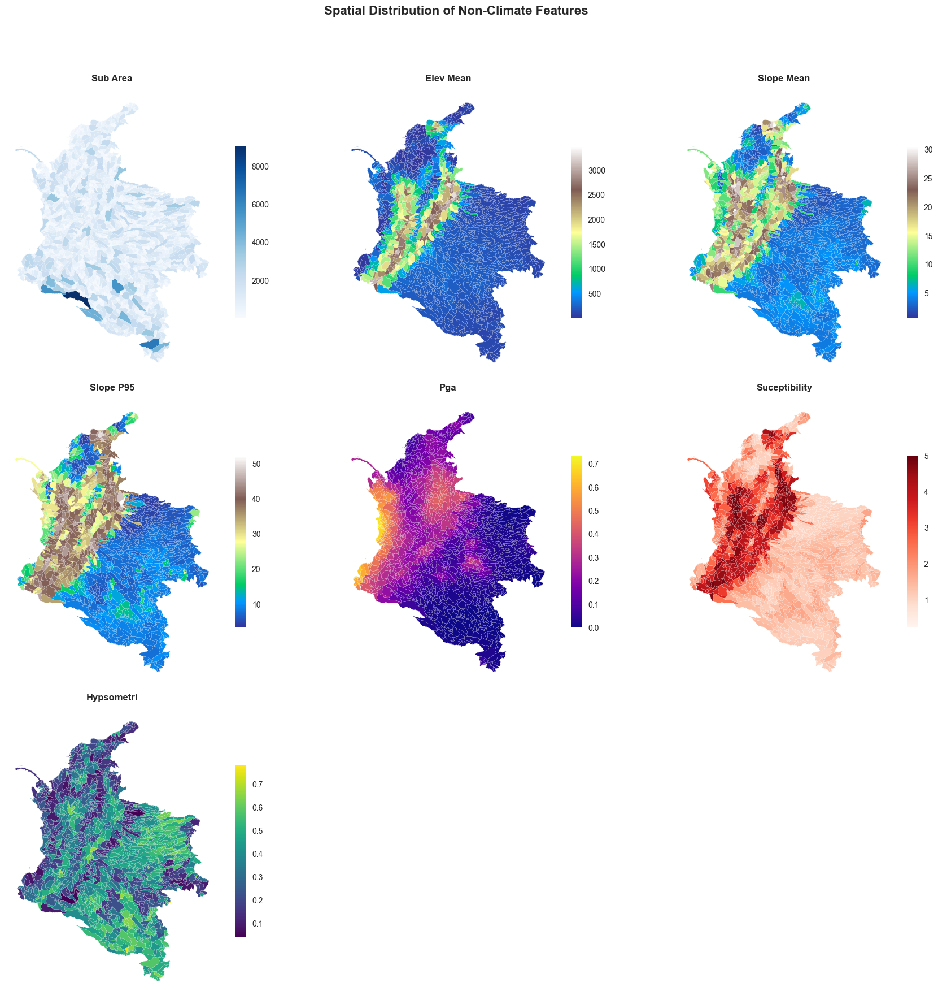


📊 Spatial Statistics Summary:

Sub Area:
  Range: 0.600 - 9059.300
  Mean: 735.702 ± 729.193
  Spatial extent: 1700 features
  Quartiles: Q1=251.250, Median=511.150, Q3=987.050

Elev Mean:
  Range: 1.067 - 3478.903
  Mean: 499.733 ± 697.482
  Spatial extent: 1700 features
  Quartiles: Q1=123.014, Median=194.027, Q3=451.617

Slope Mean:
  Range: 0.612 - 30.561
  Mean: 8.105 ± 7.022
  Spatial extent: 1700 features
  Quartiles: Q1=3.364, Median=4.515, Q3=11.921

Slope P95:
  Range: 3.355 - 52.246
  Mean: 17.719 ± 13.166
  Spatial extent: 1700 features
  Quartiles: Q1=7.439, Median=10.362, Q3=29.749

Pga:
  Range: 0.000 - 0.734
  Mean: 0.163 ± 0.152
  Spatial extent: 1700 features
  Quartiles: Q1=0.023, Median=0.127, Q3=0.265

Suceptibility:
  Range: 0.229 - 5.000
  Mean: 2.136 ± 1.206
  Spatial extent: 1700 features
  Quartiles: Q1=1.227, Median=1.565, Q3=2.962

Hypsometri:
  Range: 0.041 - 0.783
  Mean: 0.357 ± 0.150
  Spatial extent: 1700 features
  Quartiles: Q1=0.226, Median=0.371, Q

{'insights': ['📊 Data Quality: 100.0% complete dataset with 1700 spatial features',
  '🌡️  Climate Projections: Average changes by 2080-2100 show significant climate shifts',
  '   • TP_mean: 3.6% decrease on average across SSP scenarios',
  '   • CWD: 9.5% decrease on average across SSP scenarios',
  '⚠️  Suceptibility: 425 features (25.0%) show high values (>75th percentile)',
  '⚠️  Pga: 425 features (25.0%) show high values (>75th percentile)',
  '⚠️  Hypsometri: 425 features (25.0%) show high values (>75th percentile)',
  '🏔️  Topography: Elevation range 1-3479m, slope range 0.6-30.6°'],
 'recommendations': ['🔄 Integrate multiple climate scenarios in risk assessment analyses',
  '📈 Focus on high-slope, high-elevation areas for detailed susceptibility studies',
  '🌧️  Consider precipitation intensity changes in addition to total precipitation',
  '🗂️  Develop temporal risk maps showing evolution of susceptibility over time',
  '🔗 Investigate interactions between climate variables a

In [17]:
# Usage Example:
# ===============
# 
# # Initialize the framework
eda = LandslideSusceptibilityEDA()
# 
# # Load your GeoDataFrame
eda.load_data(gdf_restored)
# 
# # Run complete analysis
results = eda.run_complete_analysis()
# 
# # Or run individual analyses
eda.basic_statistics()
eda.correlation_analysis()
eda.geospatial_mapping()  # Beautiful choropleth maps for non-climate features
eda.climate_change_visualization()  # Choropleth maps showing relative climate changes
eda.generate_research_insights()

### 6.2 Scryp 2

This second part is intended for the rain variables.

In [17]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import os
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

def setup_directories():
    """Create necessary directories for output files"""
    directories = [
        'summary_tables',
        'relative_change_plots/TP',
        'relative_change_plots/CWD',
        'relative_change_plots/RX5day',
        'relative_change_plots/R95p'
    ]
    
    for directory in directories:
        Path(directory).mkdir(parents=True, exist_ok=True)
    print("✅ Directorios creados exitosamente")



def identify_climate_columns(gdf):
    """Identify climate-related columns based on exact naming convention"""
    climate_cols = {}
    
    # Define the exact naming patterns based on your data
    scenarios_map = {
        'SSP2-4.5': 'SSP2 4.5',
        'SSP3-7.0': 'SSP3 7.0', 
        'SSP5-8.5': 'SSP5 8.5'
    }
    
    climate_indices = ['TP', 'CWD', 'RX5day', 'R95p']
    periods = ['2020-2040', '2040-2060', '2060-2080', '2080-2100']
    
    # Initialize structure
    for index in climate_indices:
        climate_cols[index] = {}
        climate_cols[index]['historical'] = {}
        climate_cols[index]['historical']['1985-2005'] = {}
        
        for scenario_key in scenarios_map.keys():
            climate_cols[index][scenario_key] = {}
            for period in periods:
                climate_cols[index][scenario_key][period] = {}
    
    # Map historical columns
    for index in climate_indices:
        if index == 'TP':
            # TP has multiple statistics for historical
            stats = ['mean', 'median', 'max', 'p95', 'min']
            for stat in stats:
                col_name = f"Historical_{index}_{stat}_1985-2005"
                if col_name in gdf.columns:
                    climate_cols[index]['historical']['1985-2005'][stat] = col_name
        else:
            # CWD, RX5day, R95p have single values for historical
            col_name = f"Historical_{index}_1985-2005"
            if col_name in gdf.columns:
                climate_cols[index]['historical']['1985-2005']['value'] = col_name
    
    # Map future scenario columns
    for scenario_key, scenario_name in scenarios_map.items():
        for period in periods:
            for index in climate_indices:
                if index == 'TP':
                    # TP has multiple statistics
                    stats = ['mean', 'median', 'max', 'p95', 'min']
                    for stat in stats:
                        col_name = f"{scenario_name}_{index}_{stat}_{period}"
                        if col_name in gdf.columns:
                            climate_cols[index][scenario_key][period][stat] = col_name
                else:
                    # CWD, RX5day, R95p have single values
                    col_name = f"{scenario_name}_{index}_{period}"
                    if col_name in gdf.columns:
                        climate_cols[index][scenario_key][period]['value'] = col_name
    
    return climate_cols

def calculate_relative_change(historical_val, future_val):
    """Calculate relative change: (future - historical) / historical * 100"""
    if pd.isna(historical_val) or pd.isna(future_val) or historical_val == 0:
        return np.nan
    return ((future_val - historical_val) / historical_val) * 100

def part1_summary_statistics(gdf, climate_cols):
    """PART 1: Create summary statistics for climate indices"""
    print("\n🟩 PARTE 1: Estadísticas resumidas para índices climáticos")
    
    climate_indices = ['TP', 'CWD', 'RX5day', 'R95p']
    scenarios = ['SSP2-4.5', 'SSP3-7.0', 'SSP5-8.5']
    future_periods = ['2020-2040', '2040-2060', '2060-2080', '2080-2100']
    historical_period = '1985-2005'
    
    summary_data = []
    
    for index in climate_indices:
        print(f"📊 Procesando índice: {index}")
        
        if index == 'TP':
            # TP has multiple statistics
            stats = ['mean', 'median', 'max', 'p95', 'min']
            for stat in stats:
                # Get historical values
                hist_col = climate_cols[index]['historical'][historical_period].get(stat)
                
                if hist_col and hist_col in gdf.columns:
                    historical_vals = gdf[hist_col]
                    
                    for scenario in scenarios:
                        for period in future_periods:
                            # Get future values
                            future_col = climate_cols[index][scenario][period].get(stat)
                            
                            if future_col and future_col in gdf.columns:
                                future_vals = gdf[future_col]
                                
                                # Calculate relative changes
                                rel_changes = []
                                for i in range(len(gdf)):
                                    rel_change = calculate_relative_change(historical_vals.iloc[i], 
                                                                         future_vals.iloc[i])
                                    rel_changes.append(rel_change)
                                
                                rel_changes = pd.Series(rel_changes).dropna()
                                
                                if len(rel_changes) > 0:
                                    summary_data.append({
                                        'Indice': index,
                                        'Estadistica': stat,
                                        'Escenario': scenario,
                                        'Periodo': period,
                                        'Media_Historica': historical_vals.mean(),
                                        'Media_Futura': future_vals.mean(),
                                        'Cambio_Relativo_Medio': rel_changes.mean(),
                                        'Cambio_Relativo_Mediana': rel_changes.median(),
                                        'Cambio_Relativo_Min': rel_changes.min(),
                                        'Cambio_Relativo_Max': rel_changes.max(),
                                        'Cambio_Relativo_P25': rel_changes.quantile(0.25),
                                        'Cambio_Relativo_P75': rel_changes.quantile(0.75)
                                    })
                                    print(f"   ✓ {stat} - {scenario} - {period}")
        else:
            # CWD, RX5day, R95p have single values
            hist_col = climate_cols[index]['historical'][historical_period].get('value')
            
            if hist_col and hist_col in gdf.columns:
                historical_vals = gdf[hist_col]
                
                for scenario in scenarios:
                    for period in future_periods:
                        # Get future values
                        future_col = climate_cols[index][scenario][period].get('value')
                        
                        if future_col and future_col in gdf.columns:
                            future_vals = gdf[future_col]
                            
                            # Calculate relative changes
                            rel_changes = []
                            for i in range(len(gdf)):
                                rel_change = calculate_relative_change(historical_vals.iloc[i], 
                                                                     future_vals.iloc[i])
                                rel_changes.append(rel_change)
                            
                            rel_changes = pd.Series(rel_changes).dropna()
                            
                            if len(rel_changes) > 0:
                                summary_data.append({
                                    'Indice': index,
                                    'Estadistica': 'value',
                                    'Escenario': scenario,
                                    'Periodo': period,
                                    'Media_Historica': historical_vals.mean(),
                                    'Media_Futura': future_vals.mean(),
                                    'Cambio_Relativo_Medio': rel_changes.mean(),
                                    'Cambio_Relativo_Mediana': rel_changes.median(),
                                    'Cambio_Relativo_Min': rel_changes.min(),
                                    'Cambio_Relativo_Max': rel_changes.max(),
                                    'Cambio_Relativo_P25': rel_changes.quantile(0.25),
                                    'Cambio_Relativo_P75': rel_changes.quantile(0.75)
                                })
                                print(f"   ✓ valor - {scenario} - {period}")
    
    if summary_data:
        summary_df = pd.DataFrame(summary_data)
        summary_df.to_csv('summary_tables/climate_summary_statistics.csv', index=False)
        print(f"✅ Estadísticas resumidas guardadas: {len(summary_df)} registros")
        
        # Create separate files for each index
        for index in climate_indices:
            index_data = summary_df[summary_df['Indice'] == index]
            if not index_data.empty:
                index_data.to_csv(f'summary_tables/{index}_summary_statistics.csv', index=False)
                print(f"✅ Estadísticas para {index} guardadas")
    else:
        print("⚠️  No se pudieron calcular estadísticas resumidas")

def create_scenario_relative_change_plot(gdf, index, scenario, scenario_data, spanish_titles):
    """Create a 2x2 plot showing 4 time periods for a specific index and scenario"""
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()
    
    periods = ['2020-2040', '2040-2060', '2060-2080', '2080-2100']
    
    if index == 'TP':
        stat = 'mean'  # Use mean as representative statistic for TP
        title_prefix = 'Cambio relativo en la media de'
    else:
        stat = 'value'
        title_prefix = 'Cambio relativo en'
    
    # Collect all values for consistent color scale
    all_values = []
    for period in periods:
        if (period in scenario_data and 
            stat in scenario_data[period] and
            scenario_data[period][stat] is not None):
            rel_changes = scenario_data[period][stat]
            finite_vals = rel_changes[np.isfinite(rel_changes)]
            finite_vals = finite_vals[np.abs(finite_vals) < 1000]
            if len(finite_vals) > 0:
                all_values.extend(finite_vals)
    
    # Set consistent color range
    if all_values:
        vmin, vmax = np.percentile(all_values, [5, 95])
        if vmin == vmax:
            vmin = min(all_values)
            vmax = max(all_values)
    else:
        vmin, vmax = -50, 50  # Default range
    
    for i, period in enumerate(periods):
        ax = axes[i]
        
        # Get the relative change data for this period
        if (period in scenario_data and 
            stat in scenario_data[period] and
            scenario_data[period][stat] is not None):
            
            rel_changes = scenario_data[period][stat]
            
            # Create choropleth
            gdf_plot = gdf.copy()
            gdf_plot['rel_change'] = rel_changes
            
            # Remove infinite and very large values
            gdf_plot = gdf_plot[np.isfinite(gdf_plot['rel_change'])]
            gdf_plot = gdf_plot[np.abs(gdf_plot['rel_change']) < 1000]  # Cap at 1000%
            
            if not gdf_plot.empty and len(gdf_plot['rel_change'].dropna()) > 0:
                gdf_plot.plot(column='rel_change',
                             ax=ax,
                             cmap='RdBu_r',
                             vmin=vmin,
                             vmax=vmax,
                             legend=False,  # We'll add a single colorbar later
                             edgecolor='white',
                             linewidth=0.1)
                
                ax.set_title(f"{period}", fontsize=12, fontweight='bold')
            else:
                ax.text(0.5, 0.5, 'Sin datos\ndisponibles', 
                       ha='center', va='center', transform=ax.transAxes,
                       fontsize=12)
                ax.set_title(f"{period}", fontsize=12, fontweight='bold')
        else:
            ax.text(0.5, 0.5, 'Sin datos\ndisponibles', 
                   ha='center', va='center', transform=ax.transAxes,
                   fontsize=12)
            ax.set_title(f"{period}", fontsize=12, fontweight='bold')
        
        ax.axis('off')
    
    # Add a single colorbar for all subplots positioned to the right
    if all_values:
        # Adjust layout to make room for colorbar
        plt.subplots_adjust(right=0.85)
        
        sm = plt.cm.ScalarMappable(cmap='RdBu_r', 
                                  norm=plt.Normalize(vmin=vmin, vmax=vmax))
        sm.set_array([])
        
        # Create colorbar with specific positioning
        cbar_ax = fig.add_axes([0.87, 0.15, 0.03, 0.7])  # [left, bottom, width, height]
        cbar = plt.colorbar(sm, cax=cbar_ax)
        cbar.set_label('Cambio relativo (%)', fontsize=12)
    
    plt.suptitle(f'{title_prefix} {index} - {scenario}', 
                fontsize=16, fontweight='bold', y=0.95)
    plt.tight_layout(rect=[0, 0, 0.85, 0.92])  # Leave space for colorbar and title
    
    filename = f"relative_change_plots/{index}/cambio_relativo_{index}_{scenario}.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.close()
    print(f"✅ Gráfico guardado: {filename}")

def part2_relative_change_plots(gdf, climate_cols):
    """PART 2: Generate relative change plots - one 2x2 plot per index per scenario"""
    print("\n🟩 PARTE 2: Gráficos de cambio relativo")
    
    climate_indices = ['TP', 'CWD', 'RX5day', 'R95p']
    scenarios = ['SSP2-4.5', 'SSP3-7.0', 'SSP5-8.5']
    future_periods = ['2020-2040', '2040-2060', '2060-2080', '2080-2100']
    historical_period = '1985-2005'
    
    for index in climate_indices:
        print(f"📈 Creando gráficos para índice: {index}")
        
        for scenario in scenarios:
            print(f"   📊 Procesando escenario: {scenario}")
            
            # Calculate relative changes for this scenario
            scenario_data = {}
            
            for period in future_periods:
                scenario_data[period] = {}
                
                if index == 'TP':
                    # TP has multiple statistics, we'll use mean for the main plot
                    stat = 'mean'
                    # Get historical column
                    hist_col = climate_cols[index]['historical'][historical_period].get(stat)
                    # Get future column  
                    future_col = climate_cols[index][scenario][period].get(stat)
                    
                    if (hist_col and future_col and 
                        hist_col in gdf.columns and future_col in gdf.columns):
                        
                        historical_vals = gdf[hist_col]
                        future_vals = gdf[future_col]
                        
                        rel_changes = []
                        for i in range(len(gdf)):
                            rel_change = calculate_relative_change(historical_vals.iloc[i], 
                                                                 future_vals.iloc[i])
                            rel_changes.append(rel_change)
                        
                        scenario_data[period][stat] = pd.Series(rel_changes)
                        print(f"      ✓ Calculado {period}")
                    else:
                        scenario_data[period][stat] = None
                        print(f"      ⚠️  No encontrado {period}")
                else:
                    # CWD, RX5day, R95p have single values
                    hist_col = climate_cols[index]['historical'][historical_period].get('value')
                    future_col = climate_cols[index][scenario][period].get('value')
                    
                    if (hist_col and future_col and 
                        hist_col in gdf.columns and future_col in gdf.columns):
                        
                        historical_vals = gdf[hist_col]
                        future_vals = gdf[future_col]
                        
                        rel_changes = []
                        for i in range(len(gdf)):
                            rel_change = calculate_relative_change(historical_vals.iloc[i], 
                                                                 future_vals.iloc[i])
                            rel_changes.append(rel_change)
                        
                        scenario_data[period]['value'] = pd.Series(rel_changes)
                        print(f"      ✓ Calculado {period}")
                    else:
                        scenario_data[period]['value'] = None
                        print(f"      ⚠️  No encontrado {period}")
            
            # Check if we have any data for this scenario
            has_data = False
            for period_data in scenario_data.values():
                for stat_data in period_data.values():
                    if stat_data is not None:
                        has_data = True
                        break
            
            if has_data:
                spanish_titles = {
                    'mean': 'Cambio relativo en la media',
                    'value': 'Cambio relativo en el valor'
                }
                create_scenario_relative_change_plot(gdf, index, scenario, scenario_data, spanish_titles)
            else:
                print(f"      ❌ No hay datos disponibles para {index} - {scenario}")

def main(gdf):
    """Main function to run the climate scenario analysis"""
    print("🌧️  ANÁLISIS DE CAMBIO RELATIVO EN ÍNDICES CLIMÁTICOS")
    print("=" * 60)
    
    # Setup directories
    setup_directories()
    
    # Validate GeoDataFrame
    if gdf is None:
        print("❌ Error: GeoDataFrame es None")
        return
    
    print(f"✅ Datos recibidos: {len(gdf)} filas, {len(gdf.columns)} columnas")
    
    # Identify climate columns
    print("\n🔍 Identificando columnas climáticas...")
    climate_cols = identify_climate_columns(gdf)
    
    # Part 1: Summary statistics
    part1_summary_statistics(gdf, climate_cols)
    
    # Part 2: Relative change plots
    part2_relative_change_plots(gdf, climate_cols)
    
    print("\n✅ ANÁLISIS COMPLETADO EXITOSAMENTE")
    print("📁 Revisa las carpetas 'summary_tables/' y 'relative_change_plots/'")

#### Run

In [19]:
main(gdf_restored)

🌧️  ANÁLISIS DE CAMBIO RELATIVO EN ÍNDICES CLIMÁTICOS
✅ Directorios creados exitosamente
✅ Datos recibidos: 1700 filas, 115 columnas

🔍 Identificando columnas climáticas...

🟩 PARTE 1: Estadísticas resumidas para índices climáticos
📊 Procesando índice: TP
   ✓ mean - SSP2-4.5 - 2020-2040
   ✓ mean - SSP2-4.5 - 2040-2060
   ✓ mean - SSP2-4.5 - 2060-2080
   ✓ mean - SSP2-4.5 - 2080-2100
   ✓ mean - SSP3-7.0 - 2020-2040
   ✓ mean - SSP3-7.0 - 2040-2060
   ✓ mean - SSP3-7.0 - 2060-2080
   ✓ mean - SSP3-7.0 - 2080-2100
   ✓ mean - SSP5-8.5 - 2020-2040
   ✓ mean - SSP5-8.5 - 2040-2060
   ✓ mean - SSP5-8.5 - 2060-2080
   ✓ mean - SSP5-8.5 - 2080-2100
   ✓ median - SSP2-4.5 - 2020-2040
   ✓ median - SSP2-4.5 - 2040-2060
   ✓ median - SSP2-4.5 - 2060-2080
   ✓ median - SSP2-4.5 - 2080-2100
   ✓ median - SSP3-7.0 - 2020-2040
   ✓ median - SSP3-7.0 - 2040-2060
   ✓ median - SSP3-7.0 - 2060-2080
   ✓ median - SSP3-7.0 - 2080-2100
   ✓ median - SSP5-8.5 - 2020-2040
   ✓ median - SSP5-8.5 - 2040-206

# 2. Geospatial analisis

In [32]:
import geopandas as gpd
from pathlib import Path

def restore_original_columns(gdf, mapping_path):
    """
    Restore original column names using the mapping dictionary.
    """
    # Load mapping
    with open(mapping_path, 'r') as f:
        mapping = json.load(f)
    
    # Create reverse mapping (encoded_name -> original_name)
    gdf_restored = gdf.copy()
    
    # Rename columns back to original names
    for encoded_name, original_name in mapping.items():
        if encoded_name in gdf_restored.columns:
            gdf_restored = gdf_restored.rename(columns={encoded_name: original_name})
    
    return gdf_restored

def load_shapefile_with_original_names(shapefile_path, mapping_path=None):
    """
    Load shapefile and restore original column names.
    """
    # Load shapefile
    gdf = gpd.read_file(shapefile_path)
    
    # Determine mapping path if not provided
    if mapping_path is None:
        mapping_path = str(Path(shapefile_path).with_suffix('.json'))
    
    # Restore original column names
    gdf_restored = restore_original_columns(gdf, mapping_path)
    
    return gdf_restored

# Later, load back with original names

gdf = load_shapefile_with_original_names(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\main_training_set.shp")

In [33]:
gdf.head()

,HYBAS_ID,SUB_AREA,elev_mean,slope_mean,slope_p95,Historical_TP_mean_1985-2005,Historical_TP_median_1985-2005,Historical_TP_max_1985-2005,Historical_TP_p95_1985-2005,Historical_TP_min_1985-2005,...,SSP5 8.5_R95p_2020-2040,SSP5 8.5_R95p_2040-2060,SSP5 8.5_R95p_2060-2080,SSP5 8.5_R95p_2080-2100,PGA,suceptibility,hypsometri,landslide_count,landslide_density_km2,geometry
0,6080078040,346.9,42.340542,4.018225,17.889779,2404.761230,2428.441895,2910.226807,2820.092285,1925.344238,...,537.603149,554.961548,577.209412,615.566711,0.296658,1.487805,0.084118,2.0,0.005765,"POLYGON ((-77.17981 7.93842, -77.17843 7.95758..."
1,6080078010,476.8,217.260793,9.887934,28.253847,2286.554443,2310.492188,2761.467773,2673.521973,1834.826172,...,508.305176,523.932190,545.238464,580.546631,0.316517,2.656646,0.143024,2.0,0.004195,"POLYGON ((-77.23777 8.12803, -77.23333 8.12917..."
2,6080081280,442.1,71.756217,5.545883,17.810074,3264.778320,3312.593018,3909.392578,3782.051758,2658.418945,...,738.260132,763.765747,806.980835,859.036743,0.391662,1.899497,0.159063,0.0,0.000000,"POLYGON ((-77.29231 7.76522, -77.28537 7.76731..."
3,6080081290,448.4,5.688645,2.044135,4.663393,3130.611816,3164.358887,3787.472412,3670.357178,2516.664795,...,709.090942,735.118896,769.690979,820.508850,0.365224,1.136513,0.068117,1.0,0.002230,"POLYGON ((-77.09223 7.72158, -77.08807 7.72696..."
4,6080084300,847.4,131.561166,7.976072,20.737652,3264.778320,3312.593018,3909.392578,3782.051758,2658.418945,...,738.260132,763.765747,806.980835,859.036743,0.453975,2.301162,0.125951,1.0,0.001180,"POLYGON ((-77.4875 7.575, -77.48715 7.58576, -..."


## Planteamiento 

#### Text 

## 1. SAR

In [10]:
import numpy as np
import pandas as pd
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# Librerías de análisis espacial
import libpysal as lps
from libpysal import weights
from libpysal.weights import Queen
from libpysal.weights import spatial_lag  # Método del profesor
import spreg
from esda import Moran, Moran_Local

class LandslideMVP:
    """
    Implementación MVP mejorada de la metodología de susceptibilidad a deslizamientos del Profesor Aristizabal
    Pipeline SAR adaptado usando técnicas específicas del profesor:
    - lag_spatial() para rezagos espaciales
    - pd.concat() para combinación de variables
    - Escalamiento optimizado de variables y especificación de modelos
    """
    
    def __init__(self, gdf):
        """
        Inicializar con geodataframe de susceptibilidad a deslizamientos
        
        Parámetros:
        -----------
        gdf : GeoDataFrame
            Debe contener: landslide_count, predictores históricos, geometry
        """
        self.gdf = gdf.copy()
        self.w = None  # Pesos espaciales
        self.y = None  # Variable de respuesta transformada
        self.X_scaled_df = None  # Predictores escalados (DataFrame)
        self.wx_df = None  # Predictores espacialmente rezagados (DataFrame)
        self.slx_exog = None  # X + WX combinados para SLX
        self.results = {}
        self.fitted_models = {}
        self.scaler = StandardScaler()  # Guardar escalador para predicciones
        
        print(f"Dataset cargado: {len(gdf)} cuencas, {len(gdf.columns)} columnas")
        self._validate_dataset()
    
    def _validate_dataset(self):
        """Validar columnas requeridas para análisis de susceptibilidad a deslizamientos"""
        required_cols = ['landslide_count', 'geometry']
        missing = [col for col in required_cols if col not in self.gdf.columns]
        if missing:
            raise ValueError(f"Faltan columnas requeridas: {missing}")

        # Remover variables de precipitación problemáticas según enfoque del profesor
        delete_vars = ['Historical_TP_mean_1985-2005',
                       'Historical_TP_median_1985-2005',
                       'Historical_TP_max_1985-2005',
                       'Historical_TP_p95_1985-2005',
                       'Historical_TP_min_1985-2005'] + required_cols
        
        # Identificar predictores: variables históricas + estáticas
        historical_cols = [col for col in self.gdf.columns 
                          if col not in delete_vars and '1985-2005' in col]
        static_cols = ['elev_mean', 'slope_mean', 'PGA', 'hypsometri']
        
        self.predictor_cols = historical_cols + [col for col in static_cols 
                                               if col in self.gdf.columns]
        
        print(f"Predictores históricos: {len(historical_cols)}")
        print(f"Predictores estáticos: {len([col for col in static_cols if col in self.gdf.columns])}")
        print(f"Total predictores para análisis: {len(self.predictor_cols)}")
    
    def prepare_data(self, use_density=False):
        """
        Preparación de datos usando metodología del profesor
        - Cálculo de densidad (opcional): landslide_count / area
        - Transformación log: log(y + 1) 
        - Estandarización con sklearn.StandardScaler
        """
        print("\n=== PREPARACIÓN DE DATOS (Metodología del Profesor) ===")
        
        # Preparación de variable de respuesta
        if use_density and 'SUB_AREA' in self.gdf.columns:
            print("Calculando densidad de deslizamientos por unidad de área...")
            density = self.gdf['landslide_count'] / self.gdf['SUB_AREA']
            self.gdf['landslide_density'] = density
            self.y = np.log(density + 1).values.reshape((-1, 1))
            y_name = 'log_landslide_density'
            print(f"Rango de densidad: {density.min():.6f} - {density.max():.6f}")
        else:
            print("Usando datos de conteo de deslizamientos...")
            self.y = np.log(self.gdf['landslide_count'] + 1).values.reshape((-1, 1))
            y_name = 'log_landslide_count'
        
        print(f"Rango transformado log: {self.y.min():.3f} - {self.y.max():.3f}")
        
        # Preparación de variables independientes
        X = self.gdf[self.predictor_cols].copy()
        n_missing = X.isnull().sum().sum()
        if n_missing > 0:
            X = X.fillna(X.median())
            print(f"Rellenados {n_missing} valores faltantes con la mediana")
        
        # Escalar variables usando enfoque del profesor
        X_scaled = self.scaler.fit_transform(X.values)
        self.X_scaled_df = pd.DataFrame(X_scaled, 
                                       columns=self.predictor_cols,
                                       index=self.gdf.index)
        
        print(f"Estandarizados {len(self.predictor_cols)} predictores usando StandardScaler")
        
        # Almacenar resultados de preparación
        self.results['data_prep'] = {
            'response_variable': y_name,
            'n_catchments': len(self.gdf),
            'n_predictors': len(self.predictor_cols),
            'use_density': use_density,
            'predictor_names': self.predictor_cols
        }
        
        return self.y, self.X_scaled_df
    
    def create_spatial_weights(self):
        """Crear pesos de contigüidad Queen usando enfoque del profesor"""
        print("\n=== PESOS ESPACIALES (Contigüidad Queen) ===")
        
        # Crear pesos usando método exacto del profesor
        self.w = Queen.from_dataframe(self.gdf)
        
        print(f"Pesos de contigüidad Queen: {self.w.n} observaciones")
        print(f"Promedio de vecinos: {self.w.mean_neighbors:.1f}")
        print(f"Rango de vecinos: {self.w.min_neighbors}-{self.w.max_neighbors}")
        
        # Verificar islas espaciales
        islands = self.w.islands
        if islands:
            print(f"ADVERTENCIA: {len(islands)} islas espaciales detectadas")
        
        # Crear variables espacialmente rezagadas usando método del profesor
        print("Computando rezagos espaciales usando lag_spatial...")
        wx_dict = {}
        for var in self.predictor_cols:
            wx_dict[f'w_{var}'] = spatial_lag.lag_spatial(self.w, self.X_scaled_df[var])
        
        self.wx_df = pd.DataFrame(wx_dict, index=self.X_scaled_df.index)
        print(f"Creadas {len(self.wx_df.columns)} variables espacialmente rezagadas")
        
        # Combinar variables originales y rezagadas usando método concat del profesor
        self.slx_exog = pd.concat([self.X_scaled_df, self.wx_df], axis=1)
        print(f"Dataset combinado para SLX: {self.slx_exog.shape}")
        
        return self.w, self.slx_exog
    
    def spatial_autocorrelation_analysis(self):
        """Análisis comprensivo de autocorrelación espacial"""
        print("\n=== ANÁLISIS DE AUTOCORRELACIÓN ESPACIAL ===")
        
        # I de Moran global para susceptibilidad a deslizamientos
        y_flat = self.y.flatten()
        moran_global = Moran(y_flat, self.w)
        
        print("Autocorrelación Espacial Global:")
        print(f"  I de Moran: {moran_global.I:.4f}")
        print(f"  I Esperado: {moran_global.EI:.4f}")
        print(f"  Z-score: {moran_global.z_norm:.4f}")
        print(f"  Valor-p: {moran_global.p_norm:.4f}")
        
        # Interpretación
        if moran_global.p_norm < 0.05:
            pattern = "AGRUPADO" if moran_global.I > 0 else "DISPERSO"
            interpretation = f"Patrón espacial {pattern} significativo"
        else:
            interpretation = "Patrón espacial ALEATORIO"
        print(f"  Interpretación: {interpretation}")
        
        # Análisis espacial local (LISA)
        moran_local = Moran_Local(y_flat, self.w)
        
        # Clasificar patrones LISA
        self.gdf['lisa_I'] = moran_local.Is
        self.gdf['lisa_pvalue'] = moran_local.p_sim
        
        # Crear clusters LISA
        self.gdf['lisa_cluster'] = 'No Significativo'
        sig_mask = moran_local.p_sim < 0.05
        
        self.gdf.loc[(moran_local.q == 1) & sig_mask, 'lisa_cluster'] = 'Alto-Alto (Puntos Calientes)'
        self.gdf.loc[(moran_local.q == 3) & sig_mask, 'lisa_cluster'] = 'Bajo-Bajo (Puntos Fríos)'
        self.gdf.loc[(moran_local.q == 2) & sig_mask, 'lisa_cluster'] = 'Alto-Bajo (Atípicos)'
        self.gdf.loc[(moran_local.q == 4) & sig_mask, 'lisa_cluster'] = 'Bajo-Alto (Atípicos)'
        
        # Resumen LISA para susceptibilidad a deslizamientos
        lisa_summary = self.gdf['lisa_cluster'].value_counts()
        print(f"\nAnálisis de Clusters LISA para Susceptibilidad a Deslizamientos:")
        for cluster, count in lisa_summary.items():
            pct = (count / len(self.gdf)) * 100
            print(f"  {cluster}: {count} cuencas ({pct:.1f}%)")
        
        # Almacenar resultados
        self.results['spatial_autocorr'] = {
                                            'global_morans_I': moran_global.I,
                                            'global_pvalue': moran_global.p_norm,
                                            'interpretation': interpretation,
                                            'lisa_summary': lisa_summary.to_dict()
                                        }
        
        return moran_global, moran_local
    
    def fit_spatial_models(self):
        """
        Comparación comprensiva de modelos SAR usando metodología del profesor
        - Línea base OLS
        - Modelo de Rezago Espacial (SAR)
        - Modelo de Error Espacial (SEM) 
        - Modelo SLX (Rezago Espacial de X) - enfoque del profesor
        """
        print("\n=== MODELOS DE REGRESIÓN ESPACIAL ===")
        
        # Variable de respuesta
        y = self.y
        response_name = self.results['data_prep']['response_variable']
        slx_exog = self.slx_exog

        # 1. Línea Base OLS con variables SLX
        print("1. Ajustando modelo OLS línea base...")
        ols = spreg.OLS(y, 
                       slx_exog.values,
                       name_y=response_name,
                       name_x=slx_exog.columns.tolist(),
                       name_w='queen_contiguity')
        self.fitted_models['OLS'] = ols
        print("   ✓ Modelo OLS ajustado")
        print(ols.summary)
        
        # 2. Modelo de Rezago Espacial (SAR)
        print("\n2. Ajustando modelo de Rezago Espacial...")
        lag = spreg.ML_Lag(y, 
                          self.X_scaled_df.values, 
                          w=self.w,
                          name_y=response_name,
                          name_x=self.predictor_cols,
                          name_w='queen_contiguity')
        self.fitted_models['Spatial_Lag'] = lag
        print("   ✓ Modelo de Rezago Espacial ajustado")
        print(lag.summary)
        
        # 3. Modelo de Error Espacial (SEM)
        print("\n3. Ajustando modelo de Error Espacial...")
        error = spreg.ML_Error(y, self.X_scaled_df.values, w=self.w,
                              name_y=response_name,
                              name_x=self.predictor_cols,
                              name_w='queen_contiguity')
        self.fitted_models['Spatial_Error'] = error
        print("   ✓ Modelo de Error Espacial ajustado")
        print(error.summary)
        
        # 4. Modelo SLX 
        print("\n4. Ajustando modelo SLX (metodología del profesor)...")
        slx = spreg.OLS(y, self.slx_exog.values,
                       name_y=response_name,
                       name_x=self.slx_exog.columns.tolist(),
                       name_w='queen_contiguity')
        self.fitted_models['SLX'] = slx
        print("   ✓ Modelo SLX ajustado")
        print(slx.summary)
        
        # Comparación de modelos usando AIC
        models_comparison = pd.DataFrame({
                                            'Modelo': ['OLS', 'Spatial_Lag', 'Spatial_Error', 'SLX'],
                                            'AIC': [ols.aic, lag.aic, error.aic, slx.aic],
                                            'Log_verosimilitud': [ols.logll, lag.logll, error.logll, slx.logll],
                                            'R_cuadrado': [ols.r2, getattr(lag, 'pr2', np.nan), 
                                                          getattr(error, 'pr2', np.nan), slx.r2],
                                            'N_variables': [len(slx_exog.columns), len(self.predictor_cols)+1,
                                                           len(self.predictor_cols)+1, len(self.slx_exog.columns)]
                                        })
        
        models_comparison['Delta_AIC'] = models_comparison['AIC'] - models_comparison['AIC'].min()
        models_comparison = models_comparison.sort_values('AIC')
        
        # Crear tabla para mostrar con nombres en español
        spanish_names = {
            'OLS': 'OLS',
            'Spatial_Lag': 'Rezago_Espacial', 
            'Spatial_Error': 'Error_Espacial',
            'SLX': 'SLX'
        }
        
        display_table = models_comparison.copy()
        display_table['Modelo'] = display_table['Modelo'].map(spanish_names)
        
        print("\n" + "="*80)
        print("COMPARACIÓN DE MODELOS (ranking basado en AIC):")
        print("="*80)
        print(display_table.round(4))
        
        # Identificar mejor modelo
        best_model_name = models_comparison.iloc[0]['Modelo']  # Nombre en inglés para diccionario
        best_model_name_spanish = spanish_names[best_model_name]  # Nombre en español para display
        best_model = self.fitted_models[best_model_name]
        
        print(f"\n🏆 Mejor modelo para susceptibilidad a deslizamientos: {best_model_name_spanish}")
        print(f"   AIC: {models_comparison.iloc[0]['AIC']:.2f}")
        print(f"   R²: {models_comparison.iloc[0]['R_cuadrado']:.4f}")
        
        # Mostrar parámetros espaciales
        if best_model_name == 'Spatial_Lag':
            print(f"   Parámetro de rezago espacial (ρ): {lag.rho:.4f}")
        elif best_model_name == 'Spatial_Error':
            print(f"   Parámetro de error espacial (λ): {error.lam:.4f}")
        
        # Almacenar resultados (usar nombres en inglés internamente)
        self.results['spatial_models'] = {
            'comparison_table': models_comparison,
            'best_model': best_model_name,  # Nombre en inglés para acceso interno
            'best_model_spanish': best_model_name_spanish,  # Nombre en español para display
            'best_aic': models_comparison.iloc[0]['AIC'],
            'best_r2': models_comparison.iloc[0]['R_cuadrado']
        }
        
        self.best_model = best_model
        return models_comparison, best_model
    
    def model_summary(self, model_name=None):
        """Mostrar resumen detallado del modelo"""
        if model_name is None:
            model_name = self.results['spatial_models']['best_model']
        
        if model_name not in self.fitted_models:
            print(f"Modelo '{model_name}' no encontrado. Disponibles: {list(self.fitted_models.keys())}")
            return
        
        model = self.fitted_models[model_name]
        print(f"\n=== RESUMEN DEL MODELO {model_name.upper()} ===")
        print(model.summary)
        return model
    
    def predict_susceptibility(self, model_name=None):
        """
        Generar predicciones de susceptibilidad a deslizamientos
        
        Retorna:
        --------
        predictions : array
            Susceptibilidad a deslizamientos predicha (transformada log)
        """
        if model_name is None:
            model_name = self.results['spatial_models']['best_model']
        
        model = self.fitted_models[model_name]
        predictions = model.predy.flatten()
        
        # Agregar al geodataframe para mapeo
        self.gdf[f'{model_name}_predictions'] = predictions
        self.gdf[f'{model_name}_residuals'] = self.y.flatten() - predictions
        
        # Métricas de rendimiento
        mse = mean_squared_error(self.y.flatten(), predictions)
        rmse = np.sqrt(mse)
        r2 = r2_score(self.y.flatten(), predictions)
        
        print(f"\n=== RESULTADOS DE PREDICCIÓN {model_name.upper()} ===")
        print(f"RMSE: {rmse:.4f}")
        print(f"R²: {r2:.4f}")
        print(f"Susceptibilidad promedio predicha: {predictions.mean():.4f}")
        
        return predictions
    
    def validate_model(self, model_name=None):
        """Validar modelo espacial mediante análisis de residuos"""
        if model_name is None:
            model_name = self.results['spatial_models']['best_model']
        
        residual_col = f'{model_name}_residuals'
        if residual_col not in self.gdf.columns:
            print("Ejecutar predict_susceptibility() primero")
            return
        
        print(f"\n=== VALIDACIÓN DEL MODELO {model_name.upper()} ===")
        
        # Autocorrelación espacial en residuos
        residuals = self.gdf[residual_col].values
        moran_residuals = Moran(residuals, self.w)
        
        print(f"Autocorrelación espacial de residuos:")
        print(f"  I de Moran: {moran_residuals.I:.4f}")
        print(f"  Valor-p: {moran_residuals.p_norm:.4f}")
        
        if moran_residuals.p_norm < 0.05:
            print("  Estado: ⚠️  Autocorrelación espacial detectada en residuos")
            print("  Recomendación: Considerar especificación espacial alternativa")
        else:
            print("  Estado: ✅ Sin autocorrelación espacial en residuos")
            print("  Conclusión: El modelo captura adecuadamente los patrones espaciales")
        
        return moran_residuals
    
    def run_complete_analysis(self, use_density=False):
        """
        Ejecutar pipeline completo de análisis espacial de susceptibilidad a deslizamientos
        
        Parámetros:
        -----------
        use_density : bool
            Si es True, usar densidad de deslizamientos (requiere columna 'SUB_AREA')
        """
        print("="*80)
        print("PIPELINE DE ANÁLISIS ESPACIAL DE SUSCEPTIBILIDAD A DESLIZAMIENTOS")
        print("="*80)
        
        # Paso 1: Preparación de datos
        self.prepare_data(use_density=use_density)
        
        # Paso 2: Pesos espaciales y variables rezagadas
        self.create_spatial_weights()
        
        # Paso 3: Análisis de autocorrelación espacial
        self.spatial_autocorrelation_analysis()
        
        # Paso 4: Modelos de regresión espacial
        comparison, best_model = self.fit_spatial_models()
        
        # Paso 5: Generar predicciones
        predictions = self.predict_susceptibility()
        
        # Paso 6: Validación del modelo
        validation = self.validate_model()
        
        print("\n" + "="*80)
        print("RESUMEN DEL ANÁLISIS")
        print("="*80)
        print(f"Mejor modelo: {self.results['spatial_models']['best_model_spanish']}")
        print(f"AIC: {self.results['spatial_models']['best_aic']:.2f}")
        print(f"R²: {self.results['spatial_models']['best_r2']:.4f}")
        print(f"Patrón espacial: {self.results['spatial_autocorr']['interpretation']}")
        
        # Puntos calientes para gestión de riesgo
        hotspots = len(self.gdf[self.gdf['lisa_cluster'] == 'Alto-Alto (Puntos Calientes)'])
        print(f"Clusters de alto riesgo: {hotspots} cuencas")
        
        return self.results

### Run

In [11]:
# Ejemplo de uso:

# Inicializar con datos de deslizamientos
mvp = LandslideMVP(gdf)

# Ejecutar análisis completo
results = mvp.run_complete_analysis(use_density=False)

# Acceder al resumen del mejor modelo
mvp.model_summary()

# Generar predicciones para mapeo
predictions = mvp.predict_susceptibility()

# Acceder a modelo específico
slx_model = mvp.fitted_models['SLX']
print(slx_model.summary)  # Acceso estilo profesor

# Obtener variables espacialmente rezagadas para análisis
spatial_lags = mvp.wx_df  # Todas las columnas w_variable
combined_data = mvp.slx_exog  # X + WX combinados

Dataset cargado: 1700 cuencas, 115 columnas
Predictores históricos: 3
Predictores estáticos: 4
Total predictores para análisis: 7
PIPELINE DE ANÁLISIS ESPACIAL DE SUSCEPTIBILIDAD A DESLIZAMIENTOS

=== PREPARACIÓN DE DATOS (Metodología del Profesor) ===
Usando datos de conteo de deslizamientos...
Rango transformado log: 0.000 - 8.925
Estandarizados 7 predictores usando StandardScaler

=== PESOS ESPACIALES (Contigüidad Queen) ===


C:\Users\Usuario\AppData\Local\Temp\ipykernel_6584\1003835854.py:127: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  self.w = Queen.from_dataframe(self.gdf)


Pesos de contigüidad Queen: 1700 observaciones
Promedio de vecinos: 5.7
Rango de vecinos: 1-15
Computando rezagos espaciales usando lag_spatial...
Creadas 7 variables espacialmente rezagadas
Dataset combinado para SLX: (1700, 14)

=== ANÁLISIS DE AUTOCORRELACIÓN ESPACIAL ===
Autocorrelación Espacial Global:
  I de Moran: 0.6859
  I Esperado: -0.0006
  Z-score: 46.8179
  Valor-p: 0.0000
  Interpretación: Patrón espacial AGRUPADO significativo

Análisis de Clusters LISA para Susceptibilidad a Deslizamientos:
  No Significativo: 1278 cuencas (75.2%)
  Alto-Alto (Puntos Calientes): 287 cuencas (16.9%)
  Bajo-Bajo (Puntos Fríos): 75 cuencas (4.4%)
  Alto-Bajo (Atípicos): 60 cuencas (3.5%)

=== MODELOS DE REGRESIÓN ESPACIAL ===
1. Ajustando modelo OLS línea base...
   ✓ Modelo OLS ajustado
REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Vari

C:\Users\Usuario\.conda\envs\geoscience\Lib\site-packages\spreg\ml_error.py:184: RuntimeWarning: Method 'bounded' does not support relative tolerance in x; defaulting to absolute tolerance.
  res = minimize_scalar(


   ✓ Modelo de Error Espacial ajustado
REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ML SPATIAL ERROR (METHOD = full)
---------------------------------------------------
Data set            :     unknown
Weights matrix      :queen_contiguity
Dependent Variable  :log_landslide_count                Number of Observations:        1700
Mean dependent var  :      0.7755                Number of Variables   :           8
S.D. dependent var  :      1.3846                Degrees of Freedom    :        1692
Pseudo R-squared    :      0.5145
Log likelihood      :  -2165.5844
Sigma-square ML     :      0.7002                Akaike info criterion :    4347.169
S.E of regression   :      0.8368                Schwarz criterion     :    4390.676

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
---------------------------------------------------------------------------

In [13]:
mvp.X_scaled_df.columns

Index(['Historical_CWD_1985-2005', 'Historical_RX5day_1985-2005',
       'Historical_R95p_1985-2005', 'elev_mean', 'slope_mean', 'PGA',
       'hypsometri'],
      dtype='object')

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
from pathlib import Path
import numpy as np
import libpysal
from libpysal.weights import Queen
from sklearn.preprocessing import StandardScaler
import spreg
import os
import pandas as pd

In [20]:
gdf.head()

,HYBAS_ID,SUB_AREA,elev_mean,slope_mean,slope_p95,Historical_TP_mean_1985-2005,Historical_TP_median_1985-2005,Historical_TP_max_1985-2005,Historical_TP_p95_1985-2005,Historical_TP_min_1985-2005,...,SSP5 8.5_R95p_2020-2040,SSP5 8.5_R95p_2040-2060,SSP5 8.5_R95p_2060-2080,SSP5 8.5_R95p_2080-2100,PGA,suceptibility,hypsometri,landslide_count,landslide_density_km2,geometry
0,6080078040,346.9,42.340542,4.018225,17.889779,2404.761230,2428.441895,2910.226807,2820.092285,1925.344238,...,537.603149,554.961548,577.209412,615.566711,0.296658,1.487805,0.084118,2.0,0.005765,"POLYGON ((-77.17981 7.93842, -77.17843 7.95758..."
1,6080078010,476.8,217.260793,9.887934,28.253847,2286.554443,2310.492188,2761.467773,2673.521973,1834.826172,...,508.305176,523.932190,545.238464,580.546631,0.316517,2.656646,0.143024,2.0,0.004195,"POLYGON ((-77.23777 8.12803, -77.23333 8.12917..."
2,6080081280,442.1,71.756217,5.545883,17.810074,3264.778320,3312.593018,3909.392578,3782.051758,2658.418945,...,738.260132,763.765747,806.980835,859.036743,0.391662,1.899497,0.159063,0.0,0.000000,"POLYGON ((-77.29231 7.76522, -77.28537 7.76731..."
3,6080081290,448.4,5.688645,2.044135,4.663393,3130.611816,3164.358887,3787.472412,3670.357178,2516.664795,...,709.090942,735.118896,769.690979,820.508850,0.365224,1.136513,0.068117,1.0,0.002230,"POLYGON ((-77.09223 7.72158, -77.08807 7.72696..."
4,6080084300,847.4,131.561166,7.976072,20.737652,3264.778320,3312.593018,3909.392578,3782.051758,2658.418945,...,738.260132,763.765747,806.980835,859.036743,0.453975,2.301162,0.125951,1.0,0.001180,"POLYGON ((-77.4875 7.575, -77.48715 7.58576, -..."


## 2. Moran

C:\Users\Usuario\.conda\envs\geoscience\Lib\site-packages\scipy\sparse\_data.py:128: RuntimeWarning: divide by zero encountered in reciprocal
  return self._with_data(data ** n)


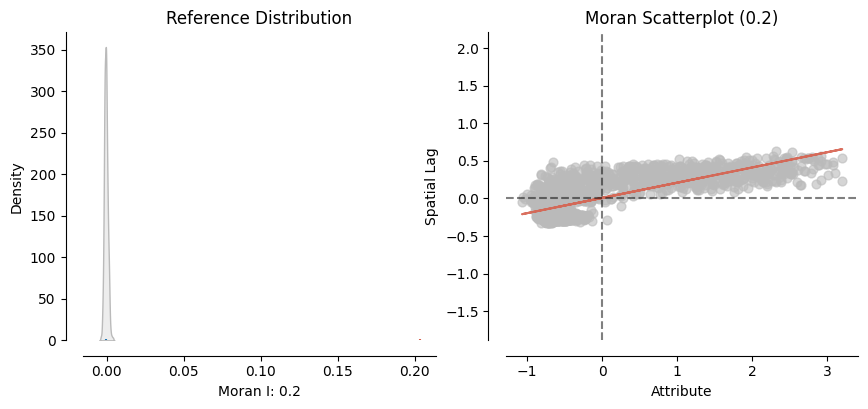

In [10]:
import geopandas as gpd
import requests
from libpysal.weights import DistanceBand

# Create a DistanceBand weights matrix
w_dist20km = DistanceBand.from_dataframe(gdf, 20000, binary=False)

### First major plot
import esda
from splot.esda import plot_moran

mi = esda.Moran(gdf['slope_mean'], w_dist20km)
plot_moran(mi);

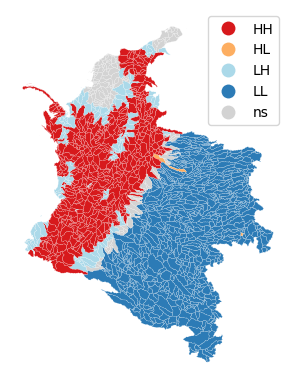

In [11]:
## Second major plot 
from splot.esda import lisa_cluster

lisa = esda.Moran_Local(gdf["slope_mean"], w_dist20km)
lisa_cluster(lisa, gdf)

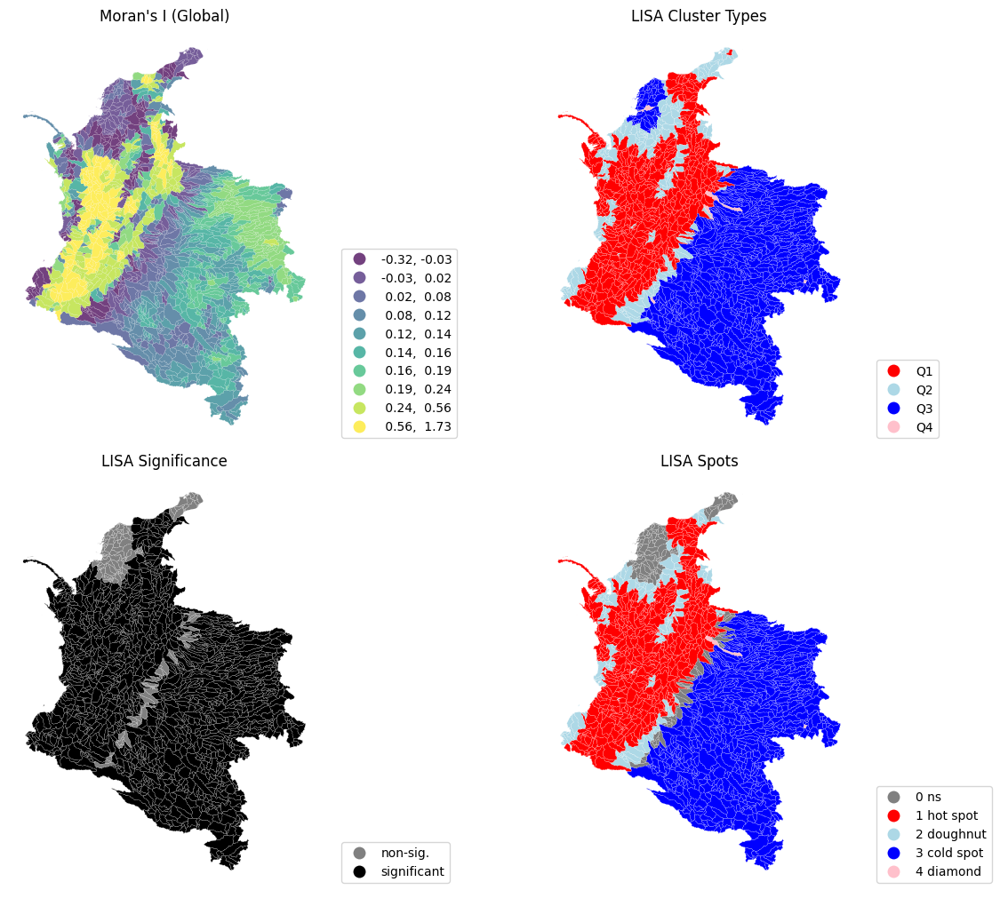

In [17]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

f, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 10), constrained_layout=True)
axs = axs.flatten()

gdf["Is"] = lisa.Is

# Subplot 1 #
ax = axs[0]
gdf.plot(
    column='Is', cmap='viridis', scheme='quantiles', k=10,
    edgecolor='white', linewidth=0.1, alpha=0.75,
    ax=ax, legend=True,
    legend_kwds={'loc': 'lower left', 'bbox_to_anchor': (1.05, 0)}
)
ax.set_title("Moran's I (Global)")
ax.set_aspect('equal')
ax.set_axis_off()

# Subplot 2 #
ax = axs[1]
q_labels = ['Q1', 'Q2', 'Q3', 'Q4']
labels = [q_labels[i - 1] for i in lisa.q]
gdf["regime"] = labels  # Add this line

hmap = ListedColormap(['red', 'lightblue', 'blue', 'pink'])
gdf.assign(cl=labels).plot(
    column='cl', categorical=True, cmap=hmap, linewidth=0.1,
    ax=ax, edgecolor='white', legend=True,
    legend_kwds={'loc': 'lower left', 'bbox_to_anchor': (1.05, 0)}
)
ax.set_title("LISA Cluster Types")
ax.set_aspect('equal')
ax.set_axis_off()

# Subplot 3 #
ax = axs[2]
sig = 1 * (lisa.p_sim < 0.05)
labels = ['non-sig.', 'significant']
labels = [labels[i] for i in sig]
hmap = ListedColormap(['grey', 'black'])
gdf.assign(cl=labels).plot(
    column='cl', categorical=True, cmap=hmap, linewidth=0.1,
    ax=ax, edgecolor='white', legend=True,
    legend_kwds={'loc': 'lower left', 'bbox_to_anchor': (1.05, 0)}
)
ax.set_title("LISA Significance")
ax.set_aspect('equal')
ax.set_axis_off()

# Subplot 4 #
ax = axs[3]
hotspot = 1 * (sig * (lisa.q == 1))
coldspot = 3 * (sig * (lisa.q == 3))
doughnut = 2 * (sig * (lisa.q == 2))
diamond = 4 * (sig * (lisa.q == 4))
spots = hotspot + coldspot + doughnut + diamond
spot_labels = ['0 ns', '1 hot spot', '2 doughnut', '3 cold spot', '4 diamond']
labels = [spot_labels[i] for i in spots]
hmap = ListedColormap(['grey', 'red', 'lightblue', 'blue', 'pink'])
gdf.assign(cl=labels).plot(
                    column='cl', categorical=True, cmap=hmap, linewidth=0.1,
                    ax=ax, edgecolor='white', legend=True,
                    legend_kwds={'loc': 'lower left', 'bbox_to_anchor': (1.05, 0)}
                )
ax.set_title("LISA Spots")
ax.set_aspect('equal')
ax.set_axis_off()

plt.show()

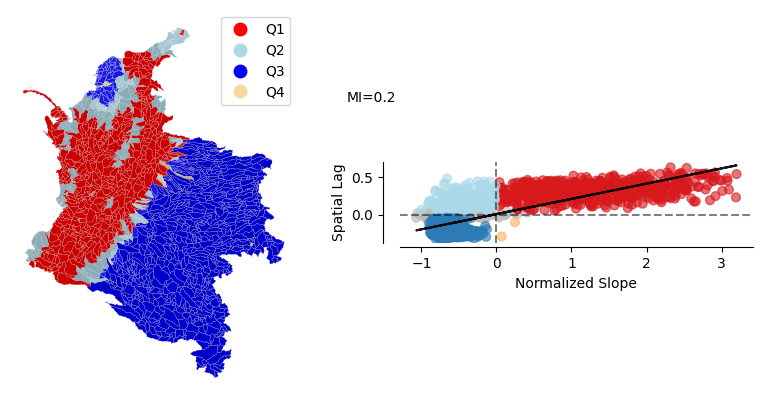

In [21]:
from matplotlib_scalebar.scalebar import ScaleBar
from splot.esda import moran_scatterplot


f, ax = plt.subplots(nrows=1, ncols=2,figsize=(10,5))
axs = ax.flatten()

q_labels = ['Q1', 'Q2', 'Q3', 'Q4']
labels1 = [q_labels[i-1] for i in lisa.q]
hmap = ListedColormap([ 'red', 'lightblue', 'blue', '#FAD7A0'])
gdf.assign(cl=labels1).plot(column='cl', categorical=True,k=2, cmap=hmap, linewidth=0.1, ax=ax[0],edgecolor='white', legend=True)

sig = 1 * (lisa.p_sim < 0.05)
hmap = ListedColormap(['grey','black'])
labels2 = ['non-sig.', 'significant'] 
labels2 = [labels2[i] for i in sig]
gdf.assign(cl=labels2).plot(column='cl', categorical=True,k=2, cmap=hmap, linewidth=0.1, ax=ax[0],edgecolor='white', alpha=0.20)
ax[0].set_aspect('equal')
ax[0].set_axis_off()

moran_scatterplot(lisa, p=0.05,ax=ax[1])
ax[1].text(-2,1.5,f'MI={round(mi.I, 2)}')
ax[1].set_xlabel("Normalized Slope")
ax[1].set_title('');

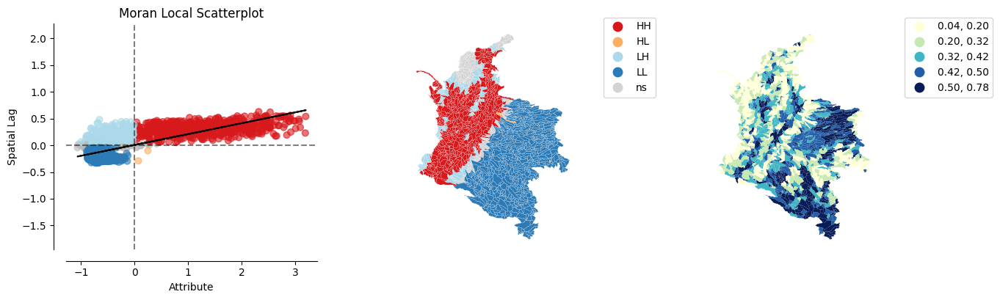

In [23]:
## Fifth major plot 
from splot.esda import plot_local_autocorrelation

plot_local_autocorrelation(lisa, gdf, 'hypsometri');

In [22]:
gdf['elev_mean'].describe()

count    1700.000000
mean      499.732657
std       697.482451
min         1.067482
25%       123.013921
50%       194.027228
75%       451.617317
max      3478.903411
Name: elev_mean, dtype: float64

In [ ]:
import numpy as np

distance = [5000, 10000]
variable = 'elev_mean'  # Specify the variable you want to use

# Create a single figure with subplots for different distances
f, ax = plt.subplots(nrows=1, ncols=len(distance), figsize=(18, 6), sharex=True, sharey=True) # Ajustado figsize y sharex/sharey para consistencia

for i, dx in enumerate(distance):
    # Create a DistanceBand weights matrix for the specified distance
    try:
        w_dist = DistanceBand.from_dataframe(gdf, dx, binary=True) # Binary=True es común para Moran I
        
        # Identify islands (disconnected components)
        islands = [k for k, v in w_dist.neighbors.items() if len(v) == 0]

        # Filter out islands from the GeoDataFrame
        if islands:
            cat_filtered = gdf.drop(index=islands)
            w_dist_filtered = DistanceBand.from_dataframe(cat_filtered, dx, binary=True)
        else:
            cat_filtered = gdf
            w_dist_filtered = w_dist
        
        # Normalizar la matriz de pesos por fila (standard row-standardization)
        w_dist_filtered.transform = 'R'

    except ValueError as e:
        print(f"Error al crear matriz de pesos para {dx/1000}km: {e}. Saltando este panel.")
        ax[i].set_title(f'Distance: {dx/1000}km (No data/neighbors)')
        ax[i].set_xlim([-2.5, 2.5])
        ax[i].set_ylim([-2.5, 2.5])
        ax[i].axvline(0, color='gray', linestyle='--')
        ax[i].axhline(0, color='gray', linestyle='--')
        continue # Skip to the next iteration

    # Asegurarse de que el número de observaciones sea suficiente
    if len(cat_filtered) < 2:
        print(f"No hay suficientes observaciones para {dx/1000}km después de filtrar islas. Saltando este panel.")
        ax[i].set_title(f'Distance: {dx/1000}km (Too few obs)')
        ax[i].set_xlim([-2.5, 2.5])
        ax[i].set_ylim([-2.5, 2.5])
        ax[i].axvline(0, color='gray', linestyle='--')
        ax[i].axhline(0, color='gray', linestyle='--')
        continue

    # --- CÁLCULOS PARA LA GRÁFICA DE DISPERSIÓN DE MORAN Y LA LÍNEA ---
    # 1. Estandarizar la variable (Z-scores)
    z = (cat_filtered[variable] - cat_filtered[variable].mean()) / cat_filtered[variable].std()
    
    # 2. Calcular el rezago espacial (WZ)
    w_z = w_dist_filtered.sparse @ z.values

    # 3. Calcular el Índice de Moran Global (MI)
    numerator = np.sum(z * w_z)
    denominator = np.sum(z**2)
    mi_global = numerator / denominator

    # 4. Calcular LISA para obtener los p-valores y determinar la significancia
    lisa = esda.Moran_Local(cat_filtered[variable], w_dist_filtered)
    
    # 5. Colorear los puntos basándose en LISA (cuadrante Y significancia p<=0.05)
    # Extraído de la lógica interna de splot.esda.moran_scatterplot
    p_threshold = 0.05 # Umbral de significancia
    
    # Asignar colores según los cuadrantes y la significancia
    point_colors = np.array(['gray'] * len(z), dtype=object) 
    
    # Cuadrante HH (Alto-Alto) - Rojo
    hh_idx = (z >= 0) & (w_z >= 0) & (lisa.p_sim <= p_threshold)
    point_colors[hh_idx] = 'red'

    # Cuadrante LL (Bajo-Bajo) - Azul Oscuro
    ll_idx = (z < 0) & (w_z < 0) & (lisa.p_sim <= p_threshold)
    point_colors[ll_idx] = 'darkblue'

    # Cuadrante HL (Alto-Bajo) - Naranja
    hl_idx = (z >= 0) & (w_z < 0) & (lisa.p_sim <= p_threshold)
    point_colors[hl_idx] = 'darkorange'

    # Cuadrante LH (Bajo-Alto) - Azul Claro
    lh_idx = (z < 0) & (w_z >= 0) & (lisa.p_sim <= p_threshold)
    point_colors[lh_idx] = 'lightskyblue'

    # Los puntos no significativos (grises) ya están asignados por defecto si no cumplen las condiciones anteriores.

    # --- 6. Graficar los puntos (manualmente) ---
    ax[i].scatter(z, w_z, s=20, c=point_colors, alpha=0.6)
    
    # --- 7. Dibujar la línea de regresión MANUALMENTE (la única línea negra) ---
    x_line = np.array([-2.5, 2.5]) 
    y_line = mi_global * x_line
    ax[i].plot(x_line, y_line, color='k', linestyle='-', linewidth=2)

    # --- El resto de tu código para etiquetas y formato ---
    ax[i].text(-2, 1.5, f'MI={mi_global:.2f}', fontsize=12, horizontalalignment='left', verticalalignment='top')
    ax[i].set_xlabel('Pendiente normalizada', fontsize=12)
    if i == 0:
        ax[i].set_ylabel("Autoregresión espacial", fontsize=12)
    else:
        ax[i].set_ylabel("")
    ax[i].set_title(f'Distance: {dx/1000}km')

    # Set consistent limits and aspect for the scatterplot
    ax[i].set_xlim([-2.5, 2.5])
    ax[i].set_ylim([-2.5, 2.5])
    ax[i].set_aspect('equal', adjustable='box') # CRUCIAL para una visualización correcta de la pendiente

    # Añadimos líneas de referencia
    ax[i].axvline(0, color='gray', linestyle='--', linewidth=0.8)
    ax[i].axhline(0, color='gray', linestyle='--', linewidth=0.8)

# Ajustar el layout y guardar la figura
plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Ajusta el layout para que el título principal no se solape

## 3. Regresión Ponderada Geográficamente (GWR)

Los Modelos de Regresión Espacial Ponderados (GWR, por sus siglas en inglés) constituyen una herramienta estadística avanzada desarrollada para analizar la heterogeneidad espacial de relaciones entre una variable respuesta y un conjunto de variables predictoras en un contexto geográfico (Brunsdon 1996, Fotheringham 2000, Fotheringham 2009). A diferencia de los modelos de regresión tradicional, que asumen que la relación entre las variables es constante en todo el espacio de estudio, los modelos GWR permiten que los coeficientes varíen de manera local. Esto se logra ajustando un modelo de regresión independiente en cada ubicación geográfica, utilizando datos cercanos para ponderar las estimaciones (Brunsdon 1996). Esta metodología es particularmente valiosa para el análisis de susceptibilidad a movimientos en masa, ya que permite representar cómo las diferentes condiciones del terreno afectan la susceptibilidad de manera no uniforme a lo largo de un área.


In [34]:
import numpy as np
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW
from matplotlib_scalebar.scalebar import ScaleBar
from mpl_toolkits.axes_grid1 import make_axes_locatable
from tabulate import tabulate
np.float = float 

In [35]:
gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [36]:
gdf.to_crs('EPSG:3857',inplace = True)

In [37]:
gdf.head()

,HYBAS_ID,SUB_AREA,elev_mean,slope_mean,slope_p95,Historical_TP_mean_1985-2005,Historical_TP_median_1985-2005,Historical_TP_max_1985-2005,Historical_TP_p95_1985-2005,Historical_TP_min_1985-2005,...,SSP5 8.5_R95p_2020-2040,SSP5 8.5_R95p_2040-2060,SSP5 8.5_R95p_2060-2080,SSP5 8.5_R95p_2080-2100,PGA,suceptibility,hypsometri,landslide_count,landslide_density_km2,geometry
0,6080078040,346.9,42.340542,4.018225,17.889779,2404.761230,2428.441895,2910.226807,2820.092285,1925.344238,...,537.603149,554.961548,577.209412,615.566711,0.296658,1.487805,0.084118,2.0,0.005765,"POLYGON ((-8591617.268 886541.537, -8591463.87..."
1,6080078010,476.8,217.260793,9.887934,28.253847,2286.554443,2310.492188,2761.467773,2673.521973,1834.826172,...,508.305176,523.932190,545.238464,580.546631,0.316517,2.656646,0.143024,2.0,0.004195,"POLYGON ((-8598068.78 907858.497, -8597575.374..."
2,6080081280,442.1,71.756217,5.545883,17.810074,3264.778320,3312.593018,3909.392578,3782.051758,2658.418945,...,738.260132,763.765747,806.980835,859.036743,0.391662,1.899497,0.159063,0.0,0.000000,"POLYGON ((-8604140.557 867078.473, -8603367.69..."
3,6080081290,448.4,5.688645,2.044135,4.663393,3130.611816,3164.358887,3787.472412,3670.357178,2516.664795,...,709.090942,735.118896,769.690979,820.508850,0.365224,1.136513,0.068117,1.0,0.002230,"POLYGON ((-8581868.265 862176.15, -8581404.638..."
4,6080084300,847.4,131.561166,7.976072,20.737652,3264.778320,3312.593018,3909.392578,3782.051758,2658.418945,...,738.260132,763.765747,806.980835,859.036743,0.453975,2.301162,0.125951,1.0,0.001180,"POLYGON ((-8625868.811 845712.519, -8625829.59..."


In [40]:
# Calculate landslide frequency as landslides per unit area
gdf['y_log'] = np.log(gdf['landslide_count'] + 1)
g_y = gdf['y_log'].values.reshape(-1, 1)

# Extract centroids
centroids = gdf.geometry.centroid

# Extract X and Y coordinates from centroids
X = centroids.x
Y = centroids.y

# Create the coordinate list
g_coords = list(zip(X, Y))

# Select optimal bandwidth for GWR model using coordinates, response, and predictors
## variables = ['elev_mean', 'rel_mean',"rainfallAnnual_mean"]

variables = ['Historical_CWD_1985-2005', 
             'Historical_RX5day_1985-2005',
             'Historical_R95p_1985-2005',
             'elev_mean',
             'slope_mean',
             'PGA',
             'hypsometri']

scaler = StandardScaler()
g_X_num = scaler.fit_transform(gdf[variables])

In [41]:
# Fit GWR model using the current bandwidth
model = GWR(g_coords, g_y, g_X_num, 100, kernel='gaussian',fixed=True).fit()
model.summary()

LinAlgError: Matrix is singular.

#### Best weights.

In [10]:
gwr_selector = Sel_BW(g_coords, g_y, g_X_num, multi=True, kernel='bisquare', fixed=True)
selector = gwr_selector.search()
print(selector)

Backfitting:   0%|          | 0/200 [00:00<?, ?it/s]

[ 337579.45 3732859.   3732836.75 3732814.51  232102.67 3732850.51
   64469.16  403797.27]


In [16]:
gwr_selector

In [18]:
type(gwr_selector)

mgwr.sel_bw.Sel_BW

In [29]:
gwr_selector.bw_init

np.float64(181168.26)

#### 

In [8]:
import pickle

# Load from file
with open('gwr_selector.pkl', 'rb') as f:
    cache_selector = pickle.load(f)

In [9]:
cache_selector

In [ ]:
# Fit the MGWR model using the selected bandwidths
model = MGWR(g_coords, g_y, g_X_num, cache_selector, kernel='bisquare', fixed=True).fit()
model.summary()

In [11]:
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
import os

# Create folder if it doesn't exist
os.makedirs('gwr_plots', exist_ok=True)

# Define your 7 variables with appropriate colors
variables = ['Historical_CWD_1985-2005',     # rain
             'Historical_RX5day_1985-2005',  # rain
             'Historical_R95p_1985-2005',    # rain
             'elev_mean',                     # elevation
             'slope_mean',                    # slope 
             'PGA',                          # peak ground acceleration
             'hypsometri']                   # hypsometric

# Define appropriate colormaps for each variable
colormaps = ['Blues',        # rain - blue tones
             'Blues_r',      # rain - reverse blue (dark = high)
             'BuPu',         # rain - blue to purple
             'terrain',      # elevation - terrain colors
             'Oranges',      # slope - orange for steepness
             'Reds',         # PGA - red for seismic intensity
             'viridis']      # hypsometric - scientific colormap

# Extract local coefficients
local_params = model.params

# Transform to WGS84 for plotting
data_clean = gdf.to_crs(epsg=4326)

# Create individual plots for each variable
for i, param_name in enumerate(variables):
    fig, ax = plt.subplots(figsize=(10, 8))
    
    # Add coefficient data
    data_clean[f'coef_{param_name}'] = local_params[:, i+1]  # +1 to skip intercept
    
    # Plot with specific colormap for each variable
    data_clean.plot(column=f'coef_{param_name}', ax=ax, 
                   cmap=colormaps[i], legend=True)
    
    # Add scalebar
    scalebar = ScaleBar(111319.49, "m", location='lower right', 
                       scale_loc='top', length_fraction=0.25, 
                       font_properties={"size": 10},
                       rotation='horizontal-only')
    ax.add_artist(scalebar)
    
    # Simple title
    ax.set_title(f'GWR Coefficient: {param_name}', fontsize=14)
    
    plt.tight_layout()
    plt.savefig(r'C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\Graficas\Entrega 2\GWR\{param_name}_coefficient_new.png'.format(param_name = param_name), dpi=300, bbox_inches='tight')  # LINE 1: Save figure
    plt.close()  # LINE 2: Close figure to free memory

### 3.1 Evaluate climate change

CLIMATE SCENARIO LANDSLIDE ANALYSIS
Created 13 climate scenarios
Training GWR model with historical data...


Inference:   0%|          | 0/1 [00:00<?, ?it/s]

Model type                                                         Gaussian
Number of observations:                                                1700
Number of covariates:                                                     8

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           1568.450
Log-likelihood:                                                   -2343.736
AIC:                                                               4703.472
AICc:                                                              4705.579
BIC:                                                             -11017.295
R2:                                                                   0.518
Adj. R2:                                                              0.516

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

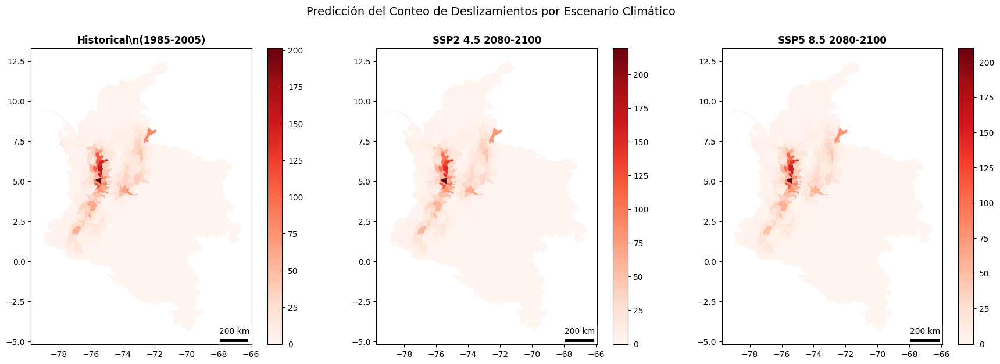

Climate scenario analysis functions ready!
\nTo run the analysis:
gdf_results, predictions, model, scenarios, scaler = run_climate_scenario_analysis(gdf)
plot_scenario_comparison(gdf_results)
plot_change_maps(gdf_results)


In [25]:
import numpy as np
import pandas as pd
from mgwr.gwr import GWR, MGWR
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
from sklearn.preprocessing import StandardScaler
import geopandas as gpd
from pathlib import Path
import pickle
import numpy as np
import pandas as pd
from mgwr.gwr import GWR

from tqdm import TqdmExperimentalWarning
import warnings
warnings.filterwarnings("ignore", category=TqdmExperimentalWarning)
from tqdm.autonotebook import tqdm

# Load from file
with open('gwr_selector.pkl', 'rb') as f:
    gwr_selector = pickle.load(f)

def restore_original_columns(gdf, mapping_path):
    """
    Restore original column names using the mapping dictionary.
    """
    # Load mapping
    with open(mapping_path, 'r') as f:
        mapping = json.load(f)
    
    # Create reverse mapping (encoded_name -> original_name)
    gdf_restored = gdf.copy()
    
    # Rename columns back to original names
    for encoded_name, original_name in mapping.items():
        if encoded_name in gdf_restored.columns:
            gdf_restored = gdf_restored.rename(columns={encoded_name: original_name})
    
    return gdf_restored

def load_shapefile_with_original_names(shapefile_path, mapping_path=None):
    """
    Load shapefile and restore original column names.
    """
    # Load shapefile
    gdf = gpd.read_file(shapefile_path)
    
    # Determine mapping path if not provided
    if mapping_path is None:
        mapping_path = str(Path(shapefile_path).with_suffix('.json'))
    
    # Restore original column names
    gdf_restored = restore_original_columns(gdf, mapping_path)
    
    return gdf_restored

# Later, load back with original names

gdf = load_shapefile_with_original_names(r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\GEE_Landslide_Pipelines\main_training_set.shp")
gdf.to_crs('EPSG:3857',inplace = True)



def create_scenario_dictionary(gdf):
    """
    Create dictionary with climate scenarios organized by time period and SSP
    """
    scenarios = {}
    
    # Historical baseline (1985-2005)
    scenarios['Historical'] = {
        'CWD': 'Historical_CWD_1985-2005',
        'RX5day': 'Historical_RX5day_1985-2005', 
        'R95p': 'Historical_R95p_1985-2005'
    }
    
    # SSP2 4.5 scenarios
    time_periods = ['2020-2040', '2040-2060', '2060-2080', '2080-2100']
    
    for period in time_periods:
        scenarios[f'SSP2_4.5_{period}'] = {
            'CWD': f'SSP2 4.5_CWD_{period}',
            'RX5day': f'SSP2 4.5_RX5day_{period}',
            'R95p': f'SSP2 4.5_R95p_{period}'
        }
    
    # SSP3 7.0 scenarios  
    for period in time_periods:
        scenarios[f'SSP3_7.0_{period}'] = {
            'CWD': f'SSP3 7.0_CWD_{period}',
            'RX5day': f'SSP3 7.0_RX5day_{period}',
            'R95p': f'SSP3 7.0_R95p_{period}'
        }
    
    # SSP5 8.5 scenarios
    for period in time_periods:
        scenarios[f'SSP5_8.5_{period}'] = {
            'CWD': f'SSP5 8.5_CWD_{period}',
            'RX5day': f'SSP5 8.5_RX5day_{period}',
            'R95p': f'SSP5 8.5_R95p_{period}'
        }
    
    return scenarios

def train_historical_gwr(gdf, scenario_dict):
    """
    Train GWR model using historical climate data - matches your exact workflow
    """
    print("Training GWR model with historical data...")
    
    # Prepare target variable (log-transformed landslide count)
    gdf['y_log'] = np.log(gdf['landslide_count'] + 1)
    g_y = gdf['y_log'].values.reshape(-1, 1)
    
    # Extract centroids (same as your approach)
    centroids = gdf.geometry.centroid
    X = centroids.x
    Y = centroids.y
    g_coords = list(zip(X, Y))
    
    # Prepare historical variables (exact same order as yours)
    variables = ['Historical_CWD_1985-2005', 
                 'Historical_RX5day_1985-2005',
                 'Historical_R95p_1985-2005',
                 'elev_mean',
                 'slope_mean',
                 'PGA',
                 'hypsometri']
    
    # Apply StandardScaler (same as your approach)
    scaler = StandardScaler()
    g_X_num = scaler.fit_transform(gdf[variables])
    
    # Train GWR model (exact same parameters as yours)
    ## model = GWR(g_coords, g_y, g_X_num, 100, kernel='gaussian', fixed=False).fit()

    # Fit the MGWR model using the selected bandwidths
    model = MGWR(g_coords, g_y, g_X_num, gwr_selector, kernel='bisquare', fixed=True).fit()
    model.summary()
    
    print("Historical GWR model trained successfully!")
    ## model.summary()
    
    return model, variables, scaler

def predict_scenario(model, gdf, scenario_dict, scenario_name, scaler):
    """
    Predict landslide count for a specific climate scenario
    SIMPLE: Same locations, just swap climate variables, keep same coefficients!
    """
    
    # For future scenarios: new climate + same static variables
    climate_vars = list(scenario_dict[scenario_name].values())  # New climate data
    static_vars = ['elev_mean', 'slope_mean', 'PGA', 'hypsometri']  # Same static data
    variables = climate_vars + static_vars
    
    # TRICK: Create temporary dataframe with historical column names for scaler
    temp_gdf = gdf[variables].copy()

    # Rename climate columns to match what scaler expects (historical names)
    historical_climate_names = ['Historical_CWD_1985-2005', 
                               'Historical_RX5day_1985-2005',
                               'Historical_R95p_1985-2005']
    
    # Create mapping from future scenario names to historical names
    rename_mapping = {}
    for i, future_name in enumerate(climate_vars):
        rename_mapping[future_name] = historical_climate_names[i]
    
    # Rename columns temporarily
    temp_gdf = temp_gdf.rename(columns=rename_mapping)
    
    # Now scaler will be happy because it sees the same column names as training
    expected_column_order = ['Historical_CWD_1985-2005', 
                            'Historical_RX5day_1985-2005',
                            'Historical_R95p_1985-2005',
                            'elev_mean',
                            'slope_mean',
                            'PGA',
                            'hypsometri']
    
    # Scale the data using the fitted scaler
    X_scenario = scaler.transform(temp_gdf[expected_column_order])
    
    # Add intercept column (GWR expects intercept as first column)
    X_scenario_with_intercept = np.column_stack([np.ones(X_scenario.shape[0]), X_scenario])
    
    # Use the SAME coefficients from the trained model (same locations!)
    # No distance calculations needed - just apply learned coefficients to new climate data
    predictions = np.sum(model.params * X_scenario_with_intercept, axis=1)
    
    return predictions

def run_climate_scenario_analysis(gdf):
    """
    Complete climate scenario analysis workflow - matches your exact training approach
    """
    print("="*60)
    print("CLIMATE SCENARIO LANDSLIDE ANALYSIS")
    print("="*60)
    
    # Step 1: Create scenario dictionary
    scenarios = create_scenario_dictionary(gdf)

    
    print(f"Created {len(scenarios)} climate scenarios")
    
    # Step 2: Train historical model (using your exact workflow)
    model, variables, scaler = train_historical_gwr(gdf, scenarios)
    
    # Step 3: Store all predictions
    predictions_dict = {}
    predictions_dict['Historical'] = model.predy.flatten()  # Historical predictions from training
    
    # Step 4: Predict for all future scenarios
    print("\\nPredicting for future scenarios...")
    
    for scenario_name in scenarios.keys():
        if scenario_name != 'Historical':
            print(f"  Predicting {scenario_name}...")
            pred = predict_scenario(model, gdf, scenarios, scenario_name, scaler)
            predictions_dict[scenario_name] = pred
    
    # Step 5: Add predictions to geodataframe
    for scenario_name, predictions in predictions_dict.items():
        gdf[f'pred_log_{scenario_name}'] = predictions
        # Also add back-transformed predictions (exp(pred) - 1)
        gdf[f'pred_count_{scenario_name}'] = np.exp(predictions) - 1
    
    # Step 6: Calculate changes from historical
    historical_pred = predictions_dict['Historical']
    
    for scenario_name, predictions in predictions_dict.items():

        print(f"Escenario {scenario_name } :\n")
        if scenario_name != 'Historical':
            ## change = predictions - historical_pred
            # Back-transform for count change
            count_change = (predictions - historical_pred)
            percent_change = (count_change / np.exp(historical_pred) ) * 100
            print(count_change)
            
            ## gdf[f'change_log_{scenario_name}'] = change
            gdf[f'change_count_{scenario_name}'] = count_change
            gdf[f'pct_change_{scenario_name}'] = percent_change
    
    print("\\nAnalysis complete!")
    print(f"Added prediction columns for {len(predictions_dict)} scenarios")
    print("Columns include:")
    print("  - pred_log_*: Log-scale predictions")
    print("  - pred_count_*: Back-transformed landslide count predictions")
    print("  - change_count_*: Change in landslide count from historical")
    print("  - pct_change_*: Percentage change from historical")
    
    return gdf, predictions_dict, model, scenarios, scaler

def plot_scenario_comparison(gdf, scenarios_to_plot=['SSP2_4.5_2080-2100', 'SSP5_8.5_2080-2100'], save_path=None):
    """
    Plot comparison of different climate scenarios - landslide count predictions
    """
    # Transform to WGS84 for plotting
    gdf_plot = gdf.to_crs(epsg=4326)
    
    n_scenarios = len(scenarios_to_plot) + 1  # +1 for historical
    fig, axes = plt.subplots(1, n_scenarios, figsize=(6*n_scenarios, 6))
    
    if n_scenarios == 1:
        axes = [axes]
    
    # Plot historical
    ax = axes[0]
    gdf_plot.plot(column='pred_count_Historical', ax=ax, cmap='Reds', legend=True)
    ax.set_title('Historical\\n(1985-2005)', fontsize=12, fontweight='bold')
    scalebar = ScaleBar(111319.49, "m", location='lower right',
                       scale_loc='top', length_fraction=0.25,
                       font_properties={"size": 10}, rotation='horizontal-only')
    ax.add_artist(scalebar)
    
    # Plot future scenarios
    for i, scenario in enumerate(scenarios_to_plot, 1):
        ax = axes[i]
        gdf_plot.plot(column=f'pred_count_{scenario}', ax=ax, cmap='Reds', legend=True)
        ax.set_title(f'{scenario.replace("_", " ")}', fontsize=12, fontweight='bold')
        scalebar = ScaleBar(111319.49, "m", location='lower right',
                           scale_loc='top', length_fraction=0.25,
                           font_properties={"size": 10}, rotation='horizontal-only')
        ax.add_artist(scalebar)
    
    plt.suptitle('Predicción del Conteo de Deslizamientos por Escenario Climático', fontsize=14, y=1.02)
    plt.tight_layout()
    
    # Save if path provided
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Plot saved to: {save_path}")
    
    plt.show()



# Usage example:
gdf_results, predictions, model, scenarios, scaler = run_climate_scenario_analysis(gdf)
plot_scenario_comparison(gdf_results,save_path= r"C:\Users\Usuario\Documents\AI\Semestre 1\GeoSpatial\Graficas\Entrega 2\Comparasion_escenarios_BEST_MODEL.png")

print("Climate scenario analysis functions ready!")
print("\\nTo run the analysis:")
print("gdf_results, predictions, model, scenarios, scaler = run_climate_scenario_analysis(gdf)")
print("plot_scenario_comparison(gdf_results)")
print("plot_change_maps(gdf_results)")

In [30]:
gdf_results.filter(like = 'pct_change').max()

pct_change_SSP2_4.5_2020-2040    35.583035
pct_change_SSP2_4.5_2040-2060    25.564861
pct_change_SSP2_4.5_2060-2080    50.029445
pct_change_SSP2_4.5_2080-2100    39.865248
pct_change_SSP3_7.0_2020-2040    13.281201
pct_change_SSP3_7.0_2040-2060    47.106749
pct_change_SSP3_7.0_2060-2080    36.095938
pct_change_SSP3_7.0_2080-2100    15.681736
pct_change_SSP5_8.5_2020-2040    24.810274
pct_change_SSP5_8.5_2040-2060    41.094334
pct_change_SSP5_8.5_2060-2080    12.130904
pct_change_SSP5_8.5_2080-2100    30.431792
dtype: float64

In [41]:
scenarios['SSP2_4.5_2020-2040'].values() #.keys()

dict_values(['SSP2 4.5_CWD_2020-2040', 'SSP2 4.5_RX5day_2020-2040', 'SSP2 4.5_R95p_2020-2040'])

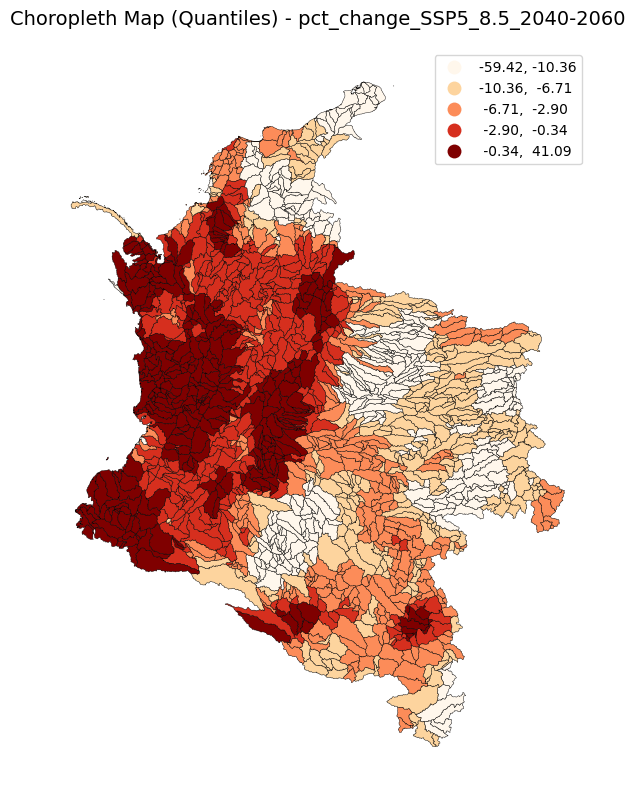

In [31]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load your GeoDataFrame (example: gdf)
# Make sure the column name is valid or assign an alias
column = 'pct_change_SSP5_8.5_2040-2060'
# gdf_result = gdf_result.dropna(subset=[column])  # Drop NaNs to avoid plotting issues

# Plot using quantiles
fig, ax = plt.subplots(figsize=(10, 8))

gdf_results.plot(
    column=column,
    cmap='OrRd',
    scheme='quantiles',      # <-- key step
    k = 5,                     # number of quantile classes
    legend=True,
    edgecolor='black',
    linewidth=0.3,
    ax=ax
)

plt.title(f'Choropleth Map (Quantiles) - {column}', fontsize=14)
plt.axis('off')
plt.tight_layout()
plt.show()


In [35]:
model

In [27]:
gdf_results.filter(like = "pred_count")  #.sub(gdf_results['pred_count_Historical'],axis = 0).max()

,pred_count_Historical,pred_count_SSP2_4.5_2020-2040,pred_count_SSP2_4.5_2040-2060,pred_count_SSP2_4.5_2060-2080,pred_count_SSP2_4.5_2080-2100,pred_count_SSP3_7.0_2020-2040,pred_count_SSP3_7.0_2040-2060,pred_count_SSP3_7.0_2060-2080,pred_count_SSP3_7.0_2080-2100,pred_count_SSP5_8.5_2020-2040,pred_count_SSP5_8.5_2040-2060,pred_count_SSP5_8.5_2060-2080,pred_count_SSP5_8.5_2080-2100
0,1.391130,1.221661,1.452010,1.409781,1.597693,1.399659,1.451057,1.420275,1.433725,1.304675,1.370976,1.228050,1.177754
1,1.091778,1.008586,1.181239,1.151274,1.280406,1.154204,1.196164,1.138898,1.165252,1.050336,1.089934,0.996470,0.961056
2,1.147035,1.224430,1.483304,1.299172,1.425351,1.446570,1.255737,1.528453,1.450786,1.313841,1.316791,1.141825,1.122301
3,2.517455,2.302191,2.707322,2.573915,3.051949,2.578564,2.481323,2.859208,2.661659,2.486106,2.639764,2.238044,2.203805
4,1.557004,1.649208,1.957524,1.738257,1.888531,1.913758,1.686506,2.011315,1.918844,1.755692,1.759224,1.550872,1.527646
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1695,0.070371,0.486145,0.325987,0.584884,0.569405,0.071802,0.591767,0.394591,-0.057271,0.348138,0.428407,0.093124,0.335962
1696,0.231978,0.877849,0.688051,1.281819,1.013254,0.345488,1.201119,0.921901,0.295784,0.672431,1.043970,0.430567,0.792361
1697,0.102644,0.423101,0.197487,0.592271,0.413099,0.083439,0.612124,0.477072,0.155879,0.301414,0.519104,0.080052,0.355541
1698,8.724993,10.177899,8.981584,10.396571,9.300065,8.955251,9.610783,9.910727,8.458554,10.097557,9.452762,8.065464,8.781479


In [9]:
predictions

{'Historical': array([0.9473716 , 1.08641473, 0.98986602, ..., 1.03285355, 1.09990179,
        0.98721811], shape=(1700,)),
 'SSP2_4.5_2020-2040': array([1.04454533, 1.16249792, 1.11439772, ..., 1.10343094, 1.24106553,
        1.05172306], shape=(1700,)),
 'SSP2_4.5_2040-2060': array([1.08061876, 1.19880901, 1.17312064, ..., 1.22279142, 1.32282965,
        1.08485602], shape=(1700,)),
 'SSP2_4.5_2060-2080': array([1.09757585, 1.20506214, 1.17633246, ..., 1.16659108, 1.32903798,
        1.10466028], shape=(1700,)),
 'SSP2_4.5_2080-2100': array([1.06343553, 1.17972353, 1.18703273, ..., 1.32594369, 1.44126261,
        1.13511369], shape=(1700,)),
 'SSP3_7.0_2020-2040': array([1.02854334, 1.15278812, 1.11716277, ..., 1.1671331 , 1.24172715,
        1.06094055], shape=(1700,)),
 'SSP3_7.0_2040-2060': array([1.04545219, 1.16920262, 1.16029023, ..., 1.08659115, 1.27935034,
        1.0880831 ], shape=(1700,)),
 'SSP3_7.0_2060-2080': array([1.04392242, 1.16154207, 1.14562405, ..., 1.2553023 , 1

## 4. ICAR

# GEE

In [1]:
# Google Earth Engine CMIP6 Analysis - Setup and Usage Guide
# This notebook demonstrates how to migrate your local CMIP6 analysis to Google Earth Engine

# ================================
# 1. INSTALLATION AND SETUP
# ================================

# First, install required packages
"""
pip install earthengine-api
pip install geemap
pip install pandas numpy

# Authenticate Google Earth Engine (run once)
earthengine authenticate

# If using Jupyter notebooks, also install:
pip install ipywidgets
"""

import ee
import geemap
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt

In [2]:


# ================================
# 2. INITIALIZE EARTH ENGINE
# ================================

# Initialize Earth Engine
try:
    ee.Initialize()
    print("✅ Earth Engine initialized successfully")
except Exception as e:
    print(f"❌ Error initializing Earth Engine: {e}")
    print("Please run: earthengine authenticate")

❌ Error initializing Earth Engine: Please authorize access to your Earth Engine account by running

earthengine authenticate

in your command line, or ee.Authenticate() in Python, and then retry.
Please run: earthengine authenticate


In [4]:
# Trigger authentication
ee.Authenticate()

# Initialize after authentication
ee.Initialize()

Enter verification code:  4/1AUJR-x6q3H3w0W1YecWoF-Ki6vdCbFQaMVCAPeRmDTbizF2LNZLgHfqXw54



Successfully saved authorization token.


In [7]:
modelos.Modelos.unique()

array(['EC-Earth3-Veg-LR', 'GFDL-ESM4', 'MIROC6', 'MPI-ESM1-2-HR',
       'MPI-ESM1-2-LR', 'MRI-ESM2-0', 'NorESM2-MM'], dtype=object)